# TEAM DAIRY: FINAL PROJECT
**Unstructured Data Analytics- 94-775, Spring 2019**

**Nora Murray
Alisa Hartle,
Honghua Li,
David Contreras,
Batshur Gootiiz.**

**Policy Question**

In determining the final labeling status of milk, in September 2018 the FDA has asked for public comment on the following topics: 

-How do you use plant-based products?

-What is your understanding of dairy terms like milk, yogurt, and cheese when they are used to label plant-based products?

-Do you understand the nutritional characteristics of plant-based products? Do you know how they’re different from each other?

-Do you know how their nutritional qualities compare with dairy products?

The FDA will use the public comments to help inform their final decision on whether the terms dairy and milk should be reserved for animal-derived products.

Our research aims to add insight to the questions posed by the FDA: 

-Do people support or oppose increased regulation for dairy product labeling?

-Can we uncover the affiliations of those submitting comments and understand how their support differs?

**Data Information** 

Federal Register under docket number: FDA-2018-N-3522. The period of public commenting was from 9/28/2018 through 11/27/2018. The comment period was extended through 1/28/2019 resulting in a total of 11,899 comments. (5 comments were excluded because of a failed url address.)  

Public comments were extracted for project use on 2/18/2019 using an API from regulations.gov. Comment meta data was extracted using scraper tool on 3/2/2019.  

Although comments may be submitted in hard copy and appears in the data set as an attached, our research is limited to the plain text comments submitted electronically.  Public comments submitted as mass mailing comments have been curated by the FDA to reflect 1 instance of a text document. 

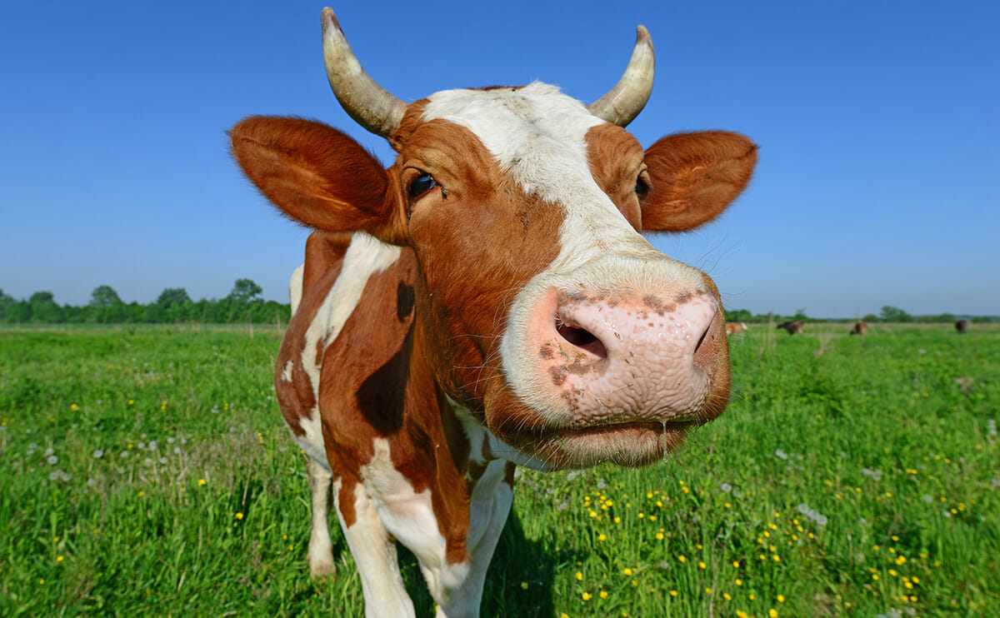

In [1]:
from IPython.display import Image
Image(filename='cow.jpg')

In [11]:
#load packages:

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import csv
import time
import sys
import spacy
import re
from sklearn import svm
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold
from sklearn.decomposition import LatentDirichletAllocation
from collections import Counter
from textblob import TextBlob 
from sklearn.feature_extraction.text import CountVectorizer
from operator import itemgetter
from matplotlib import cm

In [73]:
# #Code to Pull Document Info Data from Regulations.gov

documentId = 'FDA-2018-N-3522-XXXXX' # insert the docket id between quotes (e.g. VA-2016-VHA-0011)
doc = documentId[:-5] #strip off XXXX
url_doc_info = 'https://api.data.gov/regulations/v3/document.json?api_key=Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G&documentId={}'
strNum = 4 # Need for 0 padding

def make_doc_urls():
        return [url_doc_info.format(doc+str(i).zfill(4)) for i in range(0,11906)]

document_info_url_list = list(make_doc_urls())

# **Data Acquistion**
Data was acquired using an API from regulations.gov to request the data in json form from regulations.gov.  We used the comment text, comment title, comment category (submitter type), as well as the number of comments attached and the number of comments received.  "# of Comments Recieved" typically refers to if a comment was a form letter and how many times the FDA curated to the data to append the data set.  

Pulling the data from regulations.gov took approximately 16 hours to run and was run in parts.  The data was then written to txt files and then read in as lists to create a new dataframe. Those text files are attached to this submission. In case you are planning to run the code, we advise you to start where we have indicated.

In [81]:
failed_urls_2 = []
comment_category_2 = []
comment_2 = []
title_2 = []
num_attach = []
num_items_rcvd = []
all_data = []
print(len(document_info_url_list))
for url in document_info_url_list[:2000]:
    time.sleep(5)
    r = requests.get(url)
    if r.status_code == 200:
        json = r.json()    
        num_attached = "NA"
        all_data.append([json])
        if "attachmentCount" in json:
            num_attached  = json["attachmentCount"]["value"]
        num_attach.append([num_attached])
            
        num_items = "NA"
        if  "numItemsRecieved" in json:
            num_items  = json[ "numItemsRecieved"]["value"]
        num_items_rcvd.append([num_items])    
       
        title = "NA"
        if "title" in json:
            title = json["title"]["value"]
        title_2.append([title])

        comment = "NA"
        if "comment" in json:
            comment = json["comment"]["value"]
        comment_2.append([comment])
       
        commentCategory = "NA"
        if "commentCategory" in json:
            commentCategory = json["commentCategory"]["value"]
            print(commentCategory)       
        comment_category_2.append([commentCategory])
        
    else:
        failed_urls_2.append(url)


11906
Food Industry - C0027
Health Professional - A0007
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Private Industry - C0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Association - D0003
Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Media - C0032
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individu

Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Government
Individual Consumer
Individual Consumer
Federal Government - G0007
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Associ

Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consum

Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer


Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer


In [83]:
for url in document_info_url_list[2000:4000]:
    time.sleep(5)
    r = requests.get(url)
    if r.status_code == 200:
        json = r.json()    
        num_attached = "NA"
        all_data.append([json])
        if "attachmentCount" in json:
            num_attached  = json["attachmentCount"]["value"]
        num_attach.append([num_attached])
            
        num_items = "NA"
        if  "numItemsRecieved" in json:
            num_items  = json[ "numItemsRecieved"]["value"]
        num_items_rcvd.append([num_items])    
       
        title = "NA"
        if "title" in json:
            title = json["title"]["value"]
        title_2.append([title])

        comment = "NA"
        if "comment" in json:
            comment = json["comment"]["value"]
        comment_2.append([comment])
       
        commentCategory = "NA"
        if "commentCategory" in json:
            commentCategory = json["commentCategory"]["value"]
            print(commentCategory)       
        comment_category_2.append([commentCategory])
        
    else:
        failed_urls_2.append(url)


Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer


Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Other Organizations - E0003
Federal Government - G0007
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Academia - E0007
Food Industry - C0027
Animal Feed Industry - C0007
Food Association - D0017
Food Industry - C0027
Health Professional - A0007
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Health Professional - A0007
Individual Consumer


Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Consumer Group - B0003
Food Association - D0017
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
State Government - G0012
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Health Professional - A0007
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Federal Government - G0007
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Ani

Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Federal Government - G0007
Food Industry - C0027
Animal Feed Industry - C0007
Health Professional - A0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Federal Government - G0007
Health Professional - A0007
Individual Consumer
Food Industry - C0027
Federal Government - G0007
Food Industry - C0027
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food In

Food Industry - C0027
Individual Consumer
Consumer Group - B0003
Food Industry - C0027
Health Professional - A0007
Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Consumer Group - B0003
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Media - C0032
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed

Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Academia - E0007
Food Industry - C0027
Consumer Group - B0003
Other Organizations - E0003
Individual Consumer
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Individual Consumer
Food Association - D0017
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Food Industry - C0027
Food Industry - C002

In [86]:
for url in document_info_url_list[4000:10000]:
    time.sleep(5)
    r = requests.get(url)
    if r.status_code == 200:
        json = r.json()    
        num_attached = "NA"
        all_data.append([json])
        if "attachmentCount" in json:
            num_attached  = json["attachmentCount"]["value"]
        num_attach.append([num_attached])
            
        num_items = "NA"
        if  "numItemsRecieved" in json:
            num_items  = json[ "numItemsRecieved"]["value"]
        num_items_rcvd.append([num_items])    
    
        title = "NA"
        if "title" in json:
            title = json["title"]["value"]
        title_2.append([title])

        comment = "NA"
        if "comment" in json:
            comment = json["comment"]["value"]
        comment_2.append([comment])
       
        commentCategory = "NA"
        if "commentCategory" in json:
            commentCategory = json["commentCategory"]["value"]
            print(commentCategory)       
        comment_category_2.append([commentCategory])
        
    else:
        failed_urls_2.append(url)


Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Association - D0017
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Other Organizations - E0003
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Consumer Group - B0003
Individual Consumer
Federal Government - G0007
Animal Feed Industry - C0007
Individual Consumer
Consumer Group - B0003
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Individual Cons

Individual Consumer
Health Professional - A0007
Other Organizations - E0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Consumer Group - B0003
Individual Consumer
Other Organizations - E0003
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Health Professional - A0007
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Animal Feed Industry - C0007
Health Professional - A0007
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Health Professional - A0007
Food Industry - C0027
Individual Consumer
International Food Association
Individual Consum

Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Consumer Group - B0003
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Association - D0017
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Health Professional - A0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Consumer Group - B0003
Academia - E0007
Academia - E0007
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Health Professional - A0007
Food Industry - C0027
Individual Consumer
Federal Government - G0007
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Other Organizations - E0003
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Indu

Individual Consumer
Food Industry - C0027
Academia - E0007
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Health Professional - A0007
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Health Professional - A0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Drug Industry - C0022
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Academia - E0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
I

Individual Consumer
Device Association - D0007
Individual Consumer
Academia - E0007
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Consumer Group - B0003
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Other Organizations - E0003
Consumer Group - B0003
Animal Feed Industry - C0007
Individual Consumer
Federal Government - G0007
Animal Feed Industry - C0007
Federal Government - G0007
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Media - C0032
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Academia - E0007
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individu

Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Food Association - D0017
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Animal Feed Industry - C0007
Health Professional - A0007
Academia - E0007
Academia - E0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Individual 

Individual Consumer
Food Association - D0017
Food Industry - C0027
Private Industry - C0003
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Other Organizations - E0003
Food Industry - C0027
Food Association - D0017
Food Association - D0017
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Association - D0017
Food Industry - C0027
Food Association - D0017
Association - D0003
Other Organizations - E0003
Food Industry - C0027
Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Consumer Group - B0003
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Association - D0017
Individual Consumer
Food Industry - C0027
Food Association - D0017
Individual Consumer
Food Association - D0017
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Government

Food Industry - C0027
Consumer Group - B0003
Consumer Group - B0003
Individual Consumer
Academia - E0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Association - D0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Device Industry - C0012
Other Organizations - E0003
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Association - D0017
Food Industry - C0027
Private Industry - C0003
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Academia - E0007
Health Professional - A0007
Animal Feed Industry - C00

Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Indus

Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Food Association - D0017
Food Industry - C0027
Food Industry - C0027
Other Organizations - E0003
Academia - E0007
Animal Feed Industry - C0007
Individual Consumer
Academia - E0007
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Health Professional - A0007
Individual Consumer
Food Industry - C0027
Individual Consumer
Federal Government - G0007
Animal Feed In

Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Association - D0017
Food Association - D0017
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Federal Government - G0007
Food Industry - C0027
Individual Consumer
International Public Citizen - I0007
Food Industry - C0027
Consumer Group - B0003
Food Industry - C0027
Individual Consumer
Consumer Group - B0003
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Media - C0032
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Academia - E0007
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Drug Association - D0012
Food Industry - C0027
Individual Consumer
Animal Feed

Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Academia - E0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Association - D0017
Food Industry - C0027
Association - D0003
Individual Consumer
Federal Government - G0007
Food Industry - C0027
Food Industry - C0027
Consumer Group - B0003
Individual Consumer
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Private Industry - C0003
International Food Association
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individ

Individual Consumer
Academia - E0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Association - D0017
Individual Consumer
Health Professional - A0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Academia - E0007
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Cons

Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Federal Government - G0007
Food Association - D0017
Individual Consumer
Association - D0003
Association - D0003
Association - D0003
Association - D0003
Individual Consumer
Individual Consumer
Private Industry - C0003
Individual Consumer
Other Organizations - E0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Academia - E0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual 

Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Health Professional - A0007
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Association - D0017
Food Industry - C0027
Individual Consumer
Food Association - D0017
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
International Food Association
Academia - E0007
Individual Consumer
Private Industry - C0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual C

Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Federal Government - G0007
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Health Professional - A0007
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Consumer Group - B0003
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Health Professional - A0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Consumer Group - B0003
Health Professional - A0007
Consumer Group - B0003
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
F

Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer


In [89]:
for url in document_info_url_list[10000:len(document_info_url_list)]:
    time.sleep(5)
    r = requests.get(url)
    if r.status_code == 200:
        json = r.json()    
        num_attached = "NA"
        all_data.append([json])
        if "attachmentCount" in json:
            num_attached  = json["attachmentCount"]["value"]
        num_attach.append([num_attached])
            
        num_items = "NA"
        if  "numItemsRecieved" in json:
            num_items  = json[ "numItemsRecieved"]["value"]
        num_items_rcvd.append([num_items])    
    
        title = "NA"
        if "title" in json:
            title = json["title"]["value"]
        title_2.append([title])

        comment = "NA"
        if "comment" in json:
            comment = json["comment"]["value"]
        comment_2.append([comment])
       
        commentCategory = "NA"
        if "commentCategory" in json:
            commentCategory = json["commentCategory"]["value"]
            print(commentCategory)       
        comment_category_2.append([commentCategory])
        
    else:
        failed_urls_2.append(url)


Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Other Organizations - E0003
Food Association - D0017
Food Association - D0017
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Association - D0003
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Private Industry - C0003
Individual Consumer
Association - D0003
Individual Consumer

Consumer Group - B0003
Private Industry - C0003
Individual Consumer
Federal Government - G0007
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Academia - E0007
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Academia - E0007
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Association - D0017
Individual Consumer
Food Industry - C0027
Private Industry - C0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individu

Individual Consumer
Food Industry - C0027
Food Association - D0017
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Association - D0003
Association - D0003
Individual Consumer
Health Care Association - D0022
Individual Consumer
Individual Consumer
Private Industry - C0003
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Private Industry - C0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consu

Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Food Association - D0017
Consumer Group - B0003
Food Industry - C0027
Food Industry - C0027
Health Professional - A0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Health Professional - A0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Health Professional - A0007
Animal Feed Industry - C0007
Food Association - D0017
Private Industry - C0003
Media - C0032
Academia - E0007
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Device Industry - C0012
Food Industry - C0027
Individual Consumer
Other Organizations - E0003
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Association - D0003
Consumer Group - B0003
Food Industry - C

Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Academia - E0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Academia - E0007
Other Organizations - E0003
Food Industry - C0027
Academia - E0007
Association - D0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Private Industry - C0003
Food Industry - C0027
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Association - D0003
Food Association - D0017
Individual Consumer
Food Industry - C0027
Other Organizations - E0003
Individual Consum

In [182]:
# Check the failed urls and the 

print("These are the failed urls:", '\n', failed_urls_2)
print('')
print(len(comment_category_2))
print(len(comment_2))
print(len(title_2))
print(len(num_attach))
print(len(num_items_rcvd))

These are the failed urls: 
 ['https://api.data.gov/regulations/v3/document.json?api_key=Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G&documentId=FDA-2018-N-3522-0000', 'https://api.data.gov/regulations/v3/document.json?api_key=Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G&documentId=FDA-2018-N-3522-3908', 'https://api.data.gov/regulations/v3/document.json?api_key=Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G&documentId=FDA-2018-N-3522-3909', 'https://api.data.gov/regulations/v3/document.json?api_key=Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G&documentId=FDA-2018-N-3522-8028', 'https://api.data.gov/regulations/v3/document.json?api_key=Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G&documentId=FDA-2018-N-3522-8029', 'https://api.data.gov/regulations/v3/document.json?api_key=Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G&documentId=FDA-2018-N-3522-9404', 'https://api.data.gov/regulations/v3/document.json?api_key=Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G&documentId=FDA-2018-N-3522-9405']

11891
11891
11891
11891
11891


In [164]:
print(comment_2)

[['The use of names of "dairy" foods on plant-based products is *not* confusing.   \n\nOur family has no trouble distinguishing between dairy milk products from cows, and plant-based milk products.  Our household includes both and we haven\'t experienced any confusion as to which products contain dairy and which do not.  \n\nThe use of "milk" or "cheese" and similar names on plant-based products is like the designation of "butter" to describe the consistency or use of something, rather than the source.  We have never confused peanut butter, apple butter, and cookie butter - or (non-food) body butter products - with dairy butter.  \n\nThank you!\n'], ['I have not ever been confused by the labeling of plant-based products as "milk". When I ended my use of cow\'s milk in my diet and moved to using almond milk, my four year old was also not confused. It\'s clear to me that plant-based products are using milk to describe their consistency, color, and what they can be used as in recipes and 

In [165]:
print(title_2)

[['Comment from Sarah Reigle'], ['Comment from Kaila McDonald'], ['Comment from Brett Johns'], ['Comment from Jonathan Amaya-Hodges'], ['Comment from Debbie Millman'], ['Comment from Stephanie Berra'], ['Comment from Vicki McDermott'], ['Comment from Anonymous'], ['Comment from Joshua Bowman'], ['Comment from Michael Benhuri'], ['Comment from Ruth Scott'], ['Comment from Anonymous'], ['Comment from Alexandra Friedman'], ['Comment from Timothy Stephen'], ['Comment from Alex Alford'], ['Comment from Jennifer Sexton'], ['Comment from Anonymous'], ['Comment from Jess Bushman'], ['Comment from Rachael DeLashmit'], ['Comment from Greg X'], ['Comment from Jason Preisner'], ['Comment from Mark Qual'], ['Comment from Deborah Young'], ['Request for Extension from National Milk Producers Federation (NMPF)'], ['Comment from Karen Robison'], ['Comment from Jessica Breen'], ['Comment from A Good'], ['Comment from Steven Moskowitz'], ['Comment from Zarah Austin'], ['Comment from Jon Fish'], ['Comment

In [166]:
print(num_attach)


[['0'], ['0'], ['0'], ['1'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['1'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['1'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0'], ['0']

In [167]:
print(num_items_rcvd)

[['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['0'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1'], ['1']

In [168]:
# Write the data to a txt file

with open("commenttype.txt", "w") as f:
    for element in comment_category_2:
        f.write(",".join([str(x) for x in element]) + "\n")
        
with open("commenttext.txt", "w") as f:
    for element in comment_2:
        f.write(str(element) + "\n")
        
with open("title.txt", "w") as f:
    for element in title_2:
        f.write(str(element) + "\n")

with open("NumberofAttachment.txt", "w") as f:
    for element in num_attach:
        f.write(",".join([str(x) for x in element]) + "\n")
        
with open("NumberofItems.txt", "w") as f:
    for element in num_items_rcvd:
        f.write(",".join([str(x) for x in element]) + "\n")

## Run from here: 
You can start to run our code from here. 

In [7]:


api_key = 'Ko3O9SHZoUMydp29GLXItSXZBdkXj74dI5UHY75G' # insert your api key between quotes
docket_id = 'FDA-2018-N-3522' # insert the docket id between quotes (e.g. VA-2016-VHA-0011)
total_docs = 12000  # total number of documents, as indicated by the page for the given docket id
docs_per_page = 1000  # maximum number of results per page; no reason to change

url = ('https://api.data.gov:443/regulations/v3/'
       'documents.json?api_key={}&dktid={}&rpp={}&po={}')
def make_urls():
    return [url.format(api_key, docket_id, docs_per_page, i)
            for i in range(0, total_docs, docs_per_page)]

def get(url):
    r = requests.get(url)
    if r.status_code == 200:
        return r.json().get('documents', {})
    else:
        return {}

def save_batch(batch, ix):
    keys = set(k for d in batch for k in d.keys())
    with open('batch_{:03d}.csv'.format(ix), 'w', encoding='utf-8') as op:
        wr = csv.DictWriter(op, fieldnames=sorted(keys))
        wr.writeheader()
        wr.writerows(batch)

def fetch_urls(urls):
    data = {}
    errors = []
    urls = make_urls()
    for i, url in enumerate(urls):
        d = get(url)
        if d:
            data[url] = d
            save_batch(d, i)
        else:
            errors.append(url)
            print('error on url {}'.format(url))
        time.sleep(5)

    with open('error-urls.txt', 'w', encoding='utf-8') as op:
        for e in errors:
            op.write(e)
            op.write('\n')
text_comment={}
title={}
dock_id={}
x=[]
list1=[i for i in range(12)]
id_dict=0

for i in list1:
    x.append(get(make_urls()[i]))
    #print(x)
for link in x:
    for dictionary in link:
        for i in dictionary.keys():
            if i=='commentText':
                text_comment[id_dict]=dictionary['commentText']
                id_dict+=1
id_dict=0
for link in x:
    for dictionary in link:
        for i in dictionary.keys():
            if i=='commentText':
                title[id_dict]=dictionary['title']
                id_dict+=1
id_dict=0
for link in x:
    for dictionary in link:
        for i in dictionary.keys():
            if i=='commentText':
                dock_id[id_dict]=dictionary['docketId']
                id_dict+=1

id_dict =0
num_comments ={}
for link in x: 
    for dictionary in link:
        for i in dictionary.keys():
            if i == 'commentText':
                num_comments[id_dict]=dictionary['numberOfCommentsReceived']
                id_dict+=1

# Dict for number of attachments 
id_dict =0
num_attach ={}
for link in x: 
    for dictionary in link:
        for i in dictionary.keys():
            if i == 'commentText':
                num_attach[id_dict]=dictionary['attachmentCount']
                id_dict+=1
    


In [8]:
# Now read in the data from text files to lists

comment_category_2_read_in = []
comment_2_read_in = []
title_2_read_in = []
num_attach_read_in = []
num_items_rcvd_read_in = []
with open("commenttype.txt", "r") as f:
    for line in f:
        print(line.strip())
        comment_category_2_read_in.append(str(line.strip()))
with open("commenttext.txt", "r") as f:
    for line in f:
        print(line.strip())
        comment_2_read_in.append(str(line.strip()))
with open("title.txt", "r") as f:
    for line in f:
        print(line.strip())
        title_2_read_in.append(str(line.strip()))
with open("NumberofAttachment.txt", "r") as f:
    for line in f:
        print(line.strip())
        num_attach_read_in.append(str(line.strip()))
with open("NumberofItems.txt", "r") as f:
    for line in f:
        print(line.strip())
        num_items_rcvd_read_in.append(str(line.strip()))


Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Private Industry - C0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Association - D0003
Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Media - C0032
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Academia - E0007
Individual Consumer
Individual Consumer
Individua

Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consum

Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer


Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Health Professional - A0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual C

Animal Feed Industry - C0007
Individual Consumer
State Government - G0012
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Health Professional - A0007
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Federal Government - G0007
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Academia - E0007
Individual Consumer
Animal Feed Industry - C0007
Health Professional - A0007
Individual Consumer
International Public Citizen - I0007
Individual Consumer
Health Professional - A0007
International Public Citizen - I0007
Animal Feed Industry - C0007
Individual Consumer
Individual Con

Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Consumer Group - B0003
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Media - C0032
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Academia - E0007
Food Industry - C0027
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Consumer Group - B0003
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual C

Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Federal Government - G0007
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Food Industry - C0027
Individual Consumer
Food Association - D0017
Individual Consumer
Federal Government - G0007
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Academia - E0007
Individual Consumer
Individual Consumer
Food Industry - C0027
Media - C0032
Animal Feed Industry - C0007
Individual Consumer
Federal Government - G0007
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Association - D0003
Individual Consumer
Health Professional - A0007
Food Industry 

International Public Citizen - I0007
Food Industry - C0027
Consumer Group - B0003
Animal Feed Industry - C0007
Food Association - D0017
Food Association - D0017
Individual Consumer
Individual Consumer
Private Industry - C0003
Animal Feed Industry - C0007
Individual Consumer
Consumer Group - B0003
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Academia - E0007
Individual Consumer
Government
Food Industry - C0027
Animal Feed Industry - C0007
Individual Consumer
Federal Government - G0007
Animal Feed Industry - C0007
Individual Consumer
Food Association - D0017
Food Industry - C0027
Health Professional - A0007
Consumer Group - B0003
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Other Organizations - E0003
Individual Consumer
Health Care Association - D0022
I

International Consumer Group - I0012
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Consumer Group - B0003
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Individual Consumer
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Animal Feed Industry - C0007
Consumer Group - B0003
Health Care Association - D0022
Individual Consumer
Animal Feed Industry - C0007
Drug Industry - C0022
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Association - D0017
Consumer Group - B0003
Animal Feed Industry - C0007
Academia - E0007
Individual Consumer
Individual Consumer
Food Industry - C0

Other Organizations - E0003
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Health Professional - A0007
Individual Consumer
Food Industry - C0027
Food Association - D0017
Individual Consumer
Food Association - D0017
Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Academia - E0007
Food Industry - C0027
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Food Industry - C0027
Consumer Group - B0003
Private Industry - C0003
Individual Consumer
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Indivi

Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Association - D0003
Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Consumer Group - B0003
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Association - D0003
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Other Orga

Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Academia - E0007
International Public Citizen - I0007
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Academia - E0007
Other Government - G0022
Private Industry - C0003
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Individual Consumer
Association - D0003
Individual Consumer
Food Industry - C0027
Food Industry - C0027
International Public Citizen - I0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Association - D0017
Food Industry - C0027
Individual Consumer
Food Association - D0017
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Health Professional - A0007
Individual Consumer
Food Industr

Food Industry - C0027
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Association - D0017
Individual Consumer
Food Industry - C0027
Private Industry - C0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Individual Consumer
Consumer Group - B0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Association - D0003
International Food Association
Food Industry - C0027
Association - D0003
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C0027
Food Industry - C0027
Individual Consumer
Food Industry - C0027
Animal Feed Industry - C0007
Food Industry - C0027
Private Industry - C0003
Food Industry - C0027
Food Industry - C0027
Private Industry - 

Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Health Professional - A0007
Animal Feed Industry - C0007
Food Association - D0017
Private Industry - C0003
Media - C0032
Academia - E0007
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Animal Feed Industry - C0007
Device Industry - C0012
Food Industry - C0027
Individual Consumer
Other Organizations - E0003
Animal Feed Industry - C0007
Individual Consumer
Food Industry - C0027
Association - D0003
Consumer Group - B0003
Food Industry - C0027
Animal Feed Industry - C0007
Individual Consumer
Individual Consumer
Individual Consumer
Food Industry - C0027
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Private Industry - C0003
Individual Consumer
Individual Consumer
Individual Consumer
Individual Consumer
Association - D0003
Health Professional - A0007
Animal Feed Industry - C0007
Food Industry - C0027
Food Industry - C00

['The use of names of "dairy" foods on plant-based products is *not* confusing.   \n\nOur family has no trouble distinguishing between dairy milk products from cows, and plant-based milk products.  Our household includes both and we haven\'t experienced any confusion as to which products contain dairy and which do not.  \n\nThe use of "milk" or "cheese" and similar names on plant-based products is like the designation of "butter" to describe the consistency or use of something, rather than the source.  We have never confused peanut butter, apple butter, and cookie butter - or (non-food) body butter products - with dairy butter.  \n\nThank you!\n']
['I have not ever been confused by the labeling of plant-based products as "milk". When I ended my use of cow\'s milk in my diet and moved to using almond milk, my four year old was also not confused. It\'s clear to me that plant-based products are using milk to describe their consistency, color, and what they can be used as in recipes and di

["I believe that allowing plant-based products to use dairy terms gives the illusion to consumers that it is of a similar quality as the dairy product.  I don't think that there is much confusion of what is actually in the packaging, but there are misconceptions about the nutritional value of the product.  There are many specifications that Milk has to meet in order to be called milk.  Milk is strictly regulated and frequently inspected in order to be able to use the label.  I find it disappointing that other beverages have been able to just use the word Milk as a term but not be the actual end product.  I feel strongly that this should be remedied.  Rules have been in place for a long time now they just have to be enforced.\n\n"]
['Food labeling should refer to the final product, so "milk", "yogurt", "mayonnaise" should be on a label of that product, \nregardless of the origination of the product. I think that labeling what kind of milk (i.e. Almond, Soy etc.) is a good way of \ndefin

["It is not confusing at all. You would have to be an idiot to be confused about what you were buying. All you have to do is take 3 seconds to look at the package. The dairy industry are being a bunch of babies because oh the times are changing and people want HEALTHY food. Most stores don't even put these products in the same areas next to each other anyways."]
['If a products labels itself as "almond" milk, it is completely obvious and understood that it is an almond product, not a dairy product. ']
['As long as the product has a qualifier that is easily visible, such as "Almond Milk", "Dairy-free Cheese", "Nut Cheese" and so on, then I do not see a need to regulate on this issue any further.  \n\nPlant-based diets and lifestyle choices are growing rapidly, and consumer awareness of them is at an all-time high.  There is no need to restrict the language used to denote these products, as many of them have been on the market for decades already.']
['No issue with plant based items usin

["This is entirely clear according to the labels that this is dairy free. There are multiple reasons for dairy alternatives. When I look for almond milk it's plainly labelled as such. Dairy free yogurt also has straightforward labelling. Dairy free or vegan cheese shows this on the labels and it is easy to tell the difference from the packaging. I have never confused dairy free milk, cheese, or yogurt with standard dairy products. I have never seen or heard of a situation from friends, family, or acquaintences where dairy free products were mistakenly purchased. It would be poor marketing for a dairy free brand to not label a product as dairy free. The details are obvious. It will always say vegan, dairy free, or even show the source of the dairy alternative listed next to the type of food or drink such as rice milk, almond yogurt, nut cheese. Brands want their alternative products to be as easily recognized as possible to reach their targeted consumers. Every front label I have seen h

['FDA,\n\nThank you for being open to public comments. I appreciate your work to keep Americans safe and healthy!\n\nDairy products labeled as such should only be made from the secretions, milk, of mammary glands.\nThese products have been obtained, crafted, and distributed for many years. Only in recent decades have\ncompanies sought to financially gain from producing foods mimicking genuine dairy products. To use \nthe name society has given dairy products in selling and distributing man-made products imitating\nconventional milk derived goods is false representation, misleading, and a blatant attempt to capitalize\non consumers\'. \n\nFood products are held to high standards for quality grade, nutrient content, freshness, wholesomeness,\nand other criteria. If a 1% skim milk was labeled as whole milk, fines, penalties, and more consequences\nwould be leveled against the offending manufacturer. Why? Because the product was mislabeled and\nclaimed to be something other than what it is

['In the market, substitutes for milk are always providing their source additionally to the dairy based name "milk". Those being along the lines of "almond milk", "cashew milk", "soy milk", "oat milk". The addition of milk shouldn\'t be limited to dairy products so much to the fact that it doesn\'t describe specifically dairy. The very word dairy is the equivalent to that of almond, soy, so on and so forth. The milk is used in this case as an adjective to describe the consistency and use of that product. Just as juice directly links to the idea of fruits, milk directly links to the idea of creamy, white/flavored consistency. Often used in baking and additive eating. Cheese being more ambiguous but leading the same idea. Dairy Cheese specifying those from cows milk, Goat Cheese specifying those from goats milk, Almond Cheese specifying those from almond. If there is a present confusion on the source of these items, make mandatory the inclusion of the source in the label, or make an addi

["As long as the dairy alternatives are clearly labeled (which they already are) I see no justification for the FDA spending its budget on regulations whose unstated intention is to place an unnecessary burden on the makers of plant-based products.  Let's be honest.  This is nothing more than a political sop to the US dairy lobby that is putting forth the ridiculous claim that consumers are either too stupid to know the differences between dairy products and their alternatives or too apathetic to care.\n\nWe can read the label to know what we are buying and if we have any questions about plant-based products there is plenty of information readily available from the Internet, public libraries, and from our health care providers.  Add to that the fact that in an age where new scientific evidence is constantly coming to light, whatever we know today about both kinds of products may well be amended, corrected, revised, or refuted so as to make moot any claims for or against the products in

['The words yogurt, milk, and cheese should not be limited to animal products.  There are varieties of these products that can be made without dairy but are equally valid within the food category.  Making it illegal to sell soy milk as opposed to soy beverage does not change the fact that it is a plant-based milk beverage that can be used as in equivalent amounts as animal milk beverages.  Perhaps the solution is to label dairy products as "cow\'s milk", "goat\'s milk", "cow yogurt", "coconut yogurt", "soy cheese", and "sheep cheese" in order to clarify the source of the ingredient. \n\nConsumers should be able to make their own free choice as to which type of milk or cheese they wish to purchase.  They should not have to search for "cheeze" or "beverage" products to please the dairy industry.  This is psychological marketing that subconsciously pushes consumers to view plant-based products as fake version of the "real" thing.  Government should not perform marketing services on behalf

['I find the suggestion that consumers are confused by products labelled "almond milk", "soy cheese" or "cashew yogurt" quite ridiculous and I believe it to be a transparent ploy by the dairy industry to force plant-based product producers to label their products using vague and unclear names instead. If the FDA truly is worried about confusing consumers, they should be worried about consumers having to decipher products labelled, "almond drink", "soy shreds" or "gelled cashew snack". Those are the labels that consumers would find confusing, not the life-long familiar labels of "milk", "cheese" and "yogurt".\n\nI use all of these products in my daily diet. I pour almond milk over my cereal in the morning and hazelnut milk into my coffee just as someone else would pour cow\'s milk or cow\'s cream. For a snack, I spread soy cheese onto crackers or dip a spoon into a cashew yogurt just as someone else would snack on cow\'s milk cheese or cow\'s milk yogurt. The very ubiquity of the names 

["First, the primary definition of meat is food, and the edible part of a larger entity.  \n\nLike the jackfruit meat.  \n\nDefinition ofMeat\n\n1a:FOOD, especially:solid food as distinguished from drink\n\nb:the edible part of something as distinguished from its covering (such as a husk or shell)\n\n2:animal tissue considered especially as food:\n\na:FLESHsense 2b\nalso:flesh of a mammal as opposed to fowl or fish\n\nb:FLESHsense 1a\nspecifically:flesh of domesticated animals\n\n3archaic:MEALentry1sense 1especially:DINNER\n\n4a:the core of something:HEART\n\nb:PITHsense 2ba novel withmeat\n\n\n\nRegarding milk.  What are we supposed to call coconut milk instead?  Nonmamary white goo?  Milk has always been its name.\n\nSoy milk has existed in the US since the late 1800s.\n\nAlmond milk has been used and described as such since the medieval ages.\nhttps://www.smithsonianmag.com/history/nut-milks-are-milk-says-almost-every-culture-across-globe-180970008/\n\nThe fact that we're having thi

["1. Why do consumers purchase and consume these types of plant-based products? How do they use these products? Specifically, do consumers purchase these plant-based products for use as substitutes for their dairy counterparts, or do consumers purchase these plant-based products for distinct uses? If consumers use these plant-based products as substitutes for dairy foods (for example plant-based beverages as alternatives to milk), what are their reasons? Do consumers think they are healthier, and if so, why? Are consumers purchasing these plant-based products because they may be allergic to dairy or are lactose-intolerant? Are consumers purchasing these plant-based products for reasons related to their personal consumption habits, such as a vegan diet? If consumers do not use these plant-based products as substitutes for dairy foods, what are their reasons for choosing these products? (For example, do these products provide unique taste, flavor, or texture?) Does consumer purchasing be

['Yes, I know that soy, almond, or hemp milk and vegan cheeses do not come from a cow! That is exactly why I prefer consuming them.  As a conscientious consumer that regularly researches new products and reads product labels, I am fully aware of and understand the differences between the basic nature, characteristics, ingredients, and nutritional content of plant-based products and their dairy counterparts. ']
['If the substance originates in the mammary glands of mammals and is necessary for growth of the mammilian offspring, it is milk. Nothing else meets that defination.']
["Why not do it the other way around and have a label that all products with real dairy have to use?\nThis way the dairy corporations can use the dairy-label to show what their product is made of.\nI'd also suggest the same for meat and eggs."]
["This entire request for input seems ridiculous. Merriam-Webster defines milk as,a food product produced from seeds or fruit that resembles and is used similarly to cow's 

['I am not sure why dairy companies think that they own the word, "milk."  We naturally have coconut milk, and no one is confused about the term.  We have human breast milk, and no one gets that confused with cows\' milk!  \n\nWe now have wonderful, lower fat, plant-based milks, without IGF-1 growth hormones and without cruelty to animals.  We do not need to have a different name for milk in order to recognize the products - we are already buying the products in droves, and that is what is bothering the dairy industry!  \n\nI love my soy milk and use almond milk in cooking.  Do I get confused by the word, "soy" in my soy milk?  Do I think soy is only for the crop in the field?  Do I think there will be lumps of green soy pods in the milk carton?  No, of course not.  I know what soy milk is.  \n\nLet us keep the word, milk for plant products.  The dairy industry is just trying to make us lose money over having to re-label everything.  If they were intelligent and caring, they would not 

['I\'m incredibly disappointed in my government for taking this issue seriously. Dairy lobbyists are just upset people are realizing animal products are not as healthy and not nearly environmentally friendly as plant-based alternatives. There is absolutely 0 evidence of people misinterpreting the labeling of these products for the other. I get it, the lobbyists are giving you a fat paycheck, but at what cost? You (not actually you, I mean Scott Gottlieb and anyone who\'s pushing this ridiculous agenda) look so stupid it physically pains me. No wonder why our country is the laughing stock of the world. "Issues" like this are why no one takes our country seriously. This is not, and should not, be a legitimate issue.']
['Everyone knows the difference between plant based and animal based milk, yogurt, and cheese. Are we really wasting Amercian taxpayers money on this? This is clearly a ploy by the dairy industry to stop people from switching to plant based products. ']
['I am commenting on

["Why do consumers purchase and consume these types of plant-based products? Because they are much more healthy, NO antibiotics, NO vaccination residues, and do NOT contribute to the corrupt, polluting meat industry. These bullies in the cattle industry don't even want us to have OUR wild horses, OUR wildlife sanctuaries, OUR land for hiking, camping, bird watching, etc. This is OUR country, OUR government and these lying bullying cattlemen would have us believe it ALL BELONGS TO THEM. Let me be clear: YOU nor CATTLEMEN have a right to FORCE us into accepting these lies or your polluting factory farms where you're able to torture and abuse GOD'S animals with impunity, while RUINING OUR AIR, WATER AND LAND!\n\nDo consumers perceive these plant-based products to be more nutritious, as nutritious, or less nutritious than their dairy counterparts? Far more nutritious than dairy because you pump these animals up with antibiotics and vaccines to keep them STANDING long enough to deliver to s

['The term almond milk has been used for thousands of years to describe the liquid that comes from soaking ground almonds. Restricting the term "milk" to only the mammary secretions of a cow is only an attempt by the dairy industry to bully competition. No one is confused by the naming. No one thinks peanut butter is churned cow\'s milk. No one thinks almond milk comes from cows. By allowing this regulation to pass, it shows that the FDA is not trying to protect public health. They\'re only trying to protect it\'s lobbyists. \n\nPlease do not allow this regulation to pass. ']
['There is no confusion about purchasing plant based non-dairy alternatives. I seek out plant based foods because I believe them to be more ethical, healthy, and eco-friendly.  The labeling argument is unwarranted.  Allow plant-based product to say milk, cheese, etc. ']
['I do not believe there needs to be regulation on dairy vs. non-dairy products. Food labeling as companies have been doing so has been more than 

['Hello,\nIm writing about the labeling of plant based products.  I think it is an absurd assertion to imply that consumers would be confused when buying plant based alternatives to Dairy products and might accidentally buy a plant based product rather the animal based dairy.  This labeling initiative (to impose new rules to plant based companies) seems like a desperate attempt by the dairy industry to negatively impact plant based companies and re-claim some of their market share.  But the dairy industry isnt losing market share because of consumer confusion; quite the opposite!  People are realizing how unhealthy, inhumane, and bad for the environment dairy is, and they are very consciously switching to plant based alternatives. \n\nThe words milk and meat do not (and never have) implied strictly animal based products.  The liquid and solid contents of Coconuts have always been called  coconut milk and coconut meat. \n\n2/3rds of humans on earth are lactose intolerant, and cows milk 

['The existence of this is insulting to the intelligence of the consumer. When people purchase plant based milks or cheeses they are aware thet they are purchasing plant based products over dairy products. 100% of the time these products are in non-dairy sections of stores and have labels that include that they are almond milk based products, soy milk based products, flax milk based products etc. They also have sufficiently labelled nutritional information and ingredients so consumers can look at that and make judgements as to their dietary needs based off the nutritional information given. If there is sufficient nutritional labelling and a clear distincition that a product is almond milk, flax milk, rice milk, pea milk etc. and placed in the non dairy section that is sufficient information for consumers to know that they are consuming a non dairy food. For many people this is INTENDED for many reasons. Confusion is not the reason for the rise in consumption of plant based products. Al

['I absolutely think plant based equivalents of milk, yogurt, cheese etc should be allowed to use that term. They have the same culinary use, similar appearance and flavor. If a recipe uses milk, you can easily switch it for plant-based milk with no issue. Having to come up with a different term for plant-based products would make everything a lot more confusing. Why should we have to rename everything just because it doesn\'t contain dairy? Should we start calling dairy-free ice cream "sweetened frozen soy beverage"? Should gluten free products not be allowed to use terms such as bread, pasta, flour and cookies? In my opinion, "milk" is a culinary term that should be used in the same way as flour. It\'s used in the same way, but it has lots of different variations. Wheat flour. Buckwheat flour. Rice flour. Corn flour. Milk also has different variations. Dairy milk. Almond milk. Soy milk. Cashew milk. Nobody would see a carton of almond milk in the store and mistake it for regular milk

['I understand the terms milk, cultured milk, yogurt, and cheese as follows:\n\nThey are generic terms that identify foods for human consumption.\n\nMilk is a liquid substance.\nCultured milk is a liquid substance that contains beneficial bacteria.\nYogurt is a soft coagulated substance that includes beneficial bacteria.\nCheese is a softer or harder coagulated substance.\n\nSources of these foods may be the mammary secretions of female mammals, for example, cows, goats, horses, zebras, llamas, giraffes, cats, dogs, and humans.  Products that are derived from these sources are typically labeled "milk," "cultured milk," "yogurt," and "cheese."\n\nSources of these foods may also be from plants such as soybeans, rice, oats, almonds, walnuts, hazelnuts, cashews, etc.  Products that are derived from these sources are clearly labeled with text that indicates their source, for example:\n\nsoy milk\nrice milk\nalmond milk\ncashew milk\noat milk\nsoy yogurt\nsoy cheese\ncashew cheese\n\nThe pro

["In what way is calling plant milk 'milk' confusing for customers?\n\nThere isn't a customer out there who thinks that 'Almond Milk' has dairy in it.\n\nThe differences in nutrition are clearly labeled on the outside of the package. The customer is already being informed of the nutritional content.\n\nIf you go to Starbucks and get a cup of coffee, you have a choice between many milks: soy milk, almond milk, coconut milk...\n\nNote that 'coconut milk' has been called 'coconut milk' for a very, very long time. No one seems confused by coconut milk.\n\nThis comes off as a very heavy-handed attempt by the animal agriculture industry to try to 'pick a winner' in the market and apply unnecessary inconveniences and regulations to plant-based products, in an attempt to confuse the customer.\n\nInterestingly, it's being pitched the other way. That, in fact, these labels are 'confusing' to customers.\n\nExcept they aren't. They are exploding in popularity.\n\nHaving to call something 'Almond D

['1. Do consumers understand that certain plant-based products might have a nutritional content that is not adequate to place them in the dairy group as described in the Dietary Guidelines? How does this influence their purchasing behavior with respect to plant-based products and dairy foods?   \n--Due to existing food labeling requirements, consumers know exactly what they purchase when they buy plan based milk products.  I know what my total nutritional requirements are and follow the labels on all items (regardless of the name you put on it).  If you think I don\'t know what I am getting, then your food labeling standard is the problem. \n--Unfortunately for the lobby that is pushing this, changing the name "milk" on plant based products will not move me to purchase animal based "Dairy."  \n\n2. Do consumers who purchase or consume plant-based products instead of dairy foods, such as yogurt or cheese, believe that these plant-based products meet the dairy group recommendation descri

['I work as a Dairy manager in a grocery store for the past 20 years. I have seen the rise of plant based products from its infancy to now where its about 10 percent of the departments sales. To me its easier for customers and employees who work in stores to say soy milk, almond milk, or vegan cheese. People know that these products do not come from cows or goats. People just want to say what they think its closely related too. If the government makes come change the labels people will still buy the products but they wont understand why it was changed or if they hear why its changed they will just pass judgement on the Dairy industry. In the end it should stay the same how its been and just updated FDA code so that milk, yogurt and cheese are more of a generic term.']
['Almond Milk has been known as a "milk" since the middle ages. I doubt few if any consumers would be so confused to think that products such as almond milk, soy milk, etc are dairy-based. Rather, these labels are used to

["Names like 'milk' and 'cheese' should not be restricted to animal-derived products. Several points make it clear that such regulations are being proposed by the dairy industry simply to suppress competition.\n\nOne, 'milk' has always been a more generic term, and products like canned coconut milk and milk of magnesia have existed without controversy. Plant-based milks seem to be under scrutiny now because they are competing with a more dominant industry.\n\nSecond, these names do not have the uniform, fixed meaning among consumers that the dairy industry would claim. Many people I personally know believe that a 'cheese-like' product does not contain dairy milk simply because it does not technically contain real cheese.\n\nThird, issues of misleading labeling are more pervasive in foods containing dairy. Consumers would not expect that products labeled 'non-dairy' such as coffee creamers actually contain milk ingredients, and I'm not sure how such labeling is even legal. They do not p

['Dear Ladies and Gentleman of the FDA, \n\nThank you for opening this comment section to the public. Let me first say, that we as consumers who purchase these products are not confused about why we are buying plant-based milk. We know they don\'t contain the same nutrients as cow\'s milk and we\'re also aware they\'re fortified to replace certain lost nutrients. However, it\'s also upsetting that cow\'s milk is marketed to consumers and children as the only option with the most nutrients because of money when clearly, they\'re not the only option. \n \nI personally consume soy milk because I\'m not only vegan and don\'t believe in consuming cow\'s milk for optimal health or animal welfare, but also because I enjoy it and love that it\'s a heart-healthy source of protein. I used to love almond milk. My brother, who is not dairy-free, also loves almond milk and knows it doesn\'t come from a cow. Same with my stepdad. I\'m a 33-year-old woman and am very educated, like most people who bu

['Hello, my name is James. I have been a Vegetarian for over 20 years. Just 4 years ago, I became a Vegan.\nMy family comes from farmers. My Dad worked on farms, my Mom worked on farms. I love farming. But I love animals more.\nI believe that many people are beginning to realize what type of business produces conventional milk, or cheese, etc.\nI live in the middle of Amish country. I see it every day.\nGod gave me a different path in my life. He gave me a giant heart to love all of God\'s creation.\nPeople like me, we have big hearts, and we also want to be heard.\nWe enjoy our Almond Milk, in fact we depend on it. I enjoy my Coconut milk yogurt, my Vegan cheese.\nThe really sad thing is, we are paying a much higher price for our food, and at the same time, we are being chastised for having and "alternative" type of food.\nThings are changing, our environment can\'t support these farms anymore. It is not ethical, nor sustainable. In fact, it\'s a disaster waiting to happen.\nWhy is th

["I am aware that SOY MILK is not DAIRY MILK, but I PREFER the term SOY MILK because that way I know I can eat is as I would with DAIRY MILK, like on coffee, cereal, etc. I think is OK to use the terms MILK, CHEESE, and YOGURT for PLANT-BASED options. I think the term refers to the kind of food it is and not about the ingredients. These days everybody checks labels, so the main title doesn't matter. Please keep PLANT BASED MILK, PLANT BASED CHEESE, and PLANT BASE YOGURT. Everybody know these products do NOT contain DAIRY. Please name COW MILK, COW CHEESE and COW YOGURT. Thank you!"]
['Plants and animals produce milk. Containers with COW MILK should be labeled COW MILK. Making cheese is a process and can be made from various milks,']
['I have no confusion about the labeling of animal-based dairy vs. plant-based products. The labels on these products are clear and I can read. There is no reason why only animal products have a monopoly on the names "milk," "cheese," "yogurt," etc.  Based 

["I have never once been confused into thinking a plant-based milk or other plant-based dairy product contains cow's milk or other animal-based milks. I specifically seek out these products because they do NOT contain cow's milk. Humans have been drinking plant-based milks for centuries (food historians find almond milk was well-known in the Middle Ages and soy milk was invented by the ancient Chinese). Drinking fluid cow's milk (or other mammal milk) is a modern invention. My son and husband are lactose-intolerant so I'm always looking for foods free of dairy. I find that cow's milk is snuck into a lot of products. I've also noticed that in grocery stores some cow's milk products are now getting themselves placed next to the plant-based milks and yogurts. That I find confusing - people go to these sections to avoid dairy products. No one who can read would pick up a plant-based milk and think it is the secretions of a cow. People have stopped drinking cow's milk for health and environ

["Of course consumers understand what we're buying. Nor are we stupid enough to believe this concern is the real reason for your call for comments. It's clear you are trying to prop up a failing industry at the expense of an industry experiencing high consumer demand. Do you also think people are confused by the plant named milkweed and try to milk it??? No, of course not. There is no confusion or controversy involved in labeling plant based milks and yogurts as such. "]
['You would also have to get rid of "milk thistle" a plant name.']
["I have never had a problem recognizing dairy versus alternative milk. Brands are quite clear to differentiate their products, whether it's whole or skim, raw or ultra-pasteurized, coconut or soy. I, and some of my friends avoid dairy due to lactose intolerance, and we've found that all items that cater to these limitations are very clear that they are non-dairy. I've never accidentally thought one was actually dairy. I think you should leave things as

['Any milk-like substance should be labelled as "milk" and should be required to specify the type of milk in the container.  Examples would include cow, goat, soy, almond, coconut,etc.  This would alleviate any question and would also help individuals to more clearly identify potential allergens.  Also, information about antibiotics, growth hormones, or additives should be obvious and clearly legible.']
["Consumers are not so stupid that they can't understand that soy or almond milk don't come from an animal. Duh."]
['I think it is too late to change the names "milk," "cheese", and ice "cream" to be exclusively dairy foods. That boat has sailed. Even though most plant-based products are actually not labeled as such, consumers will keep calling the products (almond) milk vs. Almond non-dairy beverage (as it\'s already printed on the plant-based product\'s packaging). Don\'t waste time or money on this! As long as on the label it says the plant it\'s based on, it\'s MILK, CHEESE, ICE CRE

['For me the use of the dairy name in plant based products makes it easier for me to understand what I am buying.  I developed a dairy intolerance later in life at age 32 and had to switch from a full dairy diet to a plant based substitute diet.  Having names like Soy Milk or Tofutti Sour Cream helps me understand the plant base of the product as well as understand what it is a substitute for.  The containers are actually more clearly marked for plant based items than for full dairy items.  I read containers on a regular basis to check for dairy products, and I often have to read the entire ingredient list on some full dairy items due to interesting product descriptions or labels such as "non-dairy creamer" (which in fact does contain dairy - I find this to be a much more concerning issue).  More often than not, plant based items are clearly labeled and have a much higher price point than their full dairy counterparts.  In my experience, they are often found on the top/bottom/edge of t

['Please do not submit to the pressures of a receding industry grasping at straws to maintain a monopoly on a market segment. Consumers are not buying dairy alternative milks because they are confused and cant understand what dairy milk is and is not. On the contrary, consumers are making informed choices for their health, the treatment of industrialized animals, and the use of our planets limited resources. If we set this precedent, where does it end? Is peanut butter no longer a valid name because its not dairy butter? (Not to mention body butter lotions in the skin care aisle!) Veggie and turkey burgers no longer qualify as burgers because theyre not beef? (Do beef patties even qualify as hamburgers since ham is pork?) What about the term nut meat, long used to refer to the edible portion of a nut inside the shell? No more soy or turkey bacon because theyre not from pigs? \n\nPlease refer to the following article about the historical use of the word milk.\n\nhttps://www.smithsonianm

['The use of plant based products to replace milk, yogurt, cheese, or any other dairy product is a switch that many consumers are making and a switch that is on the rise. This is a growing market that should be of interest to the Dairy Industry to consider joining, instead of being against. Many consumers are making this switch with concerns for health, when dairy is linked to cancer, including breast cancer, prostate cancer, and even MS. IGF-1 is a big concern of increasing cancer risk which is promoted by dairy protein. Where as plant protein or plant based diets have been shown to benefit those with cancer, and MS. I also personally want to encourage the FDA to use our tax dollars to help farmers transition to growing crops and moving away from animal agriculture so they can support themselves and their families and contribute to a growing demand of plant based products, and not be left behind or risk losing their farms. By instead switching to growing crops to join the demand of pl

['Regulations definitionally burden businesses and should therefore *only* be implemented when they serve the public good, for example by clarifying the origin of a product.\n\nBut all non-dairy milk substitutes are already clearly labeled with their origin right in the name: "soy milk", comes from soybeans, "hemp milk" from hemp, "almond milk" from almonds. There isn\'t a moron in America that thinks that almond milk comes from almond-colored cows.\n\nDon\'t write rules just for the sake of feeling useful. That\'s the left\'s job.\n\n']
['"Soy milk" is not confusing at all. Consumers of these products, like me, are fully aware they are not dairy and have a different nutritional profile. This is usually the specific reason we buy them!\n\nIt is common to use familiar terms to describe products, like "bean burger". This is not confusing; it is natural language. Attempts to regulate the use of common terms like these have less to do with consumer protection and more with protecting the f

['Anyone who is confused by the idea that almonds, cashews, oats, hemp, and beans do not lactate is likely too confused to purchase milk of any kind. Plant-based products are usually clearly labelled as such, have ingredients lists, and often have brand names that include terms like "vegan" and "plant-based." What\'s more, plant-based products are rarely placed alongside animal products in stores. And, as far as I can tell, there\'s been no confusion about the likes of coconut milk, and milk of magnesia. \nPlant-based milks are referred to as such in innumerable cookbooks and blogs. The word "milk" with no qualifiers isn\'t even exclusive to dairy inguistically speaking. No native speaker of English would hear "you\'re really milking it" and think that "it" is a cow. The act of milking isn\'t even specific to fauna. When a word can be used as an abstract concept and action as well as an item, you can\'t argue that uses not pertaining to a specific item confuse people. ']
['I do not bel

['I am a fourth generation Dairy Farmer and we host approximately 30 tours and other events annually at our Dairy Farm.  I continue to be amazed by the questions I receive from the tour guests on the differences between Dairy milk and plant based alternatives. There is HUGE confusion out in the market place definatley stemming from mis-labeling and mis-categorizing these products. One question that stands out in my mind from a tour was "Almond milk is just almoond flavored milk, right?"  This came from a well educated mom.  Of course i took the time to explain to her the differences but this labeling NEEDS to change now!  Please take the necesary action to change these labeling laws and label milk what it is... Fluid secreted from the mammary gland of a mammal.  Not some "juice from a nut".  \n\nThank you, \n\nWalt Moore']
["Plant based substitutes for dairy products are not drawn from the same source as dairy. Coming from a dairy farm and working for dairymen, one cannot begin to comp

["To whom it may concern, \n\nI appreciate very clear labeling for all milk, yogurt, cheeses, etc. Currently only plant based products appear to be labeled fully. Cow's milk manufacturers fail to label their products as cow's milk instead they simply say milk, even though there are various forms of milk, be that almond, coconut, soy, or cow's.. I think all manufacturers of dairy type products should clearly label the contents. Many people cannot tolerate or become ill from consuming cow's milk products and for the safety of Americans I think cow's milk manufacturers should clearly state so on their products, just as other milk products already do. \n\nSincerely, \n\nShayna Eller-Via"]
['The FDAs attempt to disallow plant based products to include labels like milk, yogurt, vegan beef crumbles, etc. is unnecessary. The labels milk, yogurt, cheese etc. refer to the way the item tastes and I dont think those labels are owned by cow specific products. This has never been a problem before th

["My wife and I use soy and almond milk almost exclusively and it isn't because we are confused as to the contents of the cartons we are purchasing, nor are we befuddled by the marketing efforts of the makers of these non-dairy products.  My wife is lactose-intolerant and our decision to purchase non-dairy milk products is based on her desire not to subject herself to severe abdominal pain rather than some form of confusion, as the dairy industry claims.  \n\nI love dairy products--cheese, ice cream, and yogurt are some of my favorite foods.  However, if I suffer physically from eating them, I will look for alternatives and no amount of marketing or regulation sponsored by the dairy industry will change that.  Regulating the terms in this suggested legislation is absurd and demeans the intelligence level of American consumers."]
['Milk has a FDA standard of identity that clearly defines milk.  Either enforce your standard for milk or remove all of your regulations.\n']
['To whom it may

["I'm guessing that, if one were to play to the dimmest of the public, they might have an issue with reading and understanding what is written on a carton.  At the end of the day, it certainly won't hurt them to drink a plant-based milk (yes, I called it that).  It's all I've had milk-wise for the past six years and I'm fine. \n\nThis is purely motivated by lobbyists trying to save a dying industry and anyone who knows of this should be offended by the political establishment that thinks they're too ignorant to understand the difference between the two, but we know the followers of this administration are more than happy to be malignantly ignorant. "]
['I find it very useful that plant-based products can be labeled with words such as "milk," "yogurt," and "cheese."  It helps me to find products that I want to buy.  For instance, if I am looking for something to use in my cereal, I will look for something with the word "milk."  If I am looking for something to use on a pizza, I will loo

['There is no confusion about the word "milk" - whether from plants or cows - Plant based milks are healthier, and do not support the cruelty inherent in the dairy industry - Our diets are riddled with harmful foods - how nice that plant based milk and other plant based foods ( Beyond Meat - etc) cheeses, ice cream - are on the shelves in the stores!']
['It is obvious that one must be completely beyond ignorant to confuse plant-based milk with cow milk.  Studies show people are not confused.  History shows the use of "milk" with plants dating back hundreds of years.  This is a clear attack on plant-based milks by the dairy industry.  It\'s incredibly disappointing that such large lobby groups such as meat and dairy drive policy changes.  This is what is wrong with our government.  Do the right thing, FDA.  Drop the ridiculous labeling issue.  Dairy is NOT healthy, milk does NOT do a body good, dairy production is massively cruel and people know this and more are learning it everyday.  

['I do not agree that these terms should be banned from vegan products! How can products that clearly say they are plant based confuse a consumer? Its clear what they are, and the people deserve to know what something is trying to emulate! Please let plant based products keep their freedom of speech!']
['I am in no way confused by the labels of milk, cheese, butter on plant based products. I do not think I\'m buying animal milk when I purchase these products. What would be more confusing is a labeling other than these. Soy liquid or peanut paste? No thank you. Nobody is being fooled. If the Animal Dairy industry really is worried about confusing consumers then it should be ok with "Plant Dairy" or "Animal Dairy" added to the label, which would be a perfect and clear indicator of what you are buying.']
['Please don\'t waste time trying to regulate what can be called "dairy", "butter", or "milk". If you make a rule, you\'re going to have to spend resources enforcing it, and that is an un

['Dear FDA officials,\nThank you for asking for public comment.  \nI am respectfully asking you to not bow to dairy industry pressure. It\'s unfair business practices that also limits free speech and new product innovation.\n\nWhat\'s next ...will coconut milk used by many cultures no longer be able to claim to be "milk" since it doesn\'t come from an American cow and is therefore not a dairy product?  How would that be enforced?  Don\'t you think that might be considered culturally insensitive and confusing? It\'s not dairy. It\'s plant-based.\n\nWhat about crossover into the pharmaceutical industry. Is Milk of Magnesia a dairy product? No. \nWhy is that any different than a nut milk? \nHow would you, the FDA, decide exceptions? Isn\'t that only asking for more confusion? \n\nOne must ask "what is the dairy industry afraid of and trying to stop? Competition? \nFair competition leads to more choices and better products. It\'s a win- win for the economy and the consumer. \n\nIf the FDA 

['Hello \n\nI am a pediatric Nurse Practitioner and it is very important for parents to have milk options that do not contain the cow milk proteins casein and whey.  Many children are sensitive or even allergic to these cow milk proteins yet they still need a milk that contains alternative proteins, calcium, and vitamin D.\n\nFortunately, there are lots of milk options now including soy, coconut, almond milks and the labeling of these milks is appropriate and important for parents shopping for options other than cow milk. \n\nSincerely \n\nDr. Sharon Corriveau ']
['If humans can\'t understand that almond milk and cow\'s milk are different, we need to change the education system, not the food industry. No one thinks peanut butter or moisturizing cream are dairy, they\'ll figure out "cashew cream" too, relax']
['There is no confusion between alternative milk, cheese, and butter, and Dairy products.  ALL the alternative products are already clearly marked either with their prinary ingredi

['I am a careful shopper.  I am not confused by the terms "milk" "cheese" and "yogurt".  Included on the label of cruelty free, environmentally kind, and healthy products are the words that tell what the contents of the container are made from, such as rice, nuts, oats, soy and more.  \n\nMy vegan diet of nearly 25 years has sustained me well.  It is wonderful to see the growth of alternatives to the cruel and unhealthy dairy industry.  My choices for "milk" do not contain puss, feces, antibiotics, pain, suffering, and environmental contamination. I am a human, not a calf!  I will not steal ones food.  ']
['I believe as a consumer that I would want to know what is in the products that I eat or drink. I think it should tell me if it is almond milk, or soy milk, or yogurt. I think that everyone should know what is inside what you consume. If we dont, then there could be some products that some people could have an allergic reaction to. For instance, someone who is lactose intolerant, or 

['Plant based products should be allowed to use the titles such as milk, cheese, yogurt, and butter for the following reasons:\n\n1) The titles on the packaging are clear and explicit about their own contents. Almond milk, soy yogurt, and other similar products, more often than not, display their main ingredient on the front of the package. This is especially helpful to consumers with allergies to those ingredients. These titles also assure that the products are separated from the animal derived dairy products, preventing confusion for the consumer as to what they are purchasing.\n\n2) Removing these titles from the plant based products would cause some of the same problems that the regulations claim to solve. For example, if I am an average consumer looking to purchase a substitute for dairy milk for my cooking or food preperation, I would look for products labeled "Oat milk", "Almond Milk", "Soy Milk" and so on. The usage of the word "milk" would imply to it\'s consistency and taste.

['To briefly lay out the lens through which I view and comment on this issue, I am twenty-five years old and have been exposed to and have enjoyed plant-based products resembling dairy foods since I was an three years old. My family has been consuming these products for my entire life, and we have researched their nutritional benefits and shortcomings over the years. I would call myself an experienced consumer in this area, so I would like to provide that experienced consumer perspective in my answers to the second, third, and fourth questions posed in the request for comment.\nI.\tConsumer Understanding, Perception, Purchase, and Consumption of Plant-Based Products, Particularly Those Manufactured to Resemble Dairy Foods Such as, for Example, Milk, Cultured Milk, Yogurt, and Cheese\n\tIn terms of understanding, I think it is fair to say that most consumers know that you cant milk an almond the way you milk an animal. Plants dont produce milk to feed their young in the way that a human

['I developed a serious milk allergy after becoming pregnant with my son. I was lucky enough that my local grocer ordered extra plant based products for me so I could be healthy during my pregnancy. I was not confused by the wording on the packages I purchased. All of the items clearly say dairy free, or vegan. I am not a vegan, but clearly benefit from the currently available products.']
['Please stop being manipulated by the billion-dollar dairy industry!  They should not be able to monopolize the market place any longer.  The FIRST AMENDMENT allows free speech.  Plant-based companies should be allowed to continue calling their products what they are!\n\nAre you going to regulate peanut "butter"?  Or moisturizing "cream"?  Or "milk" duds?  How about apple "butter"?  Are you going to regulate all of these products now, too, because the dairy industry cannot handle that consumers have choices as Americans?  Even though they already make bilions of dollars in profits AND government welf

['Words like butter, cream and milk have been used for decades to describe non-dairy foods: for example, coconut milk, coconut cream, and peanut butter. No one has objected, no one has been confused. All plant-based milks state the plant that they come from. They say "soya milk", so people know what they\'re getting, people who drink plant milks are typically intolerant or allergic to dairy, or have a moral objection to the way it\'s produced, so it makes sense for plant milk producers to make it clear that their product is NOT dairy.\nWho do we think is getting confused? If you\'re allergic to soya, how likely are you to pick up "soya milk" just because the word "milk" is on the label? Surely people with allergies are hyper aware of labels?\n\nCalling things by the same name as the thing they\'re imitating helps people with allergies or moral objections to dairy find suitable replacements for common foods. ']
['DAIRY will ALWAYS mean PLANT-BASED to me and millions of others and no sil

["A product that abuses innocent non-humans by taking calves from their mothers, feeding them unnatural diets, and contributing to the pollution of waterways should not be allowed to dictate the use of the word 'milk'. What an insult to people to think they would be confused by the use of the word on non-dairy products."]
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused a

['Please do what you can to not harm animals.']
['Dairy farming is not like it used to bee. A large farm had a couple of hundred cows. A large farm now has a couple of million. There is NO way that the cows today have any joy in life and the bacterial count and antibiotic and other drugs used daily attest to that. The abuse a cow goes through daily is extremely cruel and painful  - she is the arguably the most abused animal on Earth. There is no EXCUSE. There is a remedy - plant-based food and drink. It is TIME! Stop the abuse. ALLOW and PROMOTE milk from plants. We grew up with "coconut milk" and no one complained. Now we can offer a choice of plants to suit all people.What\'s the big deal? Americans will eat and drink the things they choose, REGARDLESS of the terminology, so what"s the BIG deal?']
['I don\'t find any plant based milks labeling confusing. If there must be  new label on them then ,I would say "animal milk alternative " I do wish however that animal based milks would al

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['Im Not Confused.   Almond Milk is a Valid Name.  Same for Soy Milk, etc.  ']
[' Labels on plant-based products aren\'t the problemthe label on cow

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n\n']
["Mik is not only from cows. Milk can also be plant based, please don't change the meaning of milk."]
["This wrong to do to COWS OR ANY OTHER AN

['Please do not allow these animals to suffer any longer\nThis is so cruel for cow and calf We have become inhuman the way we treat these poor defenceless animals\nPlease offer an alternative to cruelty\nPersonally I know drink soya milk because I cannot accept cruelty\nThese poor animals have emotions and feel pain\nPlease help do not use dairy in plant based products \nThis confuses us who have made the choice to drink cruelty free\nHeather ODonnell \n']
['I am not confused by labeling. \nI am choosing delicious, healthy plant-based milk over the kind stolen from abused cow.\nRegardless of what you call it - plant-based food is the future & the demand continues to grow. \n']
['"Milk" , whether plant or animal products should be labeled milk. The dairy industry should clean up its act rather than blaming their sagging sales on someone else. ']
["Incessant milking takes a cruel toll on the cows abused in the dairy industry. They're kept nearly constantly pregnant and are manipulated to

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.']
['How could we even treat animals this way? Some companies are getting so greedy, and is it fair to have the animal suffer? Please help and step in to do the right thing.']
["God didn't put animals on this planet for you to abuse. Please choose care over cash. You will still make money but an abused animal will will yield less dollars.\nThink about as

["Milk is an unnatural drink for humans, only natural for baby cows. Labeling milk as nutritious for humans is misleading and should be stopped immediately. \nMilk shouldn't even be sold for human use. The whole idea is illogical. Animals make milk to nurture their infants. Period.\n"]
['Please do NOT limit the use of terms like "milk", "cheese", "yogurt" that come from plant based products.  \n\nIt is more important that you spend your time and energy attempting to regulate the dairy industry and it\'s cruel practices such as keeping cows constantly pregnant for their own profit and when their health fails from their overuse and abuse, sending them off to slaughter, or the practice of taking calves from their mothers before it is time in order to, again, make more profit.\n\nThere are more important things for you to regulate.\n\nThere are many in the public who find the terms useful when applied to dairy products.  It helps us to realize we have more choices than we had realized and 

["Cruelty to helpless, innocent animals is unconscionable, and  factory farms are contaminated with all kinds of toxins, that are further contaminating our land, air and not to mention our bodies. This state of affairs can not go on. If it doesn't change, I hope that more people will become vegans, but even almonds, which make a great milk, are being contaminated by irradiation. Is the FDA intent on killing off a large percent of the country's population? It would certainly seem so, as the rates of cancer and other diseases continue to rise. Are their actually other humans working at the FDA? If so, I hope they will understand such a message and take heed. "]
['Stop the abuse & exploitation of these animals!!']
['Humans are the only mammals that want to drink milk from other mammals , that is why they have so much trouble digesting it ,\nis a revolting , cruel habit that should be abolished . Cow milk is for cows not humans ; the dairy industry is barbaric.']
['There is no confusion in

['I\'m going to  say it like it is.....dairy farms should be shut down for cruelty to animals.  I have known about the atrocities that are "allowed" on dairy farms since I was in college and opened one piece of mail that got my attention.  Ever since then, I have turned to non-dairy, vegetarian based food for my diet and I am better for it.  I am 71 years old and people who meet me think I am in my early 50\'s.  I am healthy, full of vitality and vigor and could out last a person half my age in the work I get done every day.\nI really don\'t know why the FDA is opposing the use of the names of dairy food in the labeling of plant based products, forcing the labels to say something else besides "milk."  Why does "milk" automatically get linked to cows?  Can\'t you be "milked" in to an agreement?  There are variations of the word "milk" as I\'m sure you will agree.  What about coconut milk?  Is it really milk or is it the liquid formed through nature inside the coconut? What about "milk" 

['People understand that plant based products like almond milk and coconut milk or soy milk are not dairy. That\'s the point. Labels already clearly say "dairy free" on these products. The ingredients are clearly listed. \nThe truth is, people like the lower calorie and fat content of many of these milks or they prefer the taste. They also prefer that these products don\'t produce as much phlegm, etc when you have a cold or if you have allergies.\nThose of us who are vegan certainly understand the difference, but in my experience so does everyone else. There are jokes on the internet about the fact that you can\'t "milk" an almond, for example, and I have friends who say they sometimes prefer almond milk to "real" milk because they like the taste and the low fat content, for example, or that they like the almond or coconut flavor in baking. \nThese products have been around for years and never has anyone confused them with  cow\'s milk or goat\'s milk nor has the dairy industry ever ca

['To assume people don\'t understand what they\'re buying when they purchase a plant-based milk product is ridiculous.  We know plant milks don\'t come from abused dairy cows, goats, sheep or any other mammal.  And we are buying plant milk products precisely because we want to avoid mammal milk.  Stop using such childish tactics to protect a dying industry that is destroying our planet, human health, and taking millions of animals\' lives annually.  Consumers don\'t care that a plant based beverage says "milk" on the carton.  But it would be a huge financial strain on plant beverage companies to have to repackage products because of a petty, arbitrary and meaningless law passed at the request of greedy dairy industry lobbyists.  Why call peanut butter "butter" if it has no dairy in it?  Because there are all kinds of plant-based, butter-like spreads, and no one is confused about whether they contain milk.  Listen to consumers, not the industries, and give up this line up biased legisla

["Welfare abuse in this country is not only welcomed but encouraged by the powers that be! You do not see these so called mothers being engorged with milk in their breasts.... NO.... SOME can't even be bothered to even try! They simply have children as a means of a pay check! UNTHINKABLE AND CRIMINAL! No cow needs to undergo such cruelty when we are so happy to provide everything to the vicious circle of child abusers!!!! OPEN YOUR EYES !!!!!\n"]
['Why are we as a species still consuming milk from another animal? We are past time to evolve...']
['The dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks, and it\'s pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to animal-derived products.\n\nLabels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions 

['Cows are abused and artificially insemenated in order to produce milk. Their babies are cruelty taken away and slaughtered until the mother cows are also sent to slaughter as they cant produce milk anymore. Please advocate plant based milk and cruelty free products. ']
['I want "dairy" names to be applicable to plant-based products.  No one could possibly confuse "soy milk" or "almond milk" or "coconut milk" (already in common use!) with products that come from cows.  "Dairy" names make plant-based products more appealing and familiar, and thus encourage people to try them.  Please allow "dairy" names to be used for plant-based foods!']
['Finally Americans are becoming aware of the benefits of plant milk and the cruelty associated with animal milk. As well as the health benefits of not consuming animal milk.  Please dont be bullied by big corporations that are concerned only with money.   Such common words as milk, yogurt, cheese are already so commonly used with plant based products

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nAs an informed consumer, I know EXACTLY what I want.  Leave the plant-based milk labels as is.']
["THE HORRIFIC ABUSE AND EVIL BEING DONE TO THESE POOR FEELING AND EMOTIONAL ANIMALS IS HELL ON EARTH FOR THEM! STOP THE GREED AND START EDUCATING THE PUBLIC ON THE HEALTHY ALTERNATIVES TO COWS MILK WHICH IS DESTROYED BY ALL THE POISON AND PUSS FROM THESE

['The world is changing and for the better. The people of America and the world are becoming more aware of what\'s going on to others, to the environment and to our bodies. This open-mindedness, willingness to pursue education, and compassion should not be discouraged. It is absolutely in the best interest of the human race to be the fittest, healthiest, most educated species we can and to live on a planet with the best potential to support life for a long long time. Release of knowledge about animal products is resisted by large companies due to greed and profit margins. This must not be allowed because wealthy corporations are preventing the continuing evolution and growth of humanity while committing endless genocide. The public looks to government establishments like to you to look out for our best interests. Is it not in our best interests to live long and healthy lives? Is it not in our best interests to live in a prosperous planet? Is it not in our best interests to be kind and 

['I support the free use of the terms milk, cheese, and yogurt to label dairy alternatives. There is a growing amount of\nindividuals who are exploring dairy alternatives for various reasons and these terms can help them navigate their options. I do not believe that these terms should carry the protection of words such as champagne, chvre, etc. as those are meant to protect artisan producers and regions/cultures whereas dairy milk vs almond milk does not pose such concerns.\nThe dairy industry does not own these terms and I believe their attempted power grab here is political. They claim that seeing the term milk on almond milk for example, confuses the average consumer...I would say thats placing the average consumers intelligence at a very low level, especially when the term tells you exactly what the product is: milk (or juice) from an almond. Does that mean that the companies making fruit juice have ownership of the word juice? \nBack to milk...it is also a verb, so is the dairy in

['I want the choice to use products that are GENUINELY CRUELTY FREE. The mass farming practices, the factory farming practice in this country is disgraceful. As a nation that is supposed to lead the world I am ashamed at what we allow for, and even more so the lack of exposure this industry has to the public. Not only is it unnecessary, but it is cruel unhealthy and not beneficial for human consumption. It is not mentally good for the people that are working in these industries or a good contribution Tatia not only is it unnecessary, but it is cruel and healthy and not beneficial for human consumption. It is not mentally good for the people that are working in these industries. It is time for the industry to move forward as a whole, for people to be responsible about our resources, and about how we attain those resources.What is shameful and miss leading is what people dont know about what is not publicized and what they are consuming in their bodies.  As a nation that is supposed to w

['There is no reason for humans to consume milk from cows, goats, or any other animal. Almond and other nut milks or dairy-free beverages - its just semantics -  offer far more calcium and other nutrients than animal milk. Animal milk is produced for animal babies just like human mothers milk is produced for human infants. We have to stop using animals for food and milk. Its bad for the environment, unhealthy for us, and leads to the abuse, torture, and killing of other living, feeling, thinking animals that are really no different from ourselves.']
['It is incredibly insulting to be treated like an ignoramous. With labeling exactly as it is now, I completely understand what I am consuming when I drink the milk of a cow and when I drink milk from alternative sources (coconut, almond, etc.) ']
['The dairy industry abuses the cows and subjects them to prolonged states of providing milk for profit with disregard to the animals health and well being. No animal should be in a near-constant 

['We truly believe that plant based products should have the label of milk, such as almond milk.']
["Thanks for this opportunity to comment. I absolutely LOVE plant based milks, cheeses, ice creams, etc., etc.  Whatever names would be given them, I'd seek them out. However, I know of no one who confuses dairy products with these plant based foods.  The dairy industry has to look elsewhere for the drop in their bottom line!"]
['The dairy industry has become cruel and inhumane. We no longer need dairy from cows with so many other options available. ']
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer fro

['FDA you must realize that milk and milk based products are not tolerated by humans.  Nearly all human beings have difficulty processing milk.  Milk does not strengthen bones.  Scientists, Doctors, now tell us that Milk from cows actually create inflammation in the human body.  Inflammation takes a destructive role in many diseases such as intestinal diseases, neurological diseases and heart disease.  Please consult leading physician/scientists on this subject (Amen, Hyman, Perlmutter, Bregman, O\'Bryan.).\n\nPlant-based Milk is superior in almost every way to cow\'s milk.  And I would argue that the FDA should be investigating the Dairy industry\'s documented abuse of cows rather than quibble about names!\n\nPlease refuse to give any credence to the Dairy industry\'s proposition that people are confuse about the "name" milk and that is why their sales are down.  Rather, the Dairy industry must realize that (1) People cannot as a rule tolerate cow\'s milk and (2) People cannot tolerat

['I have yet to meet a person who is confused over the current labeling system which clearly reveals the different source of the different milks.  Then we have the different placements of the plant-based (PB) milks on the supermarket shelves.  It would be extremely rare (I have not seen it yet) to have the PB milks surrounded by dairy milks, or vice versa so that placement could create a confusion.\n\nThe PB milk must have a fair go in the competition market which should be a right.\n\nThere are things in the dairy industry today that we often like to forget.  What happens to the exhausted dairy cows when their yield drops off.  Many, or perhaps most, are sent off to slaughter or for live export - an industry now known in many countries for its cruelty.  The free and fair manufacture of PB milks will help save or alleviate this untold suffering to a great extent.\n\nThere are perhaps millions in this world who are lactose intolerant. yet still need the PB milks in their porridge, on th

["The problem is not labeling . The problem is getting milk from cows in the first place. They are treated extremely cruelly. They are kept constantly pregnant and their babies, who they scream for when they are taken away, are sent to the same fate of they are female or just sent to slaughter if they are male.When these poor intelligent animals are too weak or too sick and have anemia or osteoporosis and can no longer produce enough milk, they are sent to slaughter also having lived a life of abuse and misery. Don't worry about the labeling, worry about how these poor creatures are being tortured and abused for human greed and profit."]
['Almond milk is the only milk I purchase because I feel it\'s more sanitary and probably more nutritious than milk from another species. I am aware Almond milk is from a plant, and is no way a dairy product and I do not believe people are confused at all about that. It is absolutely delicious and I don\'t mind at all that it is called "milk" because I

['I prefer the use of dairy food names when labeling foods that are plant based because:  Coconut milk is actually correct.....the white liquid has always been called "milk".  Almond milk....I want it to be called that....it taste\'s like milk.  That\'s what I drink....and I don\'t want the name changed please.']
['please stop the abuse of innocent cows']
['Not my mom, not my milk... \nDrinking soya and rice milk since 10+ years and feel much better... ']
['I\'m sure the average person realizes that there is a difference between cows\' "milk", which is very difficult for some people to digest and may contain unnecessary hormones & antibiotics, and plant or nut based "milk". The latter is much easier for many people to digest.']
['Why has this been allowed \nOur consumption is dropping because we are learning how this is done \nThe abuse the senseless pregnancy and death to the calves \nThis is wrong and cruel \nAntibiotics abuse \nUnhealthy conditions and animals \nWhere are the guidel

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' \nsecretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." \nIn reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly \npregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis \nas their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, \nat which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the \npublic is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
["When you derive liquid from a plant it is also referred to as milking it. I drink milk only from small farms that allow cows to graze,

['I do NOT find advertising or labels by plant based companies confusing at all. Their use of the terms milk, cheese, yogurt etc. is totally acceptable and does not contribute to any confusion for consumers. The dairy industry is simply pushing back because of their loss of profits as a result of people walking up to the fact that their products are dangerous to human health, the environment and results in extreme animal abuse and torture. There is absolutely no confusion at all for consumers to use these terms, so please make sure plant based food companies can continue to advertise with these terms.\n\nLabels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to pro

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['Please allow plant-based dairy products to be labeled as "milk," "cheese," and "yogurt"  - It is helpful to people that want alternatives to cruel

['please label milk from cows']
['I know what almond milk is and no one is going to mistake it for milk from an abused cow any more than from a goat. This is just another ploy\nfrom the animal milk industry to stem the tide of people moving away from them once they know how the animals are treated.\nThey will not prevail.']
['Stop abusing animals.  They do not belong to us.  If anything we should be helping them not abusing them for ourselves ']
['stop milking cows never knew what cows suffer until i saw those machines way back you used your hands and took really good care now its machines that pull hard. thats very harsh and cruel.']
['Its is very cruel to see cows have to be constantly impregnated just so humans can use their babies milk. Not only is this cruel but also the strain and affect it has on the cows body as well as the cruelty endured by both mother and calf when both are separated shortly after birth. If this were done to human woman there would be outrage. Humans do not 

['Stop ABUSING, MISTREATING AND EXPLOITING COWS!!\nSTOP THE HORRIFIC AND TORTUROUS LIFE THAT YOU ALLOW COWS TO ENDURE FROM THE MOMENT THEY ARE BORN UNTIL THEY ARE BRUTALLY AND HEARTLESSLY KILLED ONLY TO BE SERVED ON YOUR TABLE!!\n\nWHERE IS OUR COMPASSION?\n\n"THE GREATNESS OF A NATION IS DEFINED BY THEIR TREATMENT OF ANIMALS "\n\nWHERE IS OUR GREATNESS?????']
['Monstrous monstrous evil, heartbreaking and horrific, karma is theirs - I feel you, poor lost innocent souls; their blood on your souls \n']
["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows."]
['We need this world to be humane again!\nWhy such wonderful creatures needs to be treated with cruelty.']
['Labeling cows\' secretions as "milk", when the FDA\'s own definition of this term requires that it has to be produced by "healthy cows", is extremely misleading! In reality, incess

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n\nDo the right thing.  Dairy milk is a thing of the past.  An archaic way of thinking that we can only get calcium from dairy milk.  Plant milk is th

['cows being constantly pregnant takes a toll on their life span. Breeding them with such udders that they can barely walk cannot\nbe called healthy and therefore the milk cannot be called healthy. \nThen a lot of them get Hormons and their lifespan has gone down by 50% in the last 30years. \nWe cannot talk about healthy cows anymore, that might have been the case 30 years ago. And please do NOT mention the \nCalcium anymore- Orange Juice has more Calcium and therefore it is misleading that milk has the most Calcium.']
["From merriam-webster website: \n\nmilk noun\n\\milk  \\\nDefinition of milk (Entry 1 of 4)\n1a : a fluid secreted by the mammary glands of females for the nourishment of their young\nb(1) : milk from an animal and especially a cow used as food by people\n\n(2) : a food product produced from seeds or fruit that resembles and is used similarly to cow's milk\ncoconut milk\nsoy milk\n\nPlease stop with all this nonsense. The word 'milk' does NOT belong to mammal's secretio

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['Hi']
['Factory farming needs to stop! The amount of abuse and waste this does to our environment is horrific! It breaks my heart what happens to t

['I think that plant based "milks" should probably be labeled as such, although reading lables should be the responsibility of the consumer. I find no deception in labels that I have read of plant based milks. The yogurt that I buy is also clearly labeled, but I don\'t know if they all are. Whether plant or animal based, products should be clearly labeled. Hey, it\'s just common sense.']
["Hi,\nI'm not confused about plant based milks eg. almond, coconut, soy etc.  I know the difference between dairy milk and plant based milk because I read.  People are buying less dairy products because they are unhealthy not because they are being fooled.  I don't think plant based companies should jump through hoops and come up with different names because the dairy industry is upset.  It's silly and petty.  Leave it alone.  Government doesn't need to be involved in this.  Let consumers make up their own minds about what they want to buy.  Thanks for your time."]
["I am not confused about the produc

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.']
["Thank you for listening to our comments on the dairy industry.\n\nIncessant milking takes a cruel toll on the cows abused in the dairy industry. They're kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are expl

['I am not confused by almond milk. The dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks, and it\'s pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to animal-derived products. After months of debating these labels, I wish to tell the U.S. Food and Drug Administration that I know exactly what I am buying when I purchase Almond Milk-it is healthier and more humane.  No baby calf is deprived of its mother\'s milk in order for me to drink Almond Milk.\n\nLabels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are

['I am not at all confused by any labels on plant based milks. I think animal abuse is terrible. Any kind of abuse is terrible.  I choose plant based milks for my own reasons. I have nothing against people who choose dairy milk but the animals should be treated much better, not just used up and treated harshly. There is too much greed and cruelty in the world; if we are enlightened, we should want it to stop.']
['The words yogurt" and "cheese" haven\'t been restricted to dairy products for many years - and the word "milk," in its earliest use, referred to human breastmilk fed to infants, not to milk taken from cows for human consumption. Additionally, even before plant-based alternatives, milk from other animals was used to make these milk-derivative products, and for many years now, plants have been used to make products that serve the same purpose in people\'s lives and diets. There is no doubt, in my experience, that consumers know exactly what they are buying: no dairy-lover buys a

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nPlant based milks are healthy, cruelty-free and provide better sources of nutrients than cows milk. Medical studies show that women whose diet is high in cows milk have a higher incidence of osteoporosis rather than lower. Protein is readily available in other sources and lactose is becoming a huge problem. \n\nPlease don\'t confuse cows milk with \'

["The reason there is a decline in dairy product consumption is because more and more people are choosing to live a healthier life and eat and drink plant-based products.  People are also choosing not to be a part of the inherent cruelty involved in the dairy industry.  I for one have been drinking soy and almond milk for over 20 years.  I can enjoy a bowl of cereal, a cup of coffee, a smoothie... and many more things knowing that no cows were forcefully impregnated, had their calf removed and impregnated over and over again to produce milk which will never go to her calf for which it was intended- but instead to people (the only mammal who drinks milk past adulthood).  Any person in their right mind can discern the difference between cow milk, almond milk, coconut milk, soy milk, and son on.  For the dairy industry to claim that they are the only ones who can rightfully use the word milk because otherwise it's misleading to consumers, is not only ridiculous but it's downright disrespe

['People are changing, in the ways they view animals and the way animals are used for our entertainment, clothing, food.\nI have switched to drinking plant based product Almond milk, or oat milk, and it is an excellent substitution for cow milk. People are no longer willing to see animals suffer to have products that can be easily substituted. Almond milk tastes great, is available in most stores and is actually the "MILK " of the almond, so why shouldn\'t it be called milk??   It is a HEALTHY substitute. \nI also prefer cheese products that are made from plant based products. \nThe quicker dairy cows are phased out, the better for EVERYONE. Adults should not even be drinking cows milk. ']
['Please allow the terms "dairy" and \'milk" and "yogurt" to be used on plant based foods. Some of us choose to buy food that is raised without causing pain on animals. Without tearing poor crying baby calves from their mothers the day they are born so their mothers can get back to producing milk for

['First, note that the terms "almond milk" and "coconut milk" are not only embedded in the English language from very long term usage - as they are in many, many other languages. It is not proper or ethical or even within the FDA\'s scope to change the English language just to aid corporate farming\'s marketing attempt to suppress competition. Note that the terms, "almond milk" and "coconut milk" were NOT invented by the sellers of such just as a marketing strategy, but rather they use those commonly descriptive terms that have been part of the language for many generations! The corporate cow milk producers are trying to get the FDA to back a contrived marketing ploy that will misdirect consumers who want what has been called for generations "almond milk" and "coconut milk". The FDA should not kowtow to special interests groups at the expense of the general public (Otherwise, the FDA\'s corruption could cause an alternate spelling of "KOWTOW" to be accepted as "COWTOW" for their COWard

['Merriam-Webster defines milk as not only deriving from mammals, but also plants, and as a verb it can mean to draw venom from a snake.  It defines cheese as "something resembling cheese in shape or consistency".  These are long-standing, established definitions, so please do not penalize the nut, soy and grain industries by limiting the use of these terms to mammalian excretions.  As a consumer, I can attest that I and others are not confused by these terms.']
['I am 81, female, and I NEVER knew of this kind of cruelty until now.  Milking cows did not used to be this violent and abusive!  A cow was a milk-giver and was treated kindly.  You barbarians that keep cows pregnant in order to produce more milk for your own greedy purposes should be cancelled Forever, NOW.  This is abominable!  I vote for plant based Milk!']
['Cow milk is for cow babies, not humans. It is not our right to use and abuse animals. Cow milk leads to cancer in humans. Stop abusing animals for your own selfish wan

["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n"]
['Dear Ladies and Gentlemen,\n\nPlease do not limit the term "milk" to only products from cows.  First, "milk" is misleading.  If the Dairy industry were truly  interested in being honest, they should be required to label their product as "dairy milk consisting of pus, somatic cells, antibiotics, and growth hormones."  \n\nThe claim that only milk from cows can be labeled "milk" obscures the cruelty and unhealthiness of America\'s industrialized dairy generally.  Dairy manufacturers should be required to list their product as "Dairy milk" or "cows\' milk."  In any event, dairy milk should be reserve for dairy cows and not for humans.  \n\n"Milk" is a generic descriptive term.  Any manufacturer of milk-like products should be able to use the term "milk" so long as the primary source 

['Hello,\n\nI am not confused about the labels on plant-based products. The problem is the way cows are treated to produce milk and that is why I choose to purchase almond milk, soy milk or hemp milk . The dairy industry has manipulated the production of milk to include horrible farming practices that include: the killing of male calfs born to a female milk cow, constant forced pregnancy of the female cow, manipulation of the production of milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter. \n\nAdditionally the use of the Recombinant Bovine Growth Hormone (rBGH) is bad for cows. \n\nAs stated on Organic Valleys website \n\n"rBGH is an artificially produced version of a cow\'s natural growth hormone that is manufactured using genetically-engineered bacteria that have the cow gene spliced into

['I think we should all use more plant based products, and I dont think the label dairy is confusing. I think what confuses consumers is mistreating animals so we can drink milk that isnt really milk and definitely not natural for humans  ']
['We need more specific and firm definitions, and regulations, regarding labeling for cows milk. As a consumer, I do not like being misled and it is so hard to understand the information I need in order to make the choice I want to make when buying cows milk. ']
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are 

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n\nI\'m  Standing up against the cruel and misleading dairy industry by sending you this comment!']
['More healthy milk, and less abuse of cows for mi

['I request that cows used for milking be treated in a humane manner.  Label the milk according to how the cows are treated.']
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['Hello.\nI believe n

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n']
['Soy milk is soy milk, almond milk is almond milk, milk is cow milk.   Stop using the power of government to unfairly promote one special interes

['Don\'t let the dairy industry pressure you into thinking people are so stupid that they can\'t figure out what almond milk means.  That\'s ridiculous.  All they have to do is read the ingredients list.  Anyone who can\'t figure out what almond milk is, is going to be a stupid person who makes bad diet choices anyway, so the whole almond milk vs. dairy milk thing is moot for them.  They\'re doomed regardless.  \nI have been drinking almond milk and rice milk for years ever since I was diagnosed with a dairy allergy/sensitivity.  If anything is confusing, it\'s the new labels that call the milks "drinks" instead of milks. Rice Drink or Almond Drink.  THAT is what gets confusing...is it the same as Rice Milk and Almond Milk?  I guess so.\nStop letting the dairy industry make the rules.  They are the ones causing the confusion.  \nAs far as I know, there are different definitions for the word "milk" and it can be used properly to describe the liquid made from nuts, seeds, other vegetable

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['I think its absurd that dairy industries believe that consumers are so unintelligent that they are unaware of what they are purchasing. I purchase

['Please make the kind, humane, environmentally - friendly decision to maintain the label of "milk", "cheese", "yogurt", etc on the plant-based products, as that is what they are.  As humans, it is widely recognized that we are the only species that consumes milk from a different species other than ourselves.  Dairy cows are routinely raped via metal rods or by being locked into position for mounting by multiple bulls, as they must be pregnant to produce milk.  The cows\' legs have actually shattered under the weight of the repeated mountings, causing tremendous pain and disability.  These poor, gentle cows are then often labeled as "downer" cows and are dragged with chains and left to die a slow death.  Do we have to continue this horrific treatment of such sweet creatures when so many healthier and "greener" options are available?  You are doubtlessly aware of the damage to the ozone layer by the millions of dairy cows living in the U.S., along with the fact that almond, soy, and cas

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n\nDAIRY MILK IS BAD FOR HUMANS, AND INDUSTRIAL DAIRY FARMS ARE BAD FOR THE COWS!']
['SCIENCE SAYS:  HUMANS DO NOT NEED COWS\' MILK BEYOND THE AGE OF 

['Please have some respect for American citizens!! \n\nWe are not a country of confused idiots who are incapable of reading labels on the food we buy. I cannot imagine anyone who is capable of getting to a grocery store with money to pay for food and being as dumb as the dairy industry obviously wants you to believe we are -- incapable of understanding the difference between cow\'s \'milk\' (always grouped together in the stores) and plant-based \'milks\' -- again, always grouped together and usually sold outside of the refrigerated section. With huge labels telling us exactly what is inside the carton!!\n\nWhat is ridiculous are the dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks. It is trying to be a monopoly and subvert capitalism and consumer choices by pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to anim

['Dear Sir:\nThank you for allowing comment on this issue.  Labels on plant-based products aren\'t the problem for the consuming publicthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n\nPlease stop the use of incorrect labels on cows\' secretions.  P

['All plant-based milk is correctly designated as "milk." It\'s also healthy and is ethically far preferable to buy and consume than is dairy milk that is industrially extracted from overworked, exhausted and abused cows.\n\nAdditionally: All dairy milk should be organically produced, and all cows and livestock in general treated humanely.']
['How do you sleep at night?  You are horrible cruel people.  ']
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitabl

["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n"]
["People who don't realize that almond milk doesn't come from an animal buy it because they like the taste not because they are misled! \nMany people like the taste of plant based milk because it's healthier. So sorry to be the one to inform you that people aren't as stupid as\nthe cow people think they are. The cow people are just money hungry and if they are so worried about it they should get on their\nlittle computers and delete milk and type in DAIRY for their carton suppliers. I guess it's true what they say about dairy farmers huh?"]
["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows. Also milk from animals isn't as safe as the

['Dear FDA - RE  FDA-2018-N-3522\n\nThe question is about allowing labels to refer to dairy terms.  The factory farming meat/dairy industries produce more pollution than all the petrol driven vehicles on Earth combined.  Factory farms worldwide should be shut down, people should stop eating meat, and people should stop killing all animals, if we want a planet to survive on.  This is a true statement based on many decades of data/facts studied by thousands of scientists the world over, and it is thus a scholarly conclusion.  \n\nRegarding labels on plant based foods, we are torturing cows for profit, forcing milk production by keeping cows in a constant state of pregnancy, half dead on their feet, injected with hormones, fed pesticides and GMO feed, & creating a horrible situation for cows and people, who are unhealthy from eating meat/dairy products.  The dairy industry should stop lying on labels that say milk comes from healthy and happy cows, to sell milk and other dairy products th

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['I have never been the least bit confused about the origin of plant based milk. \nNor, as a child, was I confused about the  milk weed plant. I nev

['Hello,\n\nI\'m writing regarding the FDA\'s deliberations in changing the labeling of plant-based products. The labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable. \n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows. If we choose to live in a society that values what the market wants, let the market deci

['Labels on plant-based products are not the problem.  I am not confused by the term milk.  It is very likely that sales have fallen for dairy-based milk because people do not want a product from an abused animal.  Nor do consumers want products loaded with antibiotics, genetically modified organisms, glyphosate, and a myriad of other harmful chemicals now found in the milk of a healthy cow.  These cows are not healthy; they are terribly abused; and the public is becoming aware of inhumane agri-business practices.  The public I know has chosen to buy alternative milk products because these products are tasty and also healthier:  for people, the environment, and the animals.\n\nConsumers are not confused about milk products; they want, and are intentionally buying, healthy plant-based milk.  Please dont waste time and money on a semantics issue.\n\nLeave the labeling alone.  Do something about the inhumane treatment of cows instead!']
['This is completely unacceptable. These beings have

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['I\'m not confused by "almond milk" and know that it comes from the almond nut. There is absolutely nothing wrong with calling the almond extract "

['Dear Sir or Madam:\n The dairy industry is not only cruel to cows but to people.It has been feeding people lies, that milk "does a body good."\n It doesn\'t.\nIt creates phlegm, fat, bacteria, illness. Cows milk is for cows babies, just like human milk is for human babies.\n People understand the labeling on almond, soy,coconut, and other plant based milk. Nothing is hidden in those milks. Unlike the pus, hormones, antibiotics, and other harmful ingredients in cows milk.\nIts 2018, chose a diet that is compassionate for the planet, the animals and human.\nALOHA\nThank You']
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural

['\n\nDON\'T BE FOOLED BY THE DAIRY INDUSTRY\'S ABSURD CLAIM THAT ONLY COWS CAN PRODUCE MILK, AS THE REASON WE DRINK MILK IS TO GET CALCIUM, AND MILK FROM PLANTS HAS PLENTY.  I WANT PLANT BASED MILK IDENTIFIED AS MILK!\n\nNot only that, but labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.']
['You must stop the abuse and mistreatment of cows and farm animals. Its not necessary. Consumers wouldnt want dai

["The horrific abuse of the animals which produce our foods is beyond imagination.  If the entire truth were known by everyone who drinks milk, eats steaks or eggs or anything produced by living, breathing and sentient beings there would be an uproar of condemnation.  This country wastes almost as much food as it supplies.  There must be better, easier and more humane ways to deliver this food.  This abuse is driven by greed - produce more = profit more even if the product is not healthy and does not provide the necessary nutrition levels.  The amount of antibiotics, chemicals and other toxins we are not even aware of in our food should not be acceptable for approval by the FDA.  It's time to slow down, reduce production levels and give people food which will make them stronger and healthier.  This will benefit the entire country.  Children will be healthier and smarter and the general health of the population will improve dramatically requiring less medical attention which, by itself,

['The reason the dairy industry is seeing significant drops in sales of dairy products is that people have realized that ingesting the mammary secretions commonly known as cows "milk," "cheese," and "yogurt" is unnatural and unhealthy.  We are turning instead to plant-based milk products because we find them to be healthier, more humane and easier on our environment.  Plus they are delicious.  \n\nWe are not confused by the use of the word milk in nut and grain milks.  If the Dairy industry is so concerned about truth in labeling then they should by all rights label their products accurately as "cow\'s milk."   ']
['It was just reported, in the news, that there is more production of milk than there is demand for it. The publics awareness of\nunhealthy cows will only add to this trend. Hopefully, labeling will prevent dairies from withholding information and possibly create incentive to raise healthy cows. \n']
["I'm not confused by labels on non-dairy milk, yogurt, and cheeses.I buy th

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the

['To whom it may concern,\n\nLabels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n\nPlease consider the use of the term milk. Milk can be a drink that is creamy and smooth and does not solely have to come

['It is misleading to label cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['I have never been confused about the use of the word milk to describe all the plant based products I choose to buy instead of dairy milk.  I have been buying soy milk, almond milk and coconut milk for years, and have never been co

["It's better to get milk from plants because it's not taking a living soul away from it's mother and starving the calves! Milk from its mother are not for people who are no longer babies! Milk are for babies only (of all babies of all species; including human beings)! Not for adults! And milk from a different specie is not meant for humans to begin with! Meant for the same specie only! Plants' milk are meant for adult humans only! If milk from animals were really meant for us, than we would never need to have calves come with milk from cows, or any animals, or people! So the milk were and are only meant for the babies; newborns! Never meant for children and adults that outgrew infancy! Common sense! When they take away the calves from their mothers, they are abducting, or in our term, kidnapping them from their mothers! We don't want your own infants kidnapped, so why do it to all these innocent cows?!!!! It's simple.... because they are being a complete hypocrite!!!! And because they

['I understand very clearly what I am buying when I purchase plant based milks, soygurts and cheeses! The reason me and others are buying these products is because they are far better for our health than dairy products and they do not cause the horrible animal cruelty that is an integral part of the dairy business. \n\nChanging the labeling will not change this intelligent and humane trend. We are awakening from the brainwashing tactics of the dairy industry.\n\nThank you']
["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n\nThe dairy industry is cruel and has no place in our civilized society now that delicious, plant based alternatives are readily available."]
["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the ki

['The fight over the term "milk" is the last violent struggle of a dying industry. Dairy farming isn\'t sustainable and the farmers and the industry won\'t accept that they will go the way of telephone booths and cable television. The profit margins are so slim and they are relying more heavily on government subsidies and support to make ends meet.\n\nMore consumers are choosing almond "milk," soy "milk," coconut "milk," etc... for health reasons, from a concern about sustainability reasons, for animal cruelty concerns etc... The fight over this term is a essentially a moot point. People will keep buying soy "milk" even if it can\'t officially be called soy "milk" anymore. \n\nThe fact that we are having this fight is waste of time and resources. The industry would be better off taking better care of it\'s animals than quibbling over terms.\n\n']
['I have no problem with the term "milk" being used when referring to plant based milks.  Consumers are smart enough to know which milks come

['Am I confused by almond milk? NO! YOU, however, beat all I\'ve ever seen in my sixty years on God\'s earth! Not sure when you developed such a sense of entitlement, but you had better wise up and back off! YOU work for US and I DEMAND you either turn your arrogant head around and do YOUR DAMN JOB or we\'ll be replacing your corrupt asses after we investigate WHO is PAYING YOU to do their dirty work! Offended by my language or accusation? Take your sense of being offended, multiply by 10,000 and that is HOW THE MAJORITY OF HARD WORKING TAXPAYERS FEEL ABOUT YOU! We\'re ANGRY and now very fired up. Mark these words ladies/gentlemen: make NO mistake, we\'re coming for YOU to root out ALL corruption. PERIOD!\n\nListen up! As an American taxpaying citizen, who contributes to YOUR salary and operating expenses, I DEMAND that your ill-advised attack on us cease and desist IMMEDIATELY! Or we will be happy to return with ATTACKS on you by 4.5 million citizens fed up with your lies and corrupti

['I consume Almond "milk" & use of the word "milk" is wholly appropriate. How far will the ban go if the word "milk" is only used to describe animal derived products? Will such an item as "Milk of Magnesia" then need to drop the word "milk" is the description of the product? Will "Tiger\'s Milk" protein bars have to reconfigure the name because there\'s indeed no Tiger\'s milk in the energy bar? Will coconut milk products have to be renamed? The contention that the word "milk" is only limited to animal derived "milk" products is ridiculous, limiting & basically not smart.\n\nPeter Mansfield\nBremerton, WA']
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated t

['No one is confused by the labels on milk and plant based milk. Consumers know what they are buying. We dont want udder secretions from diseased cows. This is a stupid and transparent attempt by the abusive dairy industry to stop the bleeding from an industry that is going away from lack of consumer interest. Dont waste time on this frivolous rule change. Let public demand decide which industry will survive and which will be buried in the dustbin of history. ']
["I understand the difference between dairy milk and plant/nut based milks. There is no confusion around the issue. \n\nIncessant milking takes a cruel toll on the cows abused in the dairy industry. They're kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they're too exhausted to be considered profitable, at which point, they're shipped off to slaughter.\n\nI choose not

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n']
['I am a conscious consumer who reads very label and ingredient when purchasing food items. In no way have I ever been confused or felt misled by 

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.']
['The dairy industry is a modern one and has no domain over terms like "milk" and "meat" or "flesh". Those words have long been used to describe various food items.  In fact the industry\'s use of "milk" is dubious as many of the large scale producing cows are in poor health. I strongly discourage restricting labeling to only dairy products. ']
['I ha

['The FDA insults the intelligence of Americans by continually siding with lobbyists and animal-based industries to force the consumption of animal products. Cruelty and injustice has repeatedly and regularly been proven in factory farming and consumers are showing a preference in finally having alternatives. The government and all governing bodies have a duty to act as social servants and in the best interest of US citizens. We know that almonds dont lactate to create milk the same way that hot dogs arent made from canines and hamburgers and made from pigs. Hiding behind the pathetic veil of misleading semantics is an attempt to steer away from the resounding message that animal products and bi-products arent wanted by consumers. Regulation has gone too far when regulators cant even acknowledge the ridiculousness of this discussion. ']
['after listening to many health experts argue with each other I wanted to sort out truth.  I decided to read 10 books on health and just take the core

['The terms "milk", "yogurt", "ice cream", and "cheese" signify a texture, density, and "state" (ie. liquid, solid) of a food product, regardless of whether it is animal or plant-based. Having these commonly-used descriptors on both animal and plant-derived consumer goods helps me, as a consumer, better understand what I am purchasing.\n\nWhen I think of a product labeled as "dairy", I believe that it is only derived from animal sources. However, when I see a product labeled "plant-based milk", I know that the product will be a "milky" liquid made from non-animal sources. "Milk" is also a "milky" substance, but is animal-derived. In my opinion, any cloudy liquid (edible or not) can be considered "milk"...the term "milk", to me, simply generally describes the texture and approximate viscosity of the product.\n\nIn much the same way, "yogurt" is a fermented, more solid product...it can be animal-derived or it can be plant-based. We often refer to different food items as being "pickled", 

['I am a former scientist with Merck and Co Inc.  I became concerned about the biasing of science and the influence of the pharmaceutical and agriculture industries on public policy while working for Merck and touring many industrial farming operations, and have spent my years since leaving their employ working to raise awareness of the harms these industries are causing to human health and the environment.\n\nI have been consuming plant-based milks, butters, yogurts, cheeses, and sour-creams for over 25 years, during which time I have raised two healthy children to adulthood. Avoiding consuming products that contribute to exploitation of other beings is a fundamental religious value of our family, and that is also why we only consume these products from plants. \n\nTo me, "milk" is a white liquid that I can drink, pour on cereal or use in certain recipes. I buy my milk after carefully reading the label to see the ingredients and what it may or may not be fortified with.\n.\nWhen our c

['As a Registered Dietitian Nutritionist, I believe it is important to help the public understand that the latest nutrition studies urge humans to move away from animals products and increase plant based foods. The FDA and USDA should advise the public to choose more plant based foods, and decrease meat, milk and cheese. I understand the meat/dairy industry will fight this tooth and nail, but it is important to educate the public that plant milk, from almonds, soy, pea protein etc can be a great choice for nutrition instead of JUST cow\'s milk. \n\nAllowing only cow\'s milk to be "milk" or "yogurt" would be doing a great injustice to public health. \nPlease don\'t let the meat and dairy industry bully Americans into more chronic health problems, Americans deserve the truth and fairness in the grocery store, to be able to choose more healthful items without the lobbyist\'s input.\n ']
['This is the most ridiculous waste of government time and money.  I am astonished we are even talking 

['Everyone (the dairy industry included) knows that plant based milks are different than dairy milks. Absolutely no one is confused by it. To prohibit the use of common names of foods would actually be confusing - and much to the detriment of the people that would probably most benefit from adopting a more plant-based diet.This is an obvious attempt of the dairy industry to regain the small amount of market share they have been losing to plant-based foods/drinks. The dairy industry making claims that people will be confused is, frankly, insulting, and should not be taken seriously.']
['I (and the others in my family) are not at all confused by using the term milk to describe soy, almond or whatever it may be. If the dairy council is so concerned why not add the word "cow" to the "milk" they produce as is the norm with labels for goat milk.\n\n']
['I am not confused by almond milk. The dairy industry claims that the reason there have been significant drops in sales of dairy "products" i

['I see no problem with labeling nut and plant "milks"  as a description of the product (almond, soy, rice, etc. milks look like milk>) And, as with plant based cheeses, yes, they are another product that works with the word "cheese" in the labeled product.\nThe problem is with the Dairy and Cheese conglomerates who want an exclusive right to use the word "milk or cheese" for their products when there is no harm in plant based companies using those terms for what the product description actually is.\n\nConsumers who purchase the plant based products KNOW they are not dairy based and that\'s why they buy them!!\nConsumers are smarter than the food corporations give them credit for, and there is no confusion between cow\'s milk (purchases by those who can tolerate it) and the consumer who is looking for the specific non-dairy product.']
['I feel the producers of plant based milk products should be allowed to label their products as MILK.  ']
["Seeing the cow's swollen udders makes me shu

['This sounds like nothing more than an attempt by the Dairy Producers to enlist the government in suppressing competition.  The claim that people are confused by terms like soy milk, almond milk, etc. is absolute nonsense. I have a mild dairy allergy and have been drinking and using almond milk for years.  I have never been confused about whether or not they contain dairy, nor have I ever found anyone else who was confused on this issue.']
["I am writing you to let you know that we the consumers aren't confused about the plant-based products that we want and are buying. Now more than ever before, we are choosing delicious, healthy plant-based milk over the kind stolen from abused cows. What we the consumers want is that dairy farms stop abusing, torturing, neglecting, crippling innocent dairy cows. The treatment given to these innocent animals is barbaric, cruel, horrific, irresponsible and criminal. No animal should have to endure as much pain and more, caused by humans and dairy far

['I do not use dairy products because I think they are not healthy.  \nThe dairy industry has too much power and influence.  \nPlease let plant products continue to be called milk.  People know the difference\n\nI would love to see the FDA endorse a whole food, plant based diet for health.']
['The term "milk" should include plant based options. ']
['I believe that my fellow Americans know what animal milk is and plant based milk is. I understand that the thought behind this is that people dont know what they are buying. People are not under the assumption that they are buying milk from an animal. People know that they are buying milk from plants if they buy soy milk or almond milk. Please do not make the grave mistake of trying to alter the definition of milk. These products deserve to be called what they are. They are already label as beverages. Calling them milks make it easier for purchasing and labeling. ']
['Why should dairy farmers have exclusive use of a term simply because of s

['I am in favor of keeping the word milk as defined as a primarily white colored beverage that is used as a drink alone or an ingredient to many other foods. The origin of the word milk is of no consequence to the consumer . The consumer is not creating this artificial issue about the sovereignty of the dairy industry over the word milk. Whether this liquid comes from an animal or a plant doesnt matter to the general public. The plant based milk industry will one day surpass the dairy industry and its time dairy industry reads the writing on the wall. Its better business for these dairies to close and convert to the lower production costs and more ethically derived plant based milk products.']
['I believe its totally acceptable to call plant based milks without any clash of interest and nutritional missunderstanding vs dairy milks. Please allow plant based products to carry the same term for the product such as milk, yoghurt, cheese, etc']
['We want plant based milk...please stop horri

["The fact that this is even up for debate is a complete waste of time and money.  There is absolutely no confusion with consumers knowing that what they are buying is either from an animal or a plant.    If you are going to restrict producers of plant based products from using the term milk, then you must force all producers to define the term for consumers.   You need to label it cow's milk, or goat's milk.  Similarly with cheese, it needs to be labeled cow's cheese or goat's cheese or goat's yogurt or cow's yogurt.  If you're going to insinuate that we're all that dumb then you need to dumb down all of our labels for us.\n\nIt's a slippery slope and if you go down this road, be prepared to open Pandora's box.  Where do you stop?  Are you going to redefine all products that have the word pasta on it?  There are all sorts of plant based pastas and no one seems to be confused.  What about flours?   There is an entire aisle in my local grocery store with an array of flours to choose fro

['As a person who has been lactose-intolerant since birth, the availability of plant-based products, such as milk, yogurt, and cheese has significantly improved my quality of life.  The categorization of plant-based products along with their dairy counterparts makes finding them easier in the grocery store.  This allows for my family and friends, who are not as well versed in plant-based products, to find alternative options for dairy products easily.  There has never been any confusion with the names of the products containing words like yogurt, or milk - my family and friends have easily been able to distinguish the difference between a cows-milk based product, and a plant-based product.  \n\nThe International Food Information Council Foundation released survey results showing that fewer than 10 percent of Americans think that plant-based milks contain dairy. The IFCC report states that these results demonstrate a low level of consumer confusion on the nomenclature and basic differen

['The regulation of the word "milk" is unnecessary. Consumers who purchase plant-based milk understand that the milk is not derived from an animal, and no product has attempted to mislead consumers to purchase their plant based milk under the guise of being an animal derived product.\n\nWhile the dairy industry believes there is confusion, there concerns are not valid enough to merit regulation over the words. No one buys cocoa butter assuming it contains any dairy products, or that it should be spread on toast.\n\nThe dairy industry alleges there is confusion for the consumer, but the terms "milk" have historically been confined to animal products. Recipes for "almond milk" have existed for hundreds of years, and soy milk has existed for thousands of years.\n\nUltimately, this is a hail-mary by the dairy industry to slow the progress of plant based milks. Dairy consumption has decline for the last 40 years, where as plant-based milks have consistenly increased to a record levels.\n\nI

["I believe the product names should be all-encompassing to include plant- and animal-based contents. These are generally understood terms that help describe the nature of the product (like it's consistency, texture, etc.) to consumers. I think companies can use other context clues, such as imagery and descriptors, to explain whether it's an animal- or plant-based product."]
['For me, the terms, "milk," "cultured milk, yogurt, and cheese, refer to a similar texture and similar taste of food or beverages that are used in specific contexts (i.e. milk with coffee or cereal), the terms do not really have an association with the source of the products, and I can easily tell the difference between which product is sourced from cows versus soybeans, for example, so I am not confused by using the aforementioned terms for food or beverages that are similar  except in their source and in their nutritional content. I understand the differences between dairy products and plant-based products, and 

["I am not confused between the different types of milks now on the market.\nI have never bought a plant based milk thinking it was from an animal, nor would I deliberately purchase cow milk.\n\nNever have nut, soy or seed products been allowed to call themselves anything in the nature of dairy without the caveat of 'non dairy' being clearly represented on packaging.\n\nIf there is a concern with the terminology used then it would be more important that dairy industry correctly label their products, for example; cow milk, sheep milk, goat milk as occurs when camel milk is being sold.\n\nIt would be a terrible event if it were to transpire that plant products could not be called descriptive names for the products they are."]
["The milk and dairy industry products are in decline because the truth about how USDA and FDA does nothing to stop animals being treated horribly but also to what's in the products such as horrible things like antibiotics and steroids. Any consumer who is knowledge

["Those of us that are grown and do not need milk from a nipple, shouldn't be stealing milk meant for a baby animal, on a massive-unnatural-scale. Babies need the milk of their mothers. Not gigantic businesses, full of grown individuals. The animals in our food industry are 'bred' to be used for their bodies. Bred to be used up, tortured, mistreated, and slaughtered for money and tastebuds. Enough of animal slavery. We are speaking up for them because very many dismiss their pain, sorrow, along with their lives. I am tired of the cruelty, and honestly it's like eating a crime scene victim; the stuff that is done to them... No more spending money within these 'industries' of murder that behave like SAW movies. \n\nIt's possible to move forward from this perception of 'norm/the cycle of life', and to alternative, beneficial for the peace-of-mind, and quality of life for those involved. The cycle of life is not treating animals like 'slaves' the entirety of their 'depleted' lives. Taking 

['I strongly oppose the use of the word "milk" for non dairy beverages. Plant based beverages should not be able to market themselves as milk as many are not nutritionally equivalent. I work as a Registered Dietitian Nutritionist for a State Agency in the Child and Adult Care Food Program. Many parents request non dairy beverages in lieu of fluid cow\'s milk as they see the marketing and want their children to have substitutes due to the stubborn belief that milk is full of growth hormones, antibiotics, causes phlegm, etc. They want their children to consume beverages with 1 g of protein per cup instead (almond) or to drink water or orange juice. For the majority of children, these beverages do not provide adequate levels of nutrients of concern that are key to growth and development. \n\nNon dairy beverages are not milk and should not be able to say they are. They are milk substitutes and should be labeled beverages. Same for other dairy substitutes such as cheese and yogurt which sho

['I think that there should be no problem with this label as long as it is also clear that the product is dairy free/vegan/substitute etc. I think that this is a silly way for the dairy industry to fight the smaller vegan companies because they are becoming more mainstream and threaten to take profit and customers away from them. Forcing the vegan companies to rename/rebrand will be disruptive and costly to these companies. ']
['Milk is milk no matter what it comes from, cows or nuts. But the condition of cows in most dairy operations is not healthy. Instead of grazing on grasses, they are fed antibiotic-laced feed in lots where they stand in their own excrement. They are inseminated when their production falls off, but the new calf is whisked away so the cow can be milked at its ultimate productivity. Also cow and beef cattle excrement contributes to methane gasses in our atmosphere. Watch the documentaries What the Health and Cowplicity. ']
['Milk can refer to many food or cosmetic i

['Our company is a proud member of the Plant Based Foods Association.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\n\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Our company, among others in this category, uses common English words that consumers understand: milk, cheese, yogurt, and butter. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. To our members, and to consumers, these words represent functionality, form, and taste. We do not believe we are making a substitute for dairy products or trying to pass off our products as their counterpart, rather we are making a plant-based version for those consumers seeking such options. We are 

['milk is just a word to describe something, people use it to describe textures of materials without actual referring to dairy, same thing as people using the word meat for things like coconut or something having meaty texture, if people buy products based on what it says on the front that is there fault to be honest, plant milk isnt trying to mislead anyone just read that back the ingredients everything is right there, i find this ban on the word to be quite childish and i dont see anyone trying to ban scientific words they cant pronounce, why? cause people dont care, if they did they would google it and if they can take the effort to do that why not google plant milk as well? ']
['I am in favor, of continuing to use the word "milk" when referring to plant-based products. There should be no confusion. If one sees a label that is titled, "Almond Milk" for example, then it should be clear that is referring to an almond/plant-based product. Reading labels is always recommended to know ex

['It is crystal clear to consumers that plant-based milks, cheeses and yogurts are not from dairy cows!  When I purchase soy milk, almond milk, hemp milk, cashew milk, oat milk, pea milk, coconut milk and or flax milk, or when I choose tapioca-based yogurt, or yogurt substitutes made from almonds, soy or coconut or cultured nut vegan cheese,  I absolutely understand that I am buying a cruelty-free plant-based product with no dairy content.  In this context, the word "milk" is short-hand for "cruelty-free and healthy substitute for diary products."  Dairy milk a product of abusing cows, separating day-old babies from their mothers, shipping male calves off to be tortured as veal, and a corporate dairy industry that regards living, breathing, sentient animals as property. Also, lactose makes many people sick:  almost all Asians and many other races are allergic to lactose.  Dairy milk is on the way out. The dairy industry knows that there is no confusion between plant-based milk and milk

["People have more access to information on the products they consume than ever before.  They are seeking foods that deliver as much nutrition as possible so their families can continue to grow, build muscles and maintain strong bones.  The American public should be able to trust the labels on our nation's food supply without hesitation.  Accurately labeling dairy and non-dairy imitators not only enforces the current Food and Drug Administration's standard of identity, but also safeguards consumers against dishonest claims on products that do not provide the same nutritional value as milk produced by a cow.\n\nMilk contains 8 grams of protein, which helps rebuild and repair muscles while providing a steady supply of protein throughout the day. Due to its mix of fat, carbohydrates and protein, milk also keeps your stomach full for a longer period of time, helping maintain a healthy weight and staving off disease. Milk is also affordable and nutrient-based, which provides a surplus of vi

['American consumers arent confused by plant-based drinks being labeled as "milk."  This is just an attempt by the dairy industry to try and protect the profits gained on the backs of cruelly-treated cows in the dairy industry. People are starting to realize how awful these animals are treated and are looking for alternatives, which is why the dairy industry is scared.\n']
['Labels on plant-based products aren\'t the problem. The problem is that the FDA\'s own definition of the term "milk" defines it as produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products t

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['I am perfectly happy using plant-based products as an alternative to milk from animals. I will never eat or drink products made from animals. Huma

["No one is confused by the use of milk, butter and similar names when combined with plant based products. No one thinks that peanut butter is made from cows, and not nuts. There is no way to think that Soy Milk is from when a cow creates soy bean product. The idea that people are not intelligent is a sad. The dairy industry is asking for this action because of profit, not confusion among consumers. Taking away market share from plant based products is unfair, especially since they are a healthier and more sustainable solution to dairy. Please do the right thing and allow products to be described as they are. Cashew Cheese is clearly that, a cheese made from cashews. This is due mainly to the fact that humans are aware there is no cashew cow being herded, impregnated, and milked. It's just common sense."]
['Milk is for calfs! Not humans! I do not have an issue with vegan products called milk and cheese.']
['We dont want dairy from abused cows we want plant based products please']
['I w

['There is no confusion using the words milk, yogurt or cheese with plants instead of dairy. Many of my patients are on plant based products due to dairy intolerance. They are well aware of the differences. Also my patients who eat dairy understand the product differences. I work with a less educated group of patients (high school level) and they are able to tell the difference. Therefore I support using the name of the type of product eg. cheese as the best description with the words dairy or non dairy on the label.']
['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the FDA\'s own definition of this term requires that it be produced by "healthy cows." In reality, incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as 

['I use plant-based products such as soy and almond milks, non-dairy yogurts) as healthier substitutes for dairy products. \nAnimal fats and proteins have been linked to obesity, diabetes, cardiovascular disease, and cancer.  I feel it would be bad for consumers if plant-based food producers were not allowed to use the terms "milk" or "yogurt" to describe their products. \nI am well aware of and understand differences between plant-based products and their dairy counterparts. Dairy industry seems to be misrepresenting the health benefits of animal based dairy products. \n']
['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.']
['Yes using the names of dairy foods il the labeling of plant-ba

['First, some general comments (my response to specific questions follows in the attachment): \n\nI have followed a vegan diet for nearly 20 years and am trained as a vegan chef. I have met hundreds of vegans in my life and in my work. In my experience, vegans (and others who purchase and consume plant-based products) are among the most informed of consumers. We read nutrition labels religiously (to make sure no animal-derived ingredients are present) and - thanks to the publics ongoing concern for our protein intake - often have a better understanding of where to find protein (and calcium and iron etc.) I have never met a vegan (or vegetarian, or carnivore for that matter) who was confused by the terms milk or yogurt when preceded by a plant-based qualifier (soy, coconut, etc.) Consumers are intelligent enough to know that something called soy milk is derived from soy, rather than from a cow. (Similarly, consumers know that motor oil is different from baby oil which is different from 

['I am commenting in support of properly labeling of dairy foods.  The plant based beverage products utilize the word "MILK" which is misleading to the public.  The use of "MILK" should be used only in products that are truly milk, that from lactating animals.  \n\nConsumers are hit with so many misleading labels and using "MILK" to describe the plant based products degrades dairy milk.  Truth in advertising has to be a priority in this age of deception by retailers and producers.  \n\nThe nation\'s dairy producers work hard at providing a superior product with incredible nutrition and the plant based beverages do not hold a candle to that nutrition.  Make these plant based beverage producers use clear language.  I know a few people that think Almond Milk is actually milk with almond flavor!  Imagine that misconception.  Consumers are being mislead.\n\nThank you for your consideration.']
['I recommend that the name "milk" only be allowed to apply to the product of an animal\'s mammary 

['Plant based milks should be called milk- its the milking of the nut or seed, \n\nand cow milk, is milking of a cow\n\n']
['The word "milk" in nut-based milks is not misleading customers. They know exactly what they want and what they\'re buying.\n\nWhat\'s misleading is the labeling of dairy "milk" when the FDA\'s own definition of this term requires that it be produced by healthy cows. In reality, cows abused in the dairy industry must produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point they\'re shipped off to slaughter.\n\nI think it\'s time we took a look at the labels "farmer" and "farm." Do "factory farms" really deserve the name, even with the telltale adjective?\n']
['Sadly, many consumers don\'t read labels and can\'t differentiate between traditional milk and vegetable-based "milk" that\'s often full of adde

['October 19, 2018\n\nDockets Management Staff (HFA-305), Food and Drug Administration, 5630 Fishers Lane, Rm. 1061, Rockville, MD 20852.\n\nRE: Docket No. FDA-2018-N-3522 for Use of the Names of Dairy Foods in the Labeling of Plant-Based Products.\n\nTo Whom It May Concern:  \n\nI appreciate the opportunity to submit comments to the Food and Drug Administration on the Use of the Names of Dairy Foods in the Labeling of Plant-Based Products. I have a degree in nutrition from the University of Central Arkansas and Im currently completing my internship to become a registered dietitian.  Ive had a number of years of coursework in nutrition and am a member of the Academy of Nutrition and Dietetics (AND), which has long been at the forefront of nutrition improvement.   \n\nAlthough the FDA has defined milk as Milk is the: lacteal secretion, practically free from colostrum, obtained by the complete milking of one or more healthy cows, the general definition of milk is not limited to cows milk

["On the surface, it may seem that arguing about labeling terms is petty and a waste of time.  Maybe it seems that way to the average consumer, or especially to those that are making a buck off from piggybacking less nutritious products off from the salability and wholesomeness of dairy products. It matters, especially when marketers are misleading consumers into believing that two products are equivalent when they are not even similar nutritionally.   The fact of the matter is that mislabeling  has been happening for quite a while now.  What people don't realize is that doing so has been counter to FDA labeling laws that have been on the books for a long time, yet a blind eye has repeatedly been turned to the matter.  Yes, I am a dairy farmer, and yes, I have a stake in the matter.  But as an educated woman, consumer, mother, and someone that actively seeks interaction with other consumers, it is apparent that there is a lot of nutritional confusion in the marketplace.  Parents trying

['Words matter - Juice comes from plants, milk from mammals.  All the plant-based products that are liquid are technically juice.  There would be no consumer confusion with almond juice, soy juice, rice juice or any other nut juice or plant based juice.  Apple and peanut products are not butters but spreads.  Again, no consumer confusion with apple spread or peanut spread.  Plant based products that try to be cheese are just acidified or fermented nut juice with thickeners or nut juice spreads.  It is the plant-based producers marketing teams that think the true descriptors of the products will turn off consumers. Plant based products are not allowed to be called beef, pork, chicken, or turkey.  They are clearly labeled soy meat alternative or soy meat analog.  \nThe purpose of the Fair Packaging and Labeling Act (FPLA): The FPLA is designed to facilitate value comparisons and to prevent unfair or deceptive packaging and labeling of many household "consumer commodities."\nThe market ha

['People would have to be pretty stupid if they couldn\'t distinguish between milk from cows, goats or sheep and that from almonds, cashews, hemp and other non-dairy sources. I\'m a vegan and I would no more confuse nut milk with dairy milk than I would confuse if with the milk from the Euphorbia growing in my garden. This is clearly a ploy by the dairy industry to exclusively control a word for their marketing purposes that is commonly used to describe no end of white liquids. I would like the FDA to credit consumers with some intelligence and let us choose what we wish to consume without the dairy industry butting in and trying to railroad an entire nation. I will not consume a product that is derived from the categoric torture and suffering of innocent animals so if you decide to make "milk" a word that can only be used by the dairy industry, I will by nut  squeeze, juice, piss or whatever else the alternatives are forced to use. Taking away the word "milk" will not change how I cho

['MILK - NOUN definition numbers 2 & 3 in the American Heritage Dictionary:\n\n"A liquid similar to milk in appearance as coconut milk, milkweed sap, or plant latex."\n\n"Any of various medicinal emulsions."\n\nVERB definitions:\n\n2 & 3: "To press out, drain off, or remove as if by milking." ALSO "To draw out or extract something from as if by milking."\n\nBTW - these dictionaries are from 1982 and 1991 - a precedent of almost 40 years on those definitions! (Hardly the oldest, too.)  \n\nThe attempts to corporatize this term are nothing short of pathetic. Marketing people do not get to own language. \n\nWhat they are trying to do actually falls nicely under "Milk" definition #4 under the VERB section:\n\n "To use for one\'s own benefit: exploit."\n\nNow THAT definition certainly applies to the idiot corporate interests trying to push this farce through. The only people confused about milk\'s meaning are the self-serving greedy profit-mongers who make money from a product that requires

["I personally have not had milk from cows in 3 years. My personal choice to eliminate cow's milk was due to the inhumane treatment of these animals on many dairy farms in the US and the chemicals used to induce milk production in these animals.  My milk comes from plant based products. Regardless of what it's called in the future,  I will continue to purchase. "]
['Incessant milking takes a cruel toll on the cows abused in the dairy industrytheir bodies are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted. I want my "milk" from healthy plants, not cows.']
['Respect animals.']
['Plant-based "milk" benefits both animals and people as they are safer for consumption. Cows and other animals used for their milk, (continue to) suffer daily as their bodies endure abuse, such as overloading them with pressure to produce milk. These animals\' body cannot handle the demand of having to produce milk, especially whe

['Incessant milking takes a cruel toll on the cows abused in the dairy industry. Their bodies are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis. Milk should come from plants, not from abused cows.\n']
['I am not confused by the use of words like "milk," "butter," or "cheese" on plant-based products. As another commentator pointed out, "butter" is commonly used for other foods like peanut butter and apple butter. In my experience, plant-based food producers *want* their consumers to know what they\'re purchasing, and the products are clearly labeled as plant-, rather than animal-based.']
['Cows milk is for calves not people. Please stop abuse of cows and recommend plant based milk. I love almond milk and coconut milk. \nI dont need cows milk as no human does. ']
[' I feel very powerful about this as a new mother I can see the importance of my own breastmilk feeding it to my child like is intended. I also know that production of milk 

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the U.S. Food and Drug Administration\'s (FDA) own definition of this term requires that it be produced by "healthy cows." Incessant milking takes a cruel toll on the cows abused in the dairy industrytheir bodies are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted.\nPeople want milk from plants, not abused cows.']
['What\'s misleading is labeling cows\' secretions as "milk" when the U.S. Food and Drug Administration\'s (FDA) own definition of this term requires that it be produced by "healthy cows." Incessant milking takes a cruel toll on the cows abused in the dairy industrytheir bodies are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted.']
['People Are Intentionally Choosing M

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the U.S. Food and Drug Administration\'s (FDA) own definition of this term requires that it be produced by "healthy cows." Incessant milking takes a cruel toll on the cows abused in the dairy industrytheir bodies are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted. I want milk from plants, not abused cows.']
['Stop the abuse on these animals.']
['I choose plant-based alternatives to dairy products for a variety of reasons, mainly for animal welfare and environmental impact, but it also tastes great and is healthier. I\'m not confused at all by product labels such as "milk" or "cheese" when applied to non-dairy products. Rather, I intentionally choose cruelty free, healthier, more sustainable products to replace dairy. Familiar terms like "milk," "yogurt" and "c

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the U.S. Food and Drug Administration\'s (FDA) own definition of this term requires that it be produced by "healthy cows." Incessant milking takes a cruel toll on the cows abused in the dairy industrytheir bodies are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted. However, now, you can make your voice heard. The FDA is accepting comments from the public until November 27tell it that you want milk from plants, not abused cows.\n\n']
['I am tired of using milk from abused cows.  I am choosing to milk that is plant based.  The abuse of animals for food is in called for. I grew up around a dairy and the cows were treated with respect.']
["As long as plant based milk is marked with its origins and people can clearly understand what they are buying I see no  reason 

['I use few dairy products because of the barbaric cruelty shown repeatedly by the dairy industry. For milk I choose plant based milks. They are healthy and delicious and no cows need to suffer. Ive found healthy plant based foods that are acceptable substitutes for cow products and compare nutritionally.  I have spent upwards of 3 decades doing extensive research into food science and food combining because of my desire to be healthy and enjoy eating. \n\nWhile I have no scientific data to present here what I do have is an inquiring mind and the ability to do personal consumer research on the components of food and food combining.  I have sentimental attachments to certain foods (holidays etc) but Im adventurous enough to explore different healthy food possibilities. \n\nWhen one breaks foods down into their simplest elements, i,e. Proteins, fats, carbohydrates, one discovers that food really is very simple, but sadly we have been duped for years by much heavily biased advertising by 

['I believe that natural milk from cows that are manipulated to produce more milk is not healthy or natural. Incessant milking takes a cruel toll on the cows abused in the dairy industrytheir bodies are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted. This milk is being produced by unhealthy cows so how can it be considered a healthy secretion? There are healthy plant based alternatives to cows milk which should be allowed to carry the label milk since they can be used in the same way as milk produced by cows but without the cruelty. ']
['I have no issues in having "plant based" products using labels such as milk.  Milk is not just a dairy term and should not just be on dairy products.  This is a silly regulations and I\'d prefer the FDA focused on real issues regarding food and safety, not this issue.']
["Please continue to allow the terms 'milk', 'yogurt', and 'cheese' to refer to either animal or pla

['Labels on plant-based products aren\'t the problemthe label on cow\'s milk is. What\'s misleading is labeling cows\' secretions as "milk" when the U.S. Food and Drug Administration\'s (FDA) own definition of this term requires that it be produced by "healthy cows." Incessant milking takes a cruel toll on the cows abused in the dairy industrytheir bodies are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted. However, now, you can make your voice heard.']
['After much thought and research I have found it necessary to change to a plant based milk.  I find it very disturbing the information read on the dairy industry and there treatment to cow and baby calfs. True it may not be all.. but it is enough for me to make the change.  ']
['I find that there is nothing confusing about the use of dairy names in plant-based products.  \nI have three children, we routinely have both dairy milk and almond milk around t

["No one is confused about this. Everyone knows that soy milk, almond milk, coconut milk, oat milk, etc. is plant based and not dairy. The reason for the decline in dairy sales is people are knowingly choosing plant based milks, cheeses, ice cream, etc. over their dairy counterparts. Reasons: 1. They taste better, so people prefer them. 2. The dairy industry treats animals horribly, and people don't want to contribute to that. 3. Milk, dairy products contain pus-- no one wants to consume that. 4. Humans are not supposed to nurse after early childhood. Eating dairy as an adult is basically continuing to nurse as an adult, but from a different animal completely. If you are not getting milk from your own mother anymore, why would you choose to get it from another species? That's weird. Many adults are actually lactose intolerant. Bottom line, with information now readily available on the internet, people are doing their research and choosing non-dairy alternatives based on what they've le

['Please do the right thing and enforce the rule that makes milk only come from mammals. You dont get milk from an almond - you get almond juice.  Thank you. ']
['I understand the difference between nondairy milk and cows milk. I am never confused between the two.']
['Stop hurting our cow,pigs,horses, and all animals be human and show we care!!!']
["I use coconut milk. There are plenty of alternatives besides cows' milk! And much healthier!"]
['Labels that specify what kind of "yogurt" or "milk" is being sold such as almond or coconut are not misleading at all. More people are becoming aware of the drawbacks of dairy and the cruelty that goes hand in hand with that. We are not confused about what we want to buy. We know when products are labeled using the words milk or yogurt specifying what the ingredients are that it\'s not dairy based. We do not actually think that there is dairy in the product so we aren\'t being mislead. We make a choice. Making the words milk and yogurt only refe

['Plant-based products are far healthier for people and the planet. Plant-based products are cruelty-free.\nCoconut milk and peanut butter are precedents in this case. This is the simple truth. Plant-based products should be front and center\n\n"Christians know God created the world, and we are only its stewards or trustees. The very first verse of the Bible says, \'In the beginning, God created the heavens and the earth\' (Genesis 1:1). When we see the world as a gift from God, we will do our best to take care of it and use it wisely, instead of poisoning or destroying it.\n\n"We dont worship the earth; instead, we realize that God gave it to us, and we are accountable to Him for how we use it. After creating Adam, the first man, the Bible says, \'The Lord God took the man and put him in the Garden of Eden to work it and take care of it\' (Genesis 2:15). God didnt tell him to exploit the world or treat it recklessly, but to watch over it and use it wisely. Like a good ruler, we should

['I don\'t think this is an issue for consumers. I and others I have spoken to have zero confusion as to the difference between dairy products and plant-based foods, largely due to clear packaging differences, clear ingredient lists, and the fact that plant-based alternatives nearly always proudly proclaim that they don\'t contain dairy. They wear it as a badge of honor. They take pride in the fact that they\'ve created an exceptional product that\'s suitable for those with dietary restrictions and allergies.\n\nAnd perhaps that\'s the most helpful part about terms such as milk, butter, and cheese being interchangeable between dairy products and plant-based products. These terms need not only apply to a specific substance based on what it contains, but on the intended use of the substance. It makes it far easier to find substitutes for dairy products when plant-based products can be called "cheese" or "cheeze" rather than "meltable savory shreds." More confusion will arise by restricti

['1.) Do consumers understand that certain plant-based products might have a nutritional content that is not adequate to place them in the dairy group as described in the Dietary Guidelines? How does this influence their purchasing behavior with respect to plant-based products and dairy foods?\n\nGenerally speaking, the reason most individuals turn to non-dairy products is to avoid or alleviate illnesses brought on by the consumption of cow\'s milk. Dairy products have been known to encourage the growth of prostate cancer cells in culture (Tate et. all, 2011). Similarly, research has shown that long-term consumption of dairy-based products could potential increase the risk for males to develop Parkinson\'s disease (Chen et. all, 2007). Rather than restrict the naming of labeling of plant-based non-diary substitutes, an alternative suggestion would be to amend the Dietary Guidelines in such a way to reflect alternative diets. The trend of plant-based alternatives is unlikely to disappea

['I think its ridiculous that the FDA is wasting time and tax payer dollars on this issue. You should be more concerned about the chemicals used to grow or food and in our products. I am not way confused by using the terminology of milk, cheese, etc when referring to plant-based products. This is because the large dairy industry is afraid their market share is being over taken my plant based alternatives. ']
['I am not confused by plant-based dairy. I know that dairy-free alternatives are healthier, better for the environment, and cruelty free. I also believe that they should be able to use the terms cheese, milk, meat, etc. and consumers can make their decisions on their own. Thank you for your time. ']
['Get out of the pockets of the dairy industry and stop trying to pass nonsense legislation about almond milk and focus on things that actually matter. This is not what people want their tax dollars going to. Do your jobs and worry about what your constituents need, not big corporation

['Docket No. FDA-2018-N-3522 for Use of the Names of Dairy Foods in the Labeling of Plant-Based Products.\n\nIt seems funny how suddenly, when the dairy industry is "threatened", the FDA is concerned with food labeling. Don\'t misunderstand: I consume dairy myself, but I am in no way "confused" by any labeling on non dairy products or plant based dairy-like products. These are always clear that they are made with something other than traditional milk for their base. Honestly, in the manner they are used in relation to the product they have already taken on their own individual definition. This happens all the time in the English language. (Example: slang language being added to the dictionary because they have taken on their own meaning in today\'s updated spoken language.)  In this case, there is nothing wrong with labeling something as "almond milk" or "coconut yogurt" because they are already understood on their own, independent of cow\'s milk definition. Please stop wasting time an

['I am not confused by the labeling. I know that my plant based milk and yogurt and cheese have all the nutrients I need to survive and flourish. And I dont need to harm any animals to get these nutrients. In fact, no human needs to ever again harm an animal for nutrition. And now that this is known, its more logical to say that humans want, not need, the byproduct of the harm they are causing to animals. Dont fall into the hype. I drink and eat plant based foods. I am healthy and I get all the nutrients I need. I am not confused. \nChanning. ']
['Plant based simulations of yogurt, milk, etc. should be only labeled as "imitation yogurt product", "imitation milk product", etc. to squelch the important risk of consumer confusion.']
['I do not find the use of names of dairy foods in the labeling of plant-based products confusing at all. Plant-based products make their packaging clear and informative, and it is the consumers responsibility to be educated about what they are buying. Has any

['It\'s ridiculous to assume that an average consumer would confuse alternative cheeses and milks with conventional ones. These products are usually in a separate part of the store, clearly marked as health food items or vegetarian/vegan with large visual merchandising reemphasising this. It is boldly marked on packaging that they are free of dairy and potentially other allergens. Changing the law around what is "milk" or "cheese" is a waste of time and money, as well as polarizing dairy consumers from non, the standard person from those with allergies, and nut cheese lovers from cows milk cheese lovers. All options are viable and legitimate milks and cheeses. Labeling them otherwise will do nothing but further drive a wedge into our already divided population. ']
['Good Morning.\n\nRegarding the use of the names of "dairy" foods in the labeling of plant-based foods, it\'s truly nowhere near as academic as some are making it out to be. For decades, the consumer has been lied to (by omi

['I am a Registered Dietitian Nutritionist in the state of Texas and work as a consultant in the wellness industry, culinary industry and in health care. I also teach at a community college.   I am very concerned about the nutritional confusion in the market place surrounding imitation dairy products. By definition "milk is the lacteal secretion, practically free from colostrum, obtained by the complete milking of one or more healthy cows..."  On the other hand, non-dairy alternatives do not have an FDA-regulated standard of identity. My clients, students and patients that I counsel/teach on a regular basis are very confused when purchasing these products compared to milk. Even though the nutrition labeling is available, these consumers continue to make choices based on clever marketing/advertising and placement of the products near the dairy aisle in the grocery store instead of comparing actual nutrients. \n\nUsing the word "milk"  as a descriptor for non-milk products adds so much c

['When we hear the word, "milky", we generally understand that something is being described as being of a certain color, opaqueness, and liquid consistency. When we hear the words, "oat milk", we certainly understand that we are purchasing a product with these universally understood "milky" characteristics made of oats. I have never in my life heard of someone being confused about whether they are buying milk from a cow or milk products made from soy, almonds, oats, or other plants. The people making products with these plant-based options benefit from being clear that their product is plant-based on not from animals, and are labeling their product as "milk" as a reflection of the English language, not to in any way deceive people into believing their products are something they are not. To suggest otherwise is, frankly, ludicrous. \n\nSo many Americans cannot consume dairy for many reasons, whether it be due to allergy, intolerance, health needs, or moral standards. These Americans ca

['FDA-2018-N-3522\n\nMy interest in this topic is personal. Based on my family\'s lifestyle choices, I am a proponent of the use of the names of dairy  \nfoods is labeling plant-based products. However, due to various consumer awareness levels, I think that the usage of these \nnames should come along with consumer education and labeling that specifically mentions key nutritional value \ndifferences where they exist. In addition, it might be worth considering that the names of these products to be creatively  \nre-thought in a way that reasonably incorporates the use of the names of dairy foods all while reasonably distinguishing \nthe two.\n\nFor over two decades, I have used plant based \nproducts as alternatives to dairy products. Though I am not versed in the FDA\'s requirements for various \ndairy products as set forth by the Code of Federal Regulations (which are available to the public), I do consider myself to be\na consumer who is aware of and understands the basic nature, ess

['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such. Thank you.']
['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products 

['Dear decision makers,\n\nAs an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.\n\nRespectfully, Michael LeHew']
['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, so

['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.']
["I choose almond milk and coconut  milk because I don't  like what the dairy industry does to cow and I hate the way they treat the mother and baby cows. It is a very cruel industry. Humane do NOT need milk cows milk is ment for cows NOT people. We can get all the calcium  from pl

['I am writing in response to the proposed rule on the Use of the Names of Dairy Foods in the Labeling of Plant-Based Products. As a frequent consumer of both dairy and non-dairy products, I do not support restrictions in the labelling of plant-based products. I do not believe labels like soymilk or almond yogurt are unclear or misleading. Instead, I find them to provide more clarity for people who want to purchase plant-based products.\n\nB.1  I often purchase and consume plant-based products, as I generally maintain a vegetarian or vegan diet. This is motivated by personal objections to the way many dairy producers treat their animals, and a desire to maintain a more environmentally friendly diet. I know many others who also purchase such products, for similar and other reasons  an example is a relative who is in remission from breast cancer, who has determined that such nutritional changes are important to her ongoing health. I primarily use these products as a substitute for tradit

["Seriously, the cruel dairy industry does Not own the word milk by any means, period! Stop the BS now. Snap out of the denial and come to the realisation that things are changing, people don't want the beyond cruel milk that comes from a mama cow that had her babies stolen over and over and over for HER  milk that is for her babies, and had to live an abused life and being raped over and over to get pregnant in order to produce milk. WE ARE BETTER THAN THIS IN 2018 AREN'T WE, AREN'T YOU? PLEASE, EVOLVE NOW! "]
['I am a vegan and I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-

['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.']
['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived

['This notice\'s title is wrong... in that I see no reason why, or, at what time, "milk" every had the definition of referring to something that came from a cow IN THE DEFINITION OF THE WORD ITSELF). If "milk", itself, meant "cow\'s milk", then why would people call milk from a cow, cow\'s milk and not just simply milk? ...since the former would be redundant as "milk" already denoted it\'s from a cow source clearly. As an example of how "milk" has NEVER meant "from a cow": if a human breast feeding mother allows her child to suck on her breast (not trying to be graphic, but make a point clearly), out of her nipple comes something we (or, at least, as far as I have ever heard) call "milk"... but somehow, which I don\'t get, these terms are called "dairy food" terms... HUH?\n\nReference: https://www.merriam-webster.com/dictionary/milk NO WHERE does that say "milk" is an item from a COW. In fact, even using the definition MOST favorable to this notice\'s title, it is talking about "a flui

['As a consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.']
[' As a Canadian consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such

['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.']
['The word milk is not limited to only cows breast milk. Same as meat is not only to describe a dead animal. We have called the thick white stuff of the coconut, the meat of the coconut for thousands of years, as well we have called the white creamy juice of this coconut, coconut m

['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.']
['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived

[' \n\nAs an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.']
['No one owns the language. Stop supporting industry agendas at the expense of the people']
['The word "milk" is a generic term for any white liquid, and is used as a descriptive word for many things.  Milky sap drips from some plants.  Shakespeare wrote, "... the milk of huma

["Hello,\nI am writing to you today to concentrate on animal welfare issues, rather than labeling on milk cartons.\n\nPeople are very aware of what type of milk they are buying, whether it is plant based or animal derived.\n\nI have shopped next to numerous people. No one seems perplexed by labels, neither have I heard of anyone complaining they picked up the wrong type of milk due to confusion of labeling.\n\nPlease, let's focus on important issues, like helping animals live more quality lives--not on frivolous issues the dairy industry is putting forth as a distraction tactic.\n\nThank you,\nGina Gehricke"]
["As a lactose intolerant consumer, I actually need milk alternatives. It's as simple as that. Please don't interfere with my access to them."]
['As an Australian consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, 

['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.\nThank you very much!\n\n']
['\nAs an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate tha

["SORRY FOR THE CAPS AS I AM GOING BLIND.  PLEASE ALLOW MORE PLANTS BASED ITEMS TO BE GROWN AND USED FOR OUR CONSUMPTION.  I WOULD LIKE A WIDER VARIETY OF PLANT BASED ITEMS THEN ANIMAL BASED.  I DO NOT BELIEVE IN THE EXPLOITATION OF ANIMALS AND I CARE ABOUT WHAT I PUT INTO MY BODY.  I WOULD LIKE MORE NON GMO ITEMS AND FOR ITEMS THAT ARE GNO TO BE LISTED ON THE PRODUCT.  I PAY A LOT MORE FOR ORGANIC, NON GMO ITEMS.  I DO NOT BY ANY ANIMAL PRODUCTS AS MY DOCTORS HAVE TOLD ME WHATEVER I AM DOING DON'T STOP IT.  I AM VEGAN.  I REFUSE TO PAY SOMEONE TO ABUSE, TORTURE, RAPE OR IMPRISON AN ANIMAL WHEN PLANTS HAVE CHANGED MY LIFE AND HEALTH.  THANK YOU IN ADVANCE.  PLEASE GIVE US MORE PLANT BASED."]
['Hello:\n\nI wish to comment on the labeling of imitation dairy foods (and other plant-based substitutes).\n\nI believe that the terms: "Milk" "Yogurt" "Cream" "Cheese", and other such terms inherently refer to dairy products, and \nshould be reserved exclusively for use by dairy products. Allowin

["Being a dairy farmer, I believe using the word MILK for these plant based drinks should have never been allowed.  The industry is deceiving the consumer stating how much better these products are than the true dairy product, MILK.  I believe that the industry is destroying one of GOD'S natural products and harming people's health by their new scientific products.  Just got an e-mail about a product called Perfect Day (Animal-free Milk 2% brewed with love in San Francisco, CA) to be put on the store shelves in 2019.\nThis should never be allowed.  Our country was established by hard-working farmers to feed this country and now dairy farmers are struggling to stay alive in a business that has kept families together for generations and provided good healthy food.  Now with industry's processing changes that alter the ingredients that are in the natural milk and in cheeses and other dairy products, the co-ops and processors are making big profits at the expense of the dairy farmer. They 

["PLEASE NOTE THIS & I WILL TRUST YOU IN FUTURE WHEN I WILL SETTLE IN NEW YORK : SINCE 1965 I ATE TUNISIAN FOOD WHICH WAS CONTAMINATING ..THEY ABUSED WITH ME SINCE 1993 IN ARMY AND GAVE ME POISENED MEALS AND DRUGS..NOT ONLY THUS BUT ALSO FATIGUABLE INJECTIONS...AND THEY ABUSING...WHAT TO DO...TO RECOVER...I USED SHAMPOO..SHAMPOO IS COUNTER HEAD -ACHE & BLOOD-ACHE..AND OTHERS IN ONE'S chromosoms..OK ! TRY TO MAKING CATALYSEUR INTO YOUR ESSAYS IN SHAMPOO...PEOPLE WILL BE USING TO ENTER TOILET FOR DEGAGING RUBBISH MEALS..EVEN RUBBISH DRUNKS..OR ANY...EVEN YOU WILL MAKE GLUCOSE CATALYSEUR AND OTHERS...IN A WORD SHAMPOO IS THE WAY COUNTER MANY CANCERS...I RECOVERED ...AND I TRY MY BEST WITH MALIN TUNISIANS...."]
['As a consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such 

['Hello. I respectfully request that the FDA refrain from making any changes in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their food with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages. Thank you.']
['Keep the term "milk" only for dairy products.  It will clearly tell the consumer that this product has many health benefits.']
['The dairy industry has spent a great deal of time and money identifying the health benefits that drinking milk provides to children and adults alike. That message continues to be understood by many parents today, however plant based drinks are attempting to capture sales by labeling their products as a milk. There by indirectly inferring that their products will provide the same health benefits as milk, which is not the case. Please stop allowing non milk drinks to use the term milk in de

['Our company is a proud member of the Plant Based Foods Association.\nI appreciate the opportunity to submit these comments.\n\nNo longer only the purview of vegans or vegetarians, the plant-based foods industry has gone mainstream in every way imaginable. From retailers to food service, plant-based options are becoming more ubiquitous as consumer demand drives growth, with plant-based foods available at virtually every major retail outlet. Many businesses up and down the supply chain, from farmers to ingredient suppliers, to distributors to marketers to retailers, are benefiting financially from the boon in plant-based foods.\nCurrent labeling approach\n\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Our company, among others in this category, uses common English words th

['We respectfully request that the FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.']
['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages. In example, according to Merriam-Webster Dictionary, one definition of "cheese" is, "something resembling cheese in shape or consistency". Therefore, if looking into definitions, it is clear to see that there is no misleading information to regulate in the first place.\n\nWith sincere re

['Requiring plant-based, alternative milks to re-brand will not help dairy companies nor consumers, only serve as an extra hurdle for alternative milk companies. 98% of shoppers can easily identify dairy milk from soy milk, and 78% of consumers who only drink cows\' milk refer to alternatives as "milk." Thus, requiring this re-branding will not serve to benefit the majority of consumers. Shoppers understand the distinction of almond, cashew, oat, soy, etc. milks from dairy milk. If anything, requiring this name change reflects a doubt that the administration seems to have on the intelligence of consumers in the U.S. Consumers are not purchasing alternative milks over dairy milks out of confusion, but rather out of curiosity, health benefits, lactose-intolerance, environmental benefits, or simply preference. Labeling plant-based products differently will not deter the rise in the purchases of these products that has been noted over the past few years. The FDA requiring this change will 

['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.']
['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n \nThank you!']
['An increasingly large number of Americans are no longer consuming dairy products for many reasons: health, ethical, environmental. They are not misled by labels such as "milk" or "cheese" on dairy-alternative products. They know very well that those products did not come f

['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking plant-based dairy alternative foods and beverages.It is extremely obvious that the dairy and meat industries are feeling the financial losses and are desperate in their attempts to try to recover. But, people are smart and that is why we are choosing plant-based. We see and feel the climate change issues, health issues, and animal cruelty involved with those industries. So, they can try as much as they want with the help of the government but, the people will continue to speak and to choose the best alternative for the best reasons. \nThank you!']
['Leave plant based products alone! They are fine the way they are. ']
['I very much doubt anyone sees the words "Almond Milk" or "Cashew Cheese" an

['I respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n \nThank you!']
['Too whom it may concern,\nI am a dairy farmer writing you to please enforce current Standards of Identity for dairy products.\n\nThe term "milk" used on plant-based products is misleading for consumers. It suggests that cow\'s milk and plant based foods \nhave the same nutritional value.  This is not the case.  Consumer surveys have shown that people who purchase plant based \nproducts that are labeled "milk" believe those drinks have the same nutritional value as cows milk, which is false.\n\nDairy products are a very important part of a healthy diet for children and adults and most Americans do not meet the daily \nreco

['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n \nThank you!']
['I respectfully request to the FDA refrain from making any change in its enforcement policy, whether in a guidance document or in any forum that would limit the first amendment rights of companies to label their food with truthful, non misleading labels to communicate to consumers who are seeking out plant based dairy alternative foods and beverages. Thanks']
['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicat

['There is absolutely no harm being done by plant based products using the names of animal products to indicate that they are a mock version. The fact that this is even being debated about is frankly ridiculous. There are myriad other issues that could be discussed yet were going to allow time and resources to an issue that could only potentially harm multi-trillion dollar companies. Forgive me if Im less than charitable towards them as opposed to the smaller industry of plant based food that are trying help end animal suffering and harm to our environment. ']
['Using names historically reserved for animal products for those made with plants is misleading and confusing.']
['To Whom it May Concern regarding the Use of the Names of Dairy Foods in the Labeling of Plant-Based Products:\n\nMost consumers are not confused or misled by placing the word "plant" in front of the words "milk", "cheese", or "yogurt" - or placing the term "non-dairy" in front of the words "milk", "cheese", or "yogu

['I respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n \nThank you!']
['As  consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industr

['To whom it may concern,\n\nI am writing in response to the request for consumer comments in regards to the labeling on non-dairy products. As a consumer of non-dairy milks, yogurts, cheeses and such I can say with one hundred percent certainty that I am not confused by the labeling of these products. I am fully aware when I purchase a non-dairy creamer or cheese or yogurt that I am not purchasing a dairy product. The ingredients are clear and concise on the packages and the items are usually not near one another in the store. As a consumer I believe the labeling is beneficial. I eat a vegan diet to help treat my PCOS, poly cystic ovarian syndrome. Since shifting my diet I have been able to control the symptoms of my condition without the need for medication. Labeling product with terms like milk, cheese, cream and so on helps those with allergies and alternative diets understand the type of product they are buying. Not all consumers who purchase these products or consume these plant 

['I fully believe that companies have the right to label their non dairy, plant based products with words like "cheese" or "milk".']
['I respectfully request that the FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages. Thank you!']
['See attached']
['\n\nWe respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n \nThank you!']
['"To Whom it May Concern regarding the Use of the Names of Dairy Foods in the Labeling of Plant-Based Prod

['As a registered dietitian nutritionist, I am concerned with the use of "milk," "yogurt" and "cheese" to describe plant-based beverages or foods that are not nutritionally equivalent to cow milk, particularly for protein, calcium and vitamin B12. Most consumers, however, are not aware of this and believe they can substitute the plant-based products without any nutritional consequences. In addition, because these products like rice, almond or coconut "milk" are not very palatable, sugar is often added to increase flavor. When many health professionals and organizations are advising a reduction in sugar intake, it would seems counterproductive to select a milk substitute with added sugar. Again, consumers may not realize this as it is labeled, "milk"  and cow milk does not typically have added sugar but does have a pleasant flavor naturally. These beverages would be more appropriately labeled "beverage" or "drink" instead of "milk."']
["It's fine to call things milk and cheese that are 

['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n\nThe benefits and reduced associated risks of consuming plant-based alternatives as opposed to traditional dairy products is proven science, despite the stranglehold industry interests have on the US food supply, marketing and its regulation. I implore you to follow the science and the consumer demands by continuing to allow plant-based alternatives to market in truthful and honest methods. ']
['This is a blatant and desperate attempt to curb competition and undermine the free market. Words like "milk" have long been used to apply to plant extractions, and language evolves over time. Consumers aren\'t remotely confused about this. I ask 

['As American consumers, we support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As reasonable consumers, we know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms! As a diverse society, we believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. We do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such. This is simply an orchestrated plan by the diary industry to hold onto their shrinking profits and hurt the non-dairy pioneers!']
['Make America smart again. Informed consumer should know that dairy and plant based products are not the same.']
['As an American consumer, I support th

['I respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages']
['While I don\'t use cow\'s milk, I think that using the term "milk" for plant-based alternatives is fine & accurately descriptive. Almond, soy, and cashew milks, for example, are white, sometimes creamy, and can be used on cereal, in recipes, in your coffee, etc. I think it\'s a ridiculous waste of money to even question & have studies on this word usage. The vast majority of people understand that plant-based liquid concoctions do not come from cows. And if you\'re not savvy enough to read the labels of what you\'re purchasing, then shame on you if your nutritional intake suffers. If a vegan has a hard time seeing the word "milk" on thei

['As an American consumer, I support the continued labeling of plant-based products with names that include milk, cultured milk, yogurt, and cheese.   As a reasonable consumer, I know that the qualifying ingredients almond, soy, cashew, etc. indicate that these products are derived from such ingredients and not from cows on dairy farms. As a diverse society, I believe we should continue to enjoy greater dietary variety over time, including the availability and consumption of more plant-based products as substitutes for dairy-based foods and beverages. I do not believe consumer confusion truly exists in the plant-based products industry, and plant-based milks should therefore continue to be labeled as such.']
['It is common practice for manufacturers of almond, soy and other types of non-dairy products to advertise their liquid product as "milk". This inevitably leads the public to believe that such products are the equivalent of dairy in terms of nutrition and content. This is simply n

['Dairy industry lobbying / propaganda aside, there is little or no confusion between cow milk and plant-based milks. The dairy industry simply wants to unfairly compete with alternative non-dairy milks by forcing them into using inferior or non-standard naming conventions. Frankly, I don\'t know what satisfactory non-inferior naming convention is even possible that would not inherently disadvantage competitors in the marketplace. Besides which, the term milk, in the English language, has commonly been used to indicate substances or liquids similar in nature and look to ... milk. (E.g. "dandelion milk", etc.) People generally understand that plant milks and dairy milk are not the same thing. There is no need to mess around with stupid alternative naming conventions... Also, renaming plant-based milks something else has the potential to damage or undermine the reputation and sales of an entire burgeoning industry. Quite unnecessarily. I\'m sorry that the dairy industry does not feel tha

['The dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks, and it\'s pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to animal-derived products.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n\nAs consumers we are standing up against the cruel and misleading dairy industry by submitting this comment today and encouraging we will continue to encourage friends and family to do the same!']
['Consumers know what theyre choosing when purchasing plant based milk products. Most of whom are allergic to actual dairy. It is unethical to label these products as dairy. Companies should respect diet restrictions and consider that more consumers are leaning towards plant ba

['The only way to stop this unnecessary cruelty is to pass legislation that we as a society do not allow dairy products being used. Over half of the foods and bakeries I see end up in the trash while animals are subjected to unnecessary cruelty. You cant get people to change their ways unless laws are passed. The time to pass these laws are now. From a personal standpoint the depression I suffer daily is the horrific cruelty animals face in this country and second the total overhaul needed for our employment opportunities. Job share needs to be second on our agenda of a happier and healthier society. Please help stop this dairy madness. They are living, breathing, feeling creatures just like you and me. We dont have a right to abuse them!\n\n']
["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\nPeople are smart enough to figure out pla

['The words "milk," "cheese," and "yogurt" all have additional names to describe the variety or kind such as "chocolate," "greek," "cheddar," etc.  Adding words like "almond" or other plant-based words are fine.  People get it.  They know what they are buying.  My dad only drank regular milk and was never once confused about labeling that resulted in him accidentally buying something he didn\'t intend.  People understand that their are different types of flavors and brands of foods.  "Milk," "cheese," and "yogurt" should not be high jacked and limited to meaning only from animals.  Thank you very much for your consideration.']
['Consumers are not confused by the use of the terms "milk," "yogurt," "cheese," etc. when purchasing products NOT derived from animals.  \nMarketing trends clearly indicate that consumers want healhier alternatives to consuming dairy products.  \nPlant derived products which are similar to animal derived dairy products are always clearly labeled as such. \nThis 

['The dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks, and it\'s pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to animal-derived products.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['Please continue to allow plant-based products to use labeling like: milk, yogurt, cheese, etc. People and industry already add an additional adjective when using the work "milk" to further define the source of the "milk." For example, soy milk, almond milk, goat milk, and cow milk. Only allowing animal-based milks to use the word "milk" would be unfair since all types of milk, plant- and animal-based, are using it now. The question I have for the FDA is: Who or what is

['"Soy milk",  "peanut butter", almond milk, coconut milk -- milk of magnesia?  These terms have been used for a very long time, well before the vegan trend.\nNo consumers in history have been confused that "peanut butter" contains "butter".  Coconut milk has had that name since it only came from coconuts and not in cartons.  It is very hard to believe any reasonable person would be confused by this.\n\nWhat would be confusing is changing any of the above familiar labels.  This notion is a ploy to impede the sale of plant based milk.\nWe should be encouraging it instead.  Milk is atrocious for our environment and animal welfare. Cows produce huge amounts of methane. It\'s estimated that for humanity to avert the worst effects of climate change we pretty much have to give up milk and beef. And the treatment of cows is unspeakable. They stand around in their feces all day. It\'s disturbing that we still subject cows to this in 2018.\n\nConsumers are NOT confused when we read "soy milk", 

["Plant based products like Almond milk, Soy Milk, Coconut milk and rice milk is better for human health than animal milk due to no allergic reaction. also, mainly because no animal should  or will be tortured for its milk and also animals should not be forcefully insaminated to get pregnanent and the baby animal be removed from its mother at birth so the mother can be used for milk production, that is cruel and uncalled for and against all of God's natural plans for animals and their off springs.  Just imagine if a human child was separted from his or her mother at birth, that would be called cruelty, unlawful and against nature and it has never been done. One would be prosecuted and punished with prison time. "]
["It is imperative that the FDA's use of names of dairy foods must be regulated for more information to consumers on certain diets & protection of farm animals from abuse & expoitation for profits & also the protection of environment from carbon emmisions.\n\n\n              

['Dear Madame/Sir:\nIn the past three years I have been replacing many of the dairy products (milk, cream, yogurt) with plant-based products. I have been extremely pleased that plant-based products are available as an alternative to animal-based products such as cream, milk and yogurt. I was never, ever confused with the difference of these two products (animal vs plant-based) and I find it very difficult to believe that other people are confused. Currently the labels are clearly stating the difference between the two (plant-based milk, almond milk, etc). I believe confusion will be a problem if we create new names for milk, cream and yogurt. \nI understand the economic concern that plant-based products are causing to the animal industry, I do. However, consumers should have the right to a choice, an alternative which we now have. Also, more consumers today are aware of the suffering of the animals that produce dairy products. Many never think of the animals whose lives are taken away 

['I gave up ALL dairy years ago. I had fibromyalgia.\nI went to Mayo Clinic after not finding help \nlocally. \nAfter spending days there & it is a great place & has\nhelped many people! I was back to medication.\nMy husband & I went to classes @ a Health Food \nstore. Bottom Line ..I was told that dairy causes \nnflammation in your body. I got on a healthy vitamin \nregiment and gave up ALL dairy. My fibromyalgia has \nnot come back. It made a believer out of me!!! \n']
["The labels on non dairy products do not confuse me at all! What confuses me is that we are not taught at an early age in our public school system that to eat or use animal products results in harm and death to these innocent creatures. Not to mention , why didn't we learn about the harmful health effects these products have on us? Why are we still using animals in 2018?"]
['Soon, the MOTHER COWS WILL BE MAKING MILK FOR THEIR  BABIES! People are not cow\'s babies.. Milk from a cow is a very unnatural food, causing a g

["If you think about it no other mammal drinks milk from another mammal once it is weaned. Why would we be any different? It's just habit that's all. Plant based milk should be fine. Maybe we don't need to be adding extra stuff to everything. Maybe that's why each generation gets more obese than the last. I think people are well aware that almond milk isn't actual milk. "]
["The public overwhelmingly wants alternatives to milk and other dairy products.  The dairy industry is trying to sabotage this by the not wanting to label plant-based products with names that include the names of dairy foods such as milk, cultured milk, yogurt, and cheese. I believe this is wrong.\n\nConsumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.\n"]
["When I buy dairy products, I look for those that are labeled as from humanely cared for, grass-fed animals that ha

['The dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks, and it\'s pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to animal-derived products.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['I want soy milk products to be called soy milk products, etc. People already understand what plant-based milks are. There is no need for linguistic confusion.']
['Who cares what its called?!  Lets look at whats really going on:  animals are being abused and are made to be impregnated and filled with hormones and live horrific lives so heartless humans can drink the milk that was never meant for them in the first place, but meant for the babies of the animal. I grew up 

['Consumers aren\'t confused about the products that they want and are buying.  More than ever before, the public is choosing healthy plant-based "milk" over the kind stolen from abused cows. I personally have quit buying many "dairy" products solely due to the way our farm and livestock animals are raised.  There might be a few farmers or dairies out there that are ethical and do give their animals proper care and living conditions but let\'s face it. A cow has to give birth to produce milk. She then has her baby taken from her and usually sold as veal or other product within hours of its birth. \nI want to be able to buy other sources of "milk" products from plants due to the fact that it is better for our environment!\n\n']
['I whole heartedly agree that the Use of the Names of Dairy Foods in the Labeling of Plant-Based Products; Extension of Comment Period should be restricted to use only for true dairy products from dairy animals.  Consumers are mislead enough as it is.\n']
['We n

["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows\n\nWe support dairy free products"]
["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.  We want NO ANIMAL ABUSE and more dairy free products."]
['The reason people are shunning dairy products is because plant based "dairy" is much healthier.  It also does not exploit animals.']
['The dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks, and it\'s pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to animal-derived products.\n\nI am not confused about dairy. I am lactose in

['Dairy free products specifically intend to replace cruel dairy products that more and more people wish to avoid \nUsing names like "Milk" corresponds to their role and use. They should be able to keep these names. \n\n\nReluctance of avid dairy industry is not surprising please do not let them win their objective is money only not accuracy']
["Consumers aren't confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows."]
["Dairy cows are abused on a daily basis, forced to endure births of calves and then never allowed to be with their calves.  It is high time healthy plant based products were put on shelves listed as milk, yogurt, cheese, etc., but of course listed as plant based.  In fact, even though I love the taste of milk products, just knowing that an animal was mistreated for my satisfaction is reason enough to want to try healthy plant based products.  L

['I do know exactly what I am purchasing when I choose plant-based milk, cheese and yogurt. I have also seen firsthand how dairy cows are often treated, and have found it very disturbing. There is no need to alter labels.']
['I strongly oppose the use of labeling plant based products to mimic that of real dairy products. Consumers are easily mislead by dirty advertising tactics of the "fake" dairy processors. Many comments here refer to their beliefs of plant based being healthier. If that was the case, why is the plant based always being compared to the real dairy products they compete with? Why cant the plant based manufacturers build their own argument and stand on their own feet? As a dairy farmer, I invite anyone to tour my dairy farm and see how my animals are cared for. I believe they will see how we, as dairy farmers, stop at nothing to keep our animals happy and healthy. \n\nPlease do not allow plant based products to be labeled after REAL dairy products.']
['Please do not ins

['The dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks, and it\'s pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to animal-derived products.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from abused cows.']
['No surprise that this ridiculous agenda is being advanced -the dairy industry more politicians than cows.\nHumans are the only species that drinks the milk of another animal.\n\nNot only are the practices employed to produce dairy products inhumane, their consumption creates systemic inflammation and causes multiple diseases.\n\nConsumers looking for healthy, humane alternatives should not be stymied by political contributions made by an industry that should be forced 

['FDA,\n\nI am writing to express my strong support of non-dairy milks legally having the right to call their products "milk". The reason the sales of non-dairy milks such as almond milk, soy milk, and coconut milk are skyrocketing and the sales of dairy milk are plummeting is NOT because of consumer confusion. More and more people are becoming aware every day of the horrors of the dairy industry, the horrific environmental impacts of dairy farms, and the animal cruelty inherent in the industry. Many people do not want to consume dairy milk anymore for these reasons.\n\nNon-dairy milks are delicious, often contain more calcium than milk, and do not create digestive distress as dairy milk does for so many lactose-intolerant consumers. Any effort to sway the public by changing the labeling will not stop the upswing of non-dairy milk sales and will not stop the plummet of dairy milk sales, this is simply a societal shift that is taking place.\n\nPlease allow non-dairy milks to continue to

['I strongly support the need for greater transparency and accuracy in describing all products that come from animals, including milk, cheeses, yogurt, and butter products. For example, I recently picked up what appeared to be an almond milk based yogurt, but it turned out to be a cow\'s milk yogurt combined with almond milk enzymes, which featured a cute, cartoon almond on the packaging. This is highly deceptive on the part of the dairy industry clearly attempting to capitalize on the success of the plant based non-dairy industry. Only by reading the label was it clear this was a cow milk product, and therefore, absolutely not meant for human consumption. \n\nI strongly support transparent labeling and traceability of animal products back to the individual animals, factories, "family" farms, and slaughterhouses involved in their production. \n\nA few suggestions: It would be super helpful to know how many individual cows were milked to produce each dairy product, which factories they 

['\nTo whom it may concern,\n\nAs an American citizen who consumes both dairy and plant-based products, I urge you not to restrict the ability of plant-based dairy producers to use dairy-based terms like milk, yogurt, or cheese. \n\nThe cattle milk industry, worth nearly $36 billion dollars, claims that plant-based milk producers are unfairly taking advantage of the milk brand while offering a product that doesnt have the same nutritional profile or taste. However, many consumers, whether for dietary, ethical, or cultural reasons, dont want to use animal products and choose to use almond and soy products as direct replacements to things like traditional milk or cheese or yogurt. To force the plant-based industries to call their products something different would confuse consumers who seek to use these plant-based products as milk or cheese or yogurt. \n\nIf the FDA were to take a stance prohibiting plant-based sellers from using the term milk they would effectively be playing favorites

['Dear Lawmakers, ,\nMaking it against the law for plant based milks to use the word milk on their labeling of products is the most ridiculous lobbying tactic I have ever heard of. The dairy industry has been failing and dying for years. They have been dependent on government bailouts to help them stay afloat for way too long. Tax payers are sick and tired of bailing out this dying industry. The dairy industry claims its losing money because its customers are confused by the plant based products calling their products Soymilk, Almond milk, Coconut milk, Hemp milk, Oat milk, Macademia milk and so on. These labels are crystal clear and not confusing in the least. Any consumer, children included, can easily identify a plant based milk from dairy milk, the labels could not be any clearer! Its an insult to the public to say that the labels are misleading and confusing. Please do not continue to support the dairy industry and finance their failing business any longer. They are single handedl

['The dairy industry claims that the reason there have been significant drops in sales of dairy "products" is that people don\'t understand what they\'re buying when they purchase plant-based milks, and it\'s pushing to restrict the use of words such as "milk," "cheese," and "yogurt" only to animal-derived products.\n\nConsumers aren\'t confused about the products that they want and are buying, and more than ever before, the public is choosing delicious, healthy plant-based milk over the kind stolen from ABUSED AND MEDICATED cows.\n\nHow can we ever trust milk farmers and the industry if they intentionally try to mislead us, the public, as to what their products really contain?\n\nThis is a serious step in the ABSOLUTE WRONG direction, especially from a marketing standpoint, never mind ethical one.\n\nIF the dairy industry wants us to buy more mild products, STOP MEDICATING AND ABUSING YOUR ANIMALS.\n\nIt\'s really quite simple. Most people care;  apparently the dairy industry does not

['Incessant milking takes a cruel toll on the cows abused in the dairy industry. They\'re kept nearly constantly pregnant and are manipulated to produce milk at such unnatural rates that many suffer from lameness and osteoporosis as their nutrients are depleted, and their bodies are exploited until they\'re too exhausted to be considered profitable, at which point, they\'re shipped off to slaughter. To keep them constantly pregnant requires separating and sometimes killing newborn calves.\n\nI want a humane alternative over the kind stolen from abused cows: healthy plant-based milk.  \n\nI am not confused buying plant-based milks.  Restricting use of words such as "milk," "cheese," and "yogurt" only to animal-derived products is not going to change my mind about not wanting animal-based products.']
["I adopted a vegan diet - 100% animal-free - in 2017.  Since then, I have felt 100% better, more clear-headed, focused,\nand energetic than when I consumed animal products.  I participate i

["Dear Commissioner Scott Gottlieb,\n\nThe public is waking up to the horrors of animal agriculture. The production of dairy from animal milk wreaks havoc on communities and the environment.\n\nAs a consumer, I am not confused when I choose plant-based dairy alternatives at stores and restaurants. I intentionally choose items such as almond milk, soy yogurt, and cashew cheese for the health benefits; because they are better for the environment; and because they are produced without animal cruelty.\n\nI am not alone in understanding the differences between plant milk and animal milk.  A recent survey by the International Food Information Council Foundation concluded that over 90 percent of American consumers know that plant-based milks do not contain any animal milk.\n\nThe dairy industry is losing profits as plant-based dairy becomes commonplace in stores, restaurants, and people's homes. Big Dairy is attempting to manipulate the FDA into thinking that they have the consumer's best int

["This proposal has nothing to do with the best interests of consumers; the only reason the conversation is on the table is the power of the dairy lobby.  The idea that consumers need to be protected from accidentally purchasing non-dairy milk is ridiculous.  The dairy industry wouldn't try so hard to keep people from trying non-dairy products but for the fact that non-dairy products are a better fit for many people, including those (like me) who have dairy sensitivities and have to exclude all dairy products from their diet.  Having a non-dairy choice to replace many of the dairy foods I used to consume is a blessing, and these products would not be available to me if they were not commercially viable.  If the dairy industry is worried about losing customers, they should focus on providing a better product with fewer hormones, less animal suffering, a lower carbon footprint, and less of whatever they're doing that has made their products more and more difficult for people to digest.  

['Factory farming has changed everything in the food industry.  I am not only against the cruel treatment of the animals, but very much concerned with the milk and food products produced today.  I will continue to boycott the milk and milk products and will purchase organic or controlled foods which I feel more safe with.  \n\nI ask you to please start the process to stop the abuse on factory farms & in slaughterhouses and provide americans with safer milk and foods.\n\nThank you for your help and consideration.\n\nSandy Dryer']
['Please keep the names! People should know that plant-based milks are just as good, if not better than dairy milk!  Children are overweight and want to be educated on their options. Showing them that plant-based "milks" are available and healthier for them is important! I teach public school to children in Oakland, California. They want to know how to feed their bodies.  Adults need to know too!']
["I am a dairy farmer and I am against the labeling of plant ba

["I am a dairy farmer and would like dairy milk alone labeled as such. Milk is nature's most perfect food with 9 essential nutrients that are important for Americans of all ages!"]
['Dear Sir or Madam,\nAs a proud dairy farmer, producing high quality milk from dairy cows, we find it extremely concerning that nut beverages and fruit beverages are coined with the label of "milk".\n\nDairy farmers put their heart and soul into the care of their cows, land, and families. We work around the clock, every day of the year, in adverse weather conditions to make a product that competes with nut beverages with 1/2 the nutritional value. \n\nMilk and dairy products s an important part of the diet in young, adolescent, and geriatric lives. It containes nine essential nutrients that the body can utilize in natural form. With milk naturally 96% fat free, it is a wise choice in many diets. \n\nNut beverages are made for the vegans, vegetarians, etc. These beverages have added nutrients that are not in

['The burden I feel is upon the individual consumer to know and understand what it is they are buying. This includes reading labels, buying whole foods, and generally being informed of the products that they are purchasing. It isn\'t too difficult to understand. Regular milk, cheese, yogurt, etc. are dairy products. Non-dairy products normally always have labels or are titled as "soy milk", "soy cheese", "almond milk", etc. I have seen this in grocery stores as well. I can normally always tell if a product is real dairy or not. \n\nBased on additional comments here, it seems to me that people are taking it upon themselves to be informed of what they are buying. They are reading labels, informing themselves, and making decisions based from that. Faced with this knowledge, I feel that no further FDA action is necessary at this point. ']
["Dear FDA,  Please do not restrict the use of common terms such as cheese, milk, etc. to animal products.  My children are lactose intolerant - they lov

["I support the use of the word 'milk' in DAIRY FREE substitute products.  Also, 'meat' identifying the taste of meatless products.\n\nOnly an uneducated idiot would assume 'Soy-milk, almond-milk, coconut-milk' are from cows, goats or any animal.  Yet the dairy industry wants 'milk' outlawed from the names of plant-based cruelty free substitutes, falsely claiming it 'confuses' people who want 'real' milk!!!  After all milk consumption is plummeting in the U.S. and the dairy people are throwing out huge quantities of 'real' milk that people don't want to buy any more.\n\nWhile only an idiot would think soy/almond/coconut or other plant '-milk' comes from cows; consumers new to cruelty free substitutes might not be aware what a specific plant-based product is substituting for, without the reference 'milk' hyphenated with the name of the plant it comes from.  Soy, almonds and coconuts don't have 'juice'!  \n\nThat applies to cheese-less substitutes, and meat-less products being identified

["Dear Commissioner Scott Gottlieb,\n\nThe public is waking up to the horrors of animal agriculture. The production of dairy from animal milk wreaks havoc on communities and the environment.\n\nAs a consumer, I am not confused when I choose plant-based dairy alternatives at stores and restaurants. I intentionally choose items such as almond milk, soy yogurt, and cashew cheese for the health benefits; because they are better for the environment; and because they are produced without animal cruelty.\n\nI am not alone in understanding the differences between plant milk and animal milk.  A recent survey by the International Food Information Council Foundation concluded that over 90 percent of American consumers know that plant-based milks do not contain any animal milk.\n\nThe dairy industry is losing profits as plant-based dairy becomes commonplace in stores, restaurants, and people's homes. Big Dairy is attempting to manipulate the FDA into thinking that they have the consumer's best int

['\nMILK FROM LACTATING ANIMALS IS MEANT FOR THEIR YOUNG.\nIT IS NOT MEANT FOR HUMANS.\nCANCER\nAnimal Dairy consumption has been linked to an increased risk for prostate cancer, lung cancer, breast cancer, and ovarian cancer.*\n \nThree servings of dairy per day increases the risk of prostate cancer by 141%! *\nHEART DISEASE\nLACTOSE\nCALCIUM\nAnimal Dairy products are the top sources of artery-clogging saturated fat in the American diet. They also contain dietary cholesterol. Diets high in saturated fat, and cholesterol increase the risk of heart disease, which remains Americas top killer.*\n60% of people are lactose intolerant, which can cause bloating, cramping and diarrhea.*\nAnimal Dairy is not needed for bone health. Consuming more than approximately 600 milligrams per dayeasily achieved without dairy products or calcium supplementsdoes not improve bone integri']
['Hello-\n\nThank you so much for asking your citizens the question of how they necessarily felt about the verbiage u

["I cannot believe this is a real thing.  Who would be confused by these products being labeled in that way?  I've seen plenty pf plantbased products and it is always clear to me whether or not the product is made with cashews, almonds, vegetable oil, etc.  What about nut butters in general?  Should almond butter be called almond spread?  It's just ridiculous and insulting.  Having more plantbased alternatives is wonderful for those concerned with health issues linked to animal based products.  Requiring companies to use alternative language is more confusing to consumers!  "]
['No one with a functioning brain is confused by the word "milk" in ANY context. What\'s next? We change the words "Milk thistle" to "plant thistle"?? \n\nBig dairy is failing, plain and simple. This is a pathetic and feeble attempt to punish plant-based companies for their success. Indulging big dairy with this absurd change in labeling is like giving in to a toddler who only wants things his way. \n\nIt\'s ridi

['I don\'t have any confusion regarding the use of "dairy foods" in the labeling of plant products. What is the difference between calling something almond milk and goat milk versus (dairy) milk? The milk from the almond and goat aren\'t traditional dairy milk from cows, yet it is easy to understand what is the actual product. \nWhen you use the term "milk" as a verb it doesn\'t refer only to the expressing of the fluid from cows that is used to nourish its young. According to the Merriam-Webster dictionary in 2018, it can also refer to drawing venom from a snake or coercing advantage to an extreme degree. \nMerriam-Webster also defines milk as a "food product produced from seeds or fruit that resembles and is used similarly to cows milk." \nJust because we have evolved to a point where milk is most commonly referred to that of a dairy cow doesn\'t mean that dairy milk is the only type. Plant based milks has been drunk for centuries without confusion of the milk from a human or other m

['Absolutely plant based butter and cheese and milk is well received and theres nothing wrong to label it as such ! Its almost 2019 its time to EVOLVE - the current state of the dairy industry is in state of loss and its destroying our planet , harming our health , and inflicting horrible cruelty to our animals ... lets live with Compassion ... stop the lobbyists in trying to sabotage the plant based industry- plant power is the Future ']
['This is ridiculous. People are fully aware of what they buy and there is no need to separate between plant dairy and animal dairy. This is embarrassing that this has even turned into a discussion. Milk is not exclusive to animal secretions. Milks definition even states that it can be made from fruit or seeds. Make better use of your time and care about something that actually matters. ']
['Nut juice is not milk.  Please do not allow it to be labeled as such. Milk is milk and full of important nutrients for all ages.  ']
['The word "milk" is not an e

['Plant based dairy should have the right to be labeled as milk as well as dairy. Im not at all confused by the labeling. I drank dairy milk for 20 years of my life and now Im vegan and Im not confused by the milks that Im drinking now. I know there plant based. I can easily distinguish between the two. Ones from animals and others are plant based alternatives made from almond, oat, rice, hemp and so on. Animal Diary is for baby cows anyways. Nothing confusing about it. The dairy industry doesnt want people to know that they can choose a healthier more sustainable alternative to animal dairy. Animal dairy has been linked to cancer, heart disease, etc. 60% of people are lactose intolerant so why should the dairy industry be able to lie and try to manipulate people into not trusting plant based dairy by stating that plant based dairy isnt dairy. Just drinking 3 glasses of animal dairy per day increases the risk of mortality by 93%. The dairy industry is only worried about the health of t

["When deciding on whether or not to label plant based products as dairy foods, the decision should be no as it provides misleading detail that it itself is actually a diary product rather than just being a substitute to one. Plant based products and dairy product consumers should weary of misleading the public with false names, if it is a plant product it should have what plant it comes from rather than be named after a dairy product, and will likely confuse some buyers on what they are buying seeing as how it comes from different sources of origin and in itself is a different product. The product should wither have it's name change from dairy to plant based food like it actually is, or the logo name can have a description of  what it actually is in the front. This is an issue that should be discussed, because 77% percent of Americans that read food labels 53% of them find those food labels misleading to what they are actually trying to buy, this was provided by Crisp Green who survey

['ID: FDA-2018-N-3522-0001\n\nTo the FDA, DHHS, USDA and stakeholders,\n\nThank you very much for initiating a public discussion on alternative and plant-based products with dairy labels. I will offer my personal consumer responses briefly as well as provide professional suggestions for your continued work. \n\nPersonal response: \n\nI am a consumer of soy and almond milk. I choose to use plant-based dairy in cereal replacement, coffee and for other various drinks. This feels generally better for me, for my stomach and for my weight. Too, I am unsure of the strength of evidence around cow milk, animal dairy products and components that make us crave the products more and more. I find that my general health is better and I have more energy when not drawn back for more and more dairy. I believe there are many aspects of dairy and animal milk proteins that we do not have clear science and understanding about, and I believe this to be true whether or not milk is labeled organic or hormone 

['I am a consumer and I am definitely NOT CONFUSED by plant milk, plant butter and plant cheese. I do not EVER confuse them with milk, cheese or butter made from DAIRY and vice versa. \n\nPlease leave the proper labels for Milk, Cheese and Butter made from Plants as "Milk, Cheese and Butter" as it has been.\n\nIt is NOT in the consumer\'s best interest to remove these labels from plant based products. \n\nIt is ONLY in the DAIRY Industries best interest to have these labels removed, as the public is evolving and preferring plant based food to benefit their own health, wellbeing of the planet and the welfare of animals, as oppose to preferring animal food that is subsidies by the tax payers money. Our own money.  ']
["Dear Commissioner Scott Gottlieb,\n\nThe public is waking up to the horrors of animal agriculture. The production of dairy from animal milk wreaks havoc on communities and the environment.\n\nAs a consumer, I am not confused when I choose plant-based dairy alternatives at 

['Hello! My family consumes (and I purchase) both plant- and dairy-based milks, cheeses, yogurts, etc., on a regular basis. I have never had even a bit of confusion at which products are derived from animal sources and which are derived from plant sources. I find the current naming conventions helpful and convenient, as they\'re based on the *use* of the item rather than the *source*. For example, nut milk and dairy milks are used in most, if not all, of the same applications. If my recipe just calls for "milk," I know I can use dairy milk or nut milk to approximately the same effect. The same is true for the other categories under consideration. I believe a change to the naming protocols would introduce significantly more confusion than the current naming protocols.']
['I respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with

['"Dairy", "Butter", "Cheese", "Meat", etc wording should be available to all products. These are descriptors of how the product is meant to be prepared and consumed, not whether it comes from an animal or not. \n\nIf you\'re trying to ensure consumers aren\'t confused, just require  other labeling (such as "vegan", "plant-based", "dairy-free", "animal-free", etc) appears somewhere else prominently on the product -- which the manufacturers area already doing.\n\nThanks for your understanding.']
['I am with the Plant Based Foods Association. I appreciate the opportunity to submit these comments.\nWe respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n\nThank you, Sabina Vyas']
['Our organization

['I mainly use plant based milk for recipes. Its creamy and functions similarly to cows milk, especially if using soy. The plant based dairy Products always have a separate section from the regular dairy section. Sometimes nearby, but usually its no where near. As far as nutrition goes, many plant based milks have 50% more calcium than traditional cows milk and some even add protein and vitamin D to match or exceed cow milk levels. But I dont buy it or drink it for nutritional reasons, because there are better sources of those vitamins and minerals (plus more!) through plants. The packaging for plant based milks are also very different from the packaging for cows milk. The companies producing plant based dairy products do a thorough job of pointing out that their products are not made with cows milk; be it cheese, yogurt, milk, or ice cream. I will always refer to it as nondairy milk. I would also never call it a beverage or drink. It would be more confusing to say Cashew beverage than

['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. Plant-based companies are clear in their intent to convey to the consumer who is making the purchase that these options do not contain cows milk  as that is the primary reason that shoppers are choosing these foods and beverages.\n\nConsumer Understanding of Labels\nAmerican consumers are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. Consumers who pur

['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. Plant-based companies are clear in their intent to convey to the consumer who is making the purchase that these options do not contain cows milk  as that is the primary reason that shoppers are choosing these foods and beverages.\n\nConsumer Understanding of Labels\nAmerican consumers are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. Consumers who pur

['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. Plant-based companies are clear in their intent to convey to the consumer who is making the purchase that these options do not contain cows milk  as that is the primary reason that shoppers are choosing these foods and beverages.\n\nConsumer Understanding of Labels\nAmerican consumers are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. Consumers who pur

['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. Plant-based companies are clear in their intent to convey to the consumer who is making the purchase that these options do not contain cows milk  as that is the primary reason that shoppers are choosing these foods and beverages.\n\nConsumer Understanding of Labels\nAmerican consumers are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. Consumers who pur

['I fully support plant-based alternatives to traditional dairy products. I appreciate the names as  they are now. I dont think shoppers are confused or misreading. I think theyre either getting sick from dairy, learning the truth, or impressed more by the alternatives. If anything is misleading the consumer, its my plate, uninformed or ill-intentioned leaders, and pictures of happy cows and farmers on prestine land. Im appalled by the dairy industrys unparalleled harm to animals, environment, and people around the world. Thank you for taking this topic seriously. Please support the freedom to label food with both transparency and as the business and consumers prefer. Plant milk functions well as milk. Cheese as cheese. Etc. ']
['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plan

['Good Day!\n\nWe must tell you that plant-based beverages are taking advantage of dairy\'s good reputation - a reputation that our families have helped build through OUR promotional dollars. Dairy farmers and their families work long hard hours to produce nature\'s most perfect food - MILK!  Milk -  the lacteal secretion from a healthy cow with 9 essential necessary nutrients, it\'s just that simple.  Milk is natural nourishment and there\'s no comparison to plant-based products that want to call themselves milk. We live in a country that\'s overfed and undernourished BECAUSE they\'re not consuming enough of the great nutrition milk and dairy products contain. Their getting empty calories with out enough solids for proper sustainability. Our daily diets directly effect our physical health and performance. The growth and maintenance of children and adults, growing and preserving our skeletal systems are dependent on proper daily nutrition to build and maintain strong healthy bones. Mil

["It is time that dairy farmer's receive the recognition they deserve.  They are the ones waking up every morning 365 days a year to provide a wholesome and nutritious product for consumers.  Please explain to consumers how almond milk is made.....I'd like to see a video on that.  Look at the labels and the ingredients, you won't find something more pure and nutritious as milk from cows. "]
['I think the label on the non-dairy products needs to be changed and enforced. Milk that does not come from an animal should not be called that or labeled that.   Dairy farms are going out of business at a record rate for many reasons,  this is one of them.']
['I am a dairy farmer in Massachusetts. My family has been farming the same location since 1912. Proper labeling of non-dairy products is very important to our future in the dairy industry. For many years now, plant-based beverages have been taking over the dairy cases at the grocery store. While I support nut, soy and grain juices as beverage

['Plant based products are using the good name milk has produced for a wholesome and healthy product to benefit themselves. These plant based products are not milk, do not have near the benefits/nutritional benefits, and should not be able to identify as such.']
['No one is confused in the least when a soy or nut milk is called "milk." Just like no one is confused by "milk thistle." Forcing nondairy product providers to change the names of their products is just the dairy industry\'s attempt to prevent the public from dropping their product and replacing it with a less expensive, healthier, cruelty-free alternative. I choose nondairy for my health and the alleviation of animal suffering. I know what product I\'m buying. Please do not confuse people by forcing nondairy products to change their names. Thank you.\n']
['The FDA should regulate the definition of milk as they have defined as only coming from a mammal. Plant based "milk" derivatives does not qualify as milk. As such, other co

["I am completely against labeling of a plant based product and calling it milk when it's not a dairy product. Milk comes from cows and goats, not almonds and coconuts. Just because it's white doesn't make it milk. \nDairy farmers are struggling right now especially the micro (small dairy farmer) dairy's that are a dying breed because of farms oversize miking thousands of cows and appearing where farms are not supposed to be. \nLabel food for what it really is."]
['First I\'d like to say that I grew up in a 3rd generation farming family with swine and crops, but my cousins, aunt and uncle still own and operate their dairy farm. While I can\'t speak for all families caring for animals and livestock, I can speak for theirs. I\'ve never seen their cows intentionally hurt or mistreated, as some of their cows are worth more than the trucks my relatives drove, or the barns the cows are housed in. I would believe their is more maltreatment in "factory farms" due to the amount of animals versu

[' \n I respectfully urge support for the DAIRY PRIDE Act (S. 130/H.R. 778), introduced by Senator Tammy Baldwin (WI) and Representatives Peter Welch (VT) and Sean Duffy (WI). This legislation seeks to ensure that current federal law regarding the labeling of food products is enforced. Plant-based products that use the term "milk" or "dairy" are misleading and fall well short of the nutritional value of real dairy products. This legislation has the strong support of dairy farmers as well as the companies who process and market the milk and dairy products produced. \n\nAs you may know, milk and other dairy products are the #1 source of nine essential nutrients including calcium, phosphorus, and vitamin D. Federal law recognizes these benefits and dictates that milk, cheese, yogurt, ice cream, and sour cream must be made from real dairy, but the Food and Drug Administration (FDA) has not effectively enforced these standards of identity. \n\nAs a result, many imitation products successful

['As a consumer I am opposed to the labeling of plant based\nproducts as dairy products.  This is blatant misrepresentation with the potential \nto cause harm to consumers especially children.  Dairy products are a important \nkey to the food pyramid. Plant based products do not contain the same \nnutrients as dairy products and labeling them as such is purely a sales tactic.\nThank you for considering my opinion on this matter.\n']
['I am a dairy farmer in upstate New York. In todays world of ultra rapid communications, the last thing we need is labeling confusion, of any sort. My cows produce and and I sell their milk. If I were a soybean farmer, my fields would produce soybeans and I would sell soybeans. I wouldnt be selling milk, no matter what sort of processing my soybeans went through. Please eliminate this confusion for the US consumer. Milk comes from mammals and soybeans come from a soybean plant. \n\nThank you. ']
['It is the first amendment right of a company to label their

['Milk should only be allowed that label if it comes from an animal.  Anything else is just a juice.']
['I believe the term "Milk: should only be allowed to be used on food products that comes from animals. The word "milk" should never, under any circumstances, be used on a plant-based beverage. Milk must come from a mammal, not a plant. Using the term milk to describe a plant-based beverage is a disgrace to us dairymen and women who work so hard 365 days a year to produce a healthy, wholesome product. I am sure dairy goat farmers feel the same way. Plant-based beverages should say just that on them -- PLANT BASED. NOT milk!']
["To whom it may concern,\n\nWe urge you to to not allow the nut industry to label their juices as milk. As per definition, milk is an opaque white fluid rich in fat and protein, secreted by female mammals for the nourishment of their young, not a combination of water and nuts.\n\nPlant based products should be labeled for what they are: juice. Consumers should n

['Thank you for the opportunity to comment on the labeling of plant-based products using dairy names. As a dairy farmer, I believe this is a critical issue. In the honesty and fair dealing in the interests of consumers FDA should ensure foods meet the standard of identity reflected by the products name.  \n \n FDA regulations define milk as coming from a cow, not a plant. Milk is very clearly defined as: the lacteal secretion, practically free from colostrum, obtained by the complete milking of one or more healthy cows. 21 U.S.C.  131.110. Furthermore, the regulations require that dairy products be made using milk or a derived product from milk. Imitation products that do not meet or fit within this definition should not be allowed to be labeled using milk, cheese or yogurt for identification and likeliness. \n \n Inaccurate labeling is not fair to farmers who have invested in those standards or to customers who may be misled into purchasing nutritionally inferior products.     Dairy f

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
['I urge the FDA to keep the status quo as regards labeling of non-dairy alternatives to dairy milk and cheese. These products are already labelled so

['It is obvious that this is all about money. Dairy farmers want to prevent people from ditching their products for other healthier, more humane alternatives. Please do not allow these greedy people to prevent the use of the word milk for plant based products. As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information.\n\nI respectfully request that FDA refrain f

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information.\nRestaurants using plant based products usually come up with very clever names to identify the plant or nut used or they use quotation marks around the word "cheese" or whatever. \n']
["I am entering this comment to the FDA to request that it NOT ban the use of dairy food names in the labeling of plant

['Thank you for the opportunity to comment on the labeling of plant-based products using dairy names. As farmers, employees, and dairy veterinarians involved in dairy production we believe this is a critical issue. In the honesty and fair dealing in the interests of consumers FDA should ensure foods meet the standard of identity reflected by the products name.\n\tAs we understand the definition, FDA regulations define milk as coming from a cow, not a plant. Milk is very clearly defined as: the lacteal secretion, practically free from colostrum, obtained by the complete milking of one or more healthy cows. 21 U.S.C.  131.110. Furthermore, the regulations require that dairy products be made using milk or a derived product from milk. Imitation products that do not meet or fit within this definition should not be allowed to be labeled using milk, cheese or yogurt for identification and likeliness. We believe inaccurate labeling is not fair to farmers who have invested in those standards or

['Consumers are savvy enough to know what they are buying, this is just an excuse from the dairy industry. People are starting to become educated and are concerned about what they eat. Milk can contain antibiotics , pus and even blood! The dairy (and all factory farming) are very cruel and abusive to cows, chickens, pigs and goats. More and more people are becoming aware of this and hopefully more will choose not to be part is this animal cruelty. \nCow  milk is for baby cows. ']
['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and ea

["The Better Food Foundation\nP.O. Box 96503 #21885\nWashington, D.C. 20090-6503\n(877) 561-4640\nwww.betterfoodfoundation.org\n\nJanuary 14, 2019\n\nFood and Drug Administration\nU.S. Department of Health and Human Services\n\nComment Re: Docket No. FDA-2018-N-3522 FOR Use of the Names of Dairy Foods in the Labeling of Plant-Based Products.\n\nThank you for the opportunity to comment on the use of the names of dairy foods in the labeling of plant-based products. The Better Food Foundation (BFF) is a nonprofit organization founded in 2017 that promotes dietary changes to build a healthy, equitable, humane, and environmentally sustainable food system. We work to support values-based food choices through policy change, advocacy, resource development, and grant making.\n\nWe wish to comment specifically on the current labeling approach, consumer understanding of labels, and consumer understanding of the nutrition of plant-based products.\n\nCurrent Labeling Approach\nWe believe that compa

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information.\n\nI respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
["Hello Wonderful FDA Officials:\n\nWe have raised our children on equal parts of the following: Rice Milk, Almond Milk, Soy Milk, and what has tradition

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese

['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. Plant-based companies are clear in their intent to convey to the consumer who is making the purchase that these options do not contain cows milk  as that is the primary reason that shoppers are choosing these foods and beverages.\n\nConsumer Understanding of Labels\nAmerican consumers are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. Consumers who pur

['As an individual who has purchased both dairy and non-dairy products within the past full year, I have found no confusion at all in determining which products are dairy-based or otherwise. Indeed, the first word of most of the dairy-free products, cashew, almond, or otherwise, are more than sufficient to convey to me or anyone else in my community what is contained by that product. Instead, having the milk label much like a flaxseed egg label helps to provide the consumer with a better understanding of the different products out there and the purposes they serve. Milk helps streamline substitutes for those who are lactose intolerant or avoiding animal products as a whole. As such, respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
['I buy many plant-based milk products, and I object to the agency restricting these products from using the terms milk, cheese, yogurt or any other dairy food ter

['Dear Ms. Kux,\n\nI appreciate the opportunity to comment on the proposal to impose enhanced marketing standard on plant-based products. The proposal includes an exhaustive list of questions that generally relate to whether consumers understand that plant-based products are different than traditional dairy products and whether these consumers understand the nutritional differences. \n\nNot surprisingly, the line of questions suggests that dairy products are to be considered healthy components of regular diets. This is a subject of much debate, and I am concerned that your agency only focuses on the side supported by the dairy industry, which is also presumably driving the subject proposed rule. Given the debate, I suggest the purported health benefits of traditional benefits not be used as support for the rule.\n\nAs to the ability of consumers to distinguish between traditional dairy and plant-based substitutes, I think there is little question that the terms "soy milk" and "almond m

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. I have never met anyone confused by these labels, which are already clear based on the use of words such as "almond", "cashew", "soy", etc... to differentiate from dairy products.  I believe that forcing non-dairy products to change their labelling will cause significantly more confusion than the current labelling system.  \n\n']
['If you hold plant-based substitutes to standards which are not consistent with other products, that would be clearly unethical. I never heard a peep from the dairy lobby when peanut-mash was called "peanut butter," yet now we are to believe that the general public is too stupid to understand that almond milk isn\'t a dairy product? These products are already labeled clearly. The public is already protected by food labels. If you want to make a 

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.\n']
['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, chee

['I find it disgusting and insulting that the FDA may be willing to bend to the dairy industry and allow it to manipulate language in order to diminish the decision-making power of consumers. I sincerely hope that such a blatantly preferential and sleezy overreach will never become law. ']
["I'm a former consumer of dairy products, and a current consumer of plant-based alternatives. While out shopping, never once was I confused about the origin of a product due to its labeling. These plant-based alternatives like plant milk or vegan cheese are clearly labeled as such, and often proudly proclaim that they are dairy free. There is nothing on the wording of the packaging, or in the graphics used, which might confuse the average consumer as to the type of product they are buying. The milk alternatives in question clearly label on their packaging where they come from, such as almond milk, cashew milk, or oat milk. Plant-based yogurts usually have similar packaging, often with pictures of wh

['The dairy Industry wants to control the narrative and stifle honest communication. Nut milk is historically precedent since medieval times. ']
['I am a US citizen residing in a major metropolitan area that was once farmland. I am familiar with and have worked in agriculture. I am a college graduate holding an Associate of Science degree in Veterinary Technology. I am also a consumer of plant-based milks, cheeses, yogurts, and butters. \n\nThe purpose of my comment is to urge the agency to allow commercial producers of plant-based milk products to continue using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not being misled by the contents or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling clearly lists the ingredients and nutritional value of each product, as well as advisement of potential allerge

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
[' As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, chees

[" As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.\n\nFurthermore, dairy is partially responsible for the devastation of our natural resources--our forests, our coasts, our rivers, our wildlife--and it 

["As a consumer of plant based products, I can tell you that I have no problem differentiating between plant based and animal based products. When I go to dairy isle, it is very easy for me to find the plant based milk without a problem. All we have to do  is read. The real problem is that the dairy industry just wants to get rid of the plant based competition, because the plant based alternatives are on the rise while the dairy industry is on the decline. The only REAL problem I see is that the dairy industry continues to lie to the public about milk. Mothers are being raped and children are being taken away from from their mothers so that HUMANS could drink their milk. We do not need to drink milk to survive and thrive. The dairy industry sees cows as machines and not animals who have the ability to love and feel pain. There is nothing humane about the dairy industry. That being said, please leave the terms plant-based milk, cheese, yogurt, etc. alone. I have never met anyone who's h

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese

['I wish that the FDA stops being so concerned about having plant based labels the words "milk" or "yogurt" in them, people don\'t get confused by this, it\'s incredibly clearly stated that the products are plant based. The truth of the matter is, is that more and more people would rather buy vegan products because they\'re waking up and realising that disgusting things go on in all farms across the world. ']
['The whole purpose of competition is to offer consumers a choice.  I understand that we all "vote" with dollars, but vegans/vegetarians are still in the minority compared to most of society.  Calling something "vegan cheese" or "coconut yogurt" is not going to suddenly trick people into thinking it\'s a traditional dairy product.  There are plenty of people that will avoid these types of products, while others might be curious to try them.  That being said, no matter what, EVERYONE NEEDS TO READ LABELS!  Don\'t allow these lobbyists to take business away from companies trying to 

['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.']
["Please do not make any change in the FDA's enforcement policy, whether in a guidance document or other form!  It would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternatives. Thank you."]
['Thanks for examining the implications for consumers when they purchase fake milk, cheese, ice cream, butter and yogurt products that are made from plants, but display dairy names. I believe that many consumers assume that all milks are essentially equal from a nutritional standpoint. The efforts by plant-derived imitators t

['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. Plant-based companies are clear in their intent to convey to the consumer who is making the purchase that these options do not contain cows milk  as that is the primary reason that shoppers are choosing these foods and beverages.\n\nConsumer Understanding of Labels\nAmerican consumers are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. Consumers who pur

['Dairy farmers have invested millions of over the years to market dairy products to consumers as nutritionally satisfying food products. Consumers have been consistently told that milk and dairy products are highly nutritious and meet the nutritional demand across several key essential nutrients. Its no wonder why food companies have imitated these products and labeled them with dairy names. Since FDA has allowed this practice to continue, it has expanded to various parts of\nthe dairy case. Non-dairy product manufacturers are taking advantage of the positive consumer perception of dairy products at the expense of others. This sets a bad precedent for public policy. As someone who grew up in rural Wisconsin spending time on the family dairy farm that had been passed down from generation to generation, this issue is of significant value to me. It is important to know that our government will stand up and fight for the hardworking farmers and all who are involved in dairy. Thank you for

['We respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n\n']
["This is a ridiculous waste of taxpayers money. Why are you using funds to protect the dairy industry? People are bright enough to realize the difference between cows' milk and other types of dairy products. To think otherwise is insulting, and shows what the true motive is behind this action. The FDA is supporting lobbyists for an industry that is literally destroying the planet and causing numerous health problems for those that consume their products. Please stop this nonsense. Animal ag dairy farms are dying. We have stockpiles of cows' milk cheese in storage because it can't be sold. The government subsidizes the industry for w

['Dear Commissioner Gottlieb,\n \n Thanks for examining the implications for consumers when they purchase fake milk, cheese, ice cream, butter and yogurt products that are made from plants, but display dairy names.  I believe that many consumers assume that all milks are essentially equal from a nutritional standpoint.  The efforts by plant-derived imitators to ride on dairys health halo is misleading to consumers and creates a public health issue.\n \n The absence of federal oversight has created false impressions among consumers who believe fake dairy foods measure up to the consistent nutrition offered by real dairy foods. Beverages made of water, emulsifiers and plant ingredients have long used dairy terms to falsely associate themselves with the positive traits of milk-based foods, including real milks nine essential nutrients. We need the FDA to make sure that plant-based imitators are not labeled as dairy.\n \n FDA standards clearly specify that milk is the product of an animal,

['Dear Commissioner Gottlieb,\n\n \n\nThanks for examining the implications for consumers when they purchase fake milk, cheese, ice cream, butter and yogurt products that are made from plants, but display dairy names.  I believe that many consumers assume that all milks are essentially equal from a nutritional standpoint.  The efforts by plant-derived imitators to ride on dairys health halo is misleading to consumers and creates a public health issue.  \n\n \n\nThe absence of federal oversight has created false impressions among consumers who believe fake dairy foods measure up to the consistent nutrition offered by real dairy foods. Beverages made of water, emulsifiers and plant ingredients have long used dairy terms to falsely associate themselves with the positive traits of milk-based foods, including real milks nine essential nutrients. We need the FDA to make sure that plant-based imitators are not labeled as dairy.  \n\n \n\nFDA standards clearly specify that milk is the product 

['Dear Commissioner Gottlieb,\n\nThanks for examining the implications for consumers when they purchase fake milk, cheese, ice cream, butter and yogurt products that are made from plants, but display dairy names.  I believe that many consumers assume that all milks are essentially equal from a nutritional standpoint.  The efforts by plant-derived imitators to ride on dairys health halo is misleading to consumers and creates a public health issue.  \n\nThe absence of federal oversight has created false impressions among consumers who believe fake dairy foods measure up to the consistent nutrition offered by real dairy foods. Beverages made of water, emulsifiers and plant ingredients have long used dairy terms to falsely associate themselves with the positive traits of milk-based foods, including real milks nine essential nutrients. We need the FDA to make sure that plant-based imitators are not labeled as dairy.  \n\nFDA standards clearly specify that milk is the product of an animal, b

['I am a proud supporter of the plant-based foods industry. I appreciate the opportunity to submit these comments.\n\nI respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n\nThank you.']
['I am a proud supporter of the plant-based foods industry. I appreciate the opportunity to submit these comments.\n\nI respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n\nThank you.']
['I think its utterly ridiculous

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
['I am a proud supporter of the plant-based foods industry. I appreciate the opportunity to submit these comments.\n\nI respectfully request that FDA 

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.\n\n']
['I think that plant-based products should be allowed to use names of dairy foods. They are always clearly labeled with "Almond milk" or "Coconut 

['I am a proud supporter of the plant-based foods industry. I appreciate the opportunity to submit these comments.\n\nI respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages.\n\nThank you.']
['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and eas

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.\n\n']
['There is no reason to restrict the use of the word "milk" to only animal derived products. People understand that almond milk and soy milk and s

["Lord! Milk can come from almonds, coconut or anything. The corrupt dairy industry doesn't own the word milk. It is not confusing to consumers. We have ingredient lists on products, read them if you are confused. The government needs to stay out of this and quit protecting the cruel outdated dairy industry."]
['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labelin

['Milk for humans is animal abuse. Somehow, the labeling of cows as livestock seems to make it ok for most to ignore that they are animals being abused-\nWe are raping and stealing babies from moms. If you get milk, the babies don\'t. It is THEIR milk, not humans. \nThen the babies and pregnant moms are being sent to slaughter after a life of abuse. (I should mention, the "life" of the babie is days to weeks at most. Unless they are "lucky" enough to survive in a veal crate for 6 weeks and then get murdered.It\'s disgustingly cruel, unnecessary and needs to stop NOW!\nDairy does not OWN MILK. The moms that make it do. The babies the moms make it for do.\n\nWe do NOT  need it. Their babies do.\nThis is an outdated industry of abuse that has marketed abuse into our daily lives.\n\nSTOP.\nGo plant based.\n']
['The public needs to know the truth surrounding what is "milk".  Milk is produced exclusively by a mammal, and is never plant derived.  The producers of plant or nut based drinks tha

["\nHi!\n\nPlant based milk consumer Jessica here. I ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. \n\nI use plant based milk for everything I used to use cow's milk for. The term is easy for communication and ease in all the recipes and books I refer too.\n\nI also care greatly for the health of my family and the public. I know dairy industry is trying to make it hard for the sale of a healthier alternative. I would prefer my loved ones look to an alternative that can be identified as a culinary substitute without much effort.\n\nI nor anyone I know is confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New lab

["Allow the consumer to decide! If the dairy industry can't compete, maybe they need to learn to be competitive. \nThe problem with & for the dairy industry isn't words or marketing, it's that there are BETTER CHOICES! As a consumer \nof plant-based milk products, I submit this comment to ask the agency not to restrict these products from using\nthe terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by \nthe content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly\nclear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate\nbetween products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary,\nand instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA r\nrefrain from making any change in its

['Dear Commissioner Gottlieb,\n\nThanks for examining the implications for consumers when they purchase fake milk, cheese, ice cream, butter and yogurt products that are made from plants, but display dairy names.  I believe that many consumers assume that all milks are essentially equal from a nutritional standpoint.  The efforts by plant-derived imitators to ride on dairys health halo is misleading to consumers and creates a public health issue.  \n\nThe absence of federal oversight has created false impressions among consumers who believe fake dairy foods measure up to the consistent nutrition offered by real dairy foods. Beverages made of water, emulsifiers and plant ingredients have long used dairy terms to falsely associate themselves with the positive traits of milk-based foods, including real milks nine essential nutrients. We need the FDA to make sure that plant-based imitators are not labeled as dairy.  \n\nFDA standards clearly specify that milk is the product of an animal, b

['The only reason this act is being proposed is to curb competition for an industry that is starting to wane. Shouldn\'t we permit market forces to dictate needs? With this bill, you are trying to uphold an industry that is harmful for the animals, the environment, our health, and the long term sustainability of our society. If people make the choice not to eat dairy, it is not because their plant-based drink contains the word "milk" in it (which is completely accurate and not misleading to costumers - no one reaching for a bottle of soy milk thinks it came from a cow)\n\nThis bill recites health justifications for the measure. For example, it warns that the amount of calcium per calorie is lower for most plant-based alternative milk products than for mammalian milk. If you accept the dairy industrys marketing, countries that consume the most dairy should have the lowest rates of osteoporosis and hip fractures. However, the opposite is true. There is scant evidence that high levels of 

['Dear Commissioner Gottlieb,\n\nThanks for examining the implications for consumers when they purchase fake milk, cheese, ice cream, butter and yogurt products that are made from plants, but display dairy names.  I believe that many consumers assume that all milks are essentially equal from a nutritional standpoint.  The efforts by plant-derived imitators to ride on dairys health halo is misleading to consumers and creates a public health issue.  \n\nThe absence of federal oversight has created false impressions among consumers who believe fake dairy foods measure up to the consistent nutrition offered by real dairy foods. Beverages made of water, emulsifiers and plant ingredients have long used dairy terms to falsely associate themselves with the positive traits of milk-based foods, including real milks nine essential nutrients. We need the FDA to make sure that plant-based imitators are not labeled as dairy.  \n\nFDA standards clearly specify that milk is the product of an animal, b

['As a supplier to the U.S. dairy farmer, I am writing to encourage the FDA to enforce current Standards of Identity for dairy products.\nConsumer data shows that the use of the term milk on plant-based foods is misleading for consumers. It suggests that cows milk and plant-based foods have the same nutritional value, when that is not the case. A 2018 survey conducted by the market research firm Ipsos showed more than half of consumers believe that plant-based foods are labeled milk because those products have a similar nutritional value to cows milk. In addition, almost 70 percent of people who purchase only plant-based drinks believe those drinks have the same nutritional content as cows milk.\n\nDairy products are an important part of a healthy diet for children and adults, and most Americans are not meeting the recommended intake of dairy foods. Dairy products provide key essential nutrients and vitamins  and it is misleading to allow plant-based products to use dairy-specific name

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products. Either that, or take milk of magnesia off the shelves as well. ']
['As a consumer of plant-based milk products, I submit this comment to ask the agency 

['As a consumer of plant-based milk products, I submit this comment to ask the agency not to restrict these products from using the terms milk, cheese, yogurt, cultured yogurt, or other dairy food terms on the labels. Consumers are not confused by the content or nutritional profiles of these products. Terms like almond milk or cashew yogurt already make it abundantly clear that these are not products made with cows milk. Current labeling allows consumers like me to quickly differentiate between products and easily seek out plant-based dairy foods and beverages. New labeling regulations are unnecessary, and instead would create significant consumer confusion and inaccurate labeling information. I respectfully request that FDA refrain from making any change in its enforcement policy with regards to labeling of plant-based dairy products.']
['Consumers are intelligent, rational people who care about their families and their nutrition. But theyre also busy  and they dont have time to be mi

['Dear Commissioner Scott Gottlieb,\n\nI appreciate the opportunity to submit these comments, and I commend the high standards with which the Food and Drug Administration regards accurate labeling. It should be the right of every American to have access to labels that meet the highest standards of clarity and accuracy.\n\nIn keeping with these standards, descriptive words on labels should be evaluated based upon their ability to maximize clarity and truthfulness to consumers. This is precisely what words like milk, cheese, and yogurt accomplish on the packaging of plant-based versions of these products. Such words are neither deceptive nor obfuscating. On the contrary - it would be more confusing to consumers to omit such descriptors, as doing so would remove the most helpful, familiar point of reference by which to understand and recognize the products. \n\nIndeed, the approximately 118 million Americans who are lactose intolerant are much better served by labeling if they are able to

['Dear Commissioner Gottlieb,\n\n \n\nThanks for examining the implications for consumers when they purchase fake milk, cheese, ice cream, butter and yogurt products that are made from plants, but display dairy names.  I believe that many consumers assume that all milks are essentially equal from a nutritional standpoint.  The efforts by plant-derived imitators to ride on dairys health halo is misleading to consumers and creates a public health issue.  \n\n \n\nThe absence of federal oversight has created false impressions among consumers who believe fake dairy foods measure up to the consistent nutrition offered by real dairy foods. Beverages made of water, emulsifiers and plant ingredients have long used dairy terms to falsely associate themselves with the positive traits of milk-based foods, including real milks nine essential nutrients. We need the FDA to make sure that plant-based imitators are not labeled as dairy.  \n\n \n\nFDA standards clearly specify that milk is the product 

['\nDairy farmers have invested millions of over the years to market dairy products to consumers as nutritionally satisfying food products. Consumers have been consistently told that milk and dairy products are highly nutritious and meet the nutritional demand across several key essential nutrients. Its no wonder why food companies have imitated these products and labeled them with dairy names. Since FDA has allowed this practice to continue, it has expanded to various parts of the dairy case. Non-dairy product manufacturers are taking advantage of the positive consumer perception of dairy products at the expense of others. This sets a bad precedent for public policy.']
['It is both unnecessary and anti-competition to forbid terms like "nut milk" or "coconut cheese" on products. Consumers know what these things are - that\'s why the market share for plant-based dairy alternatives is growing every year. The existing terminology for these items has been in use for decades; requiring diff

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am a  cattle  and  crop  farmer  in Pennsylvania  and I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a dairy farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products.

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['Please enforce the proper labeling of food products. Words have meaning and if we allow food producers to redefine them it creates confusion and devalues our words. In the example of the word milk being added to plant based product drinks, those drink producers may profit, but it is at the expense of the consumer who is being misled and at the expense of the dairy producers who are losing their market to false imitators.  \n\nSoy drink. Almond beverage. Pea refreshment. There are other words available that would not create confusion by altering the definition of milk. I know that as a consumer ultimately it is my responsibility read labels and do research to understand what I am feeding my family. I believe this administration is in place to help me which is why I am asking you to enforce the proper use of the word milk. \n\nThank you.\n\n']
["I believe that people should have a choice when shopping for groceries in the US, and I also believe they should be well informed about those 

['As more and more plant-based dairy-alternative beverages and other products enter the market, it is essential that they not use the same names as the dairy products they are trying to replace.  I believe that most consumers know, and even expect, that these products do not contain milk.  However, by allowing these products to use names for which there are standards of identity, such as milk, yogurt, etc., consumers may be misled on the nutritional content.  One of milk\'s greatest qualities is its high protein content and rich vitamin and mineral availability.  These do not exist at the same levels in plant-based beverages, and consumers should not be led to believe that a "dairy-alternative" offers dairy-quality nutrition.  Some plant-based beverages are little better than flavored, fortified sugar water.  While they may impart the creaminess of milk, they can never match its nutrition.  Consumers deserve more clarity.']
['I am writing regarding docket number FDA-2018-N-3522-4873: T

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. Plant-based companies are clear in their intent to convey to the consumer who is making the purchase that these options do not contain cows milk  as that is the primary reason that shoppers are choosing these foods and beverages.\n\nConsumer Understanding of Labels\nAmerican consumers are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. Consumers who pur

['Americans are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. People who purchase plant-based foods are keenly aware of what they are purchasing and why they are making these choices. Plant-based foods that can directly replace dairy-based products make use of the same terminology (e.g. milk, butter, cheese) because they serve the same purposes and are used in almost exactly the same way as their dairy counterparts. For example, someone who puts almond milk in his or her coffee instead of dairy milk is making a conscious choice to use one type of milk instead of another. People understand words in context. If FDA were to require the use of new terminology on principal display panels of plant-based foods, we believe that its highly likely that this will result in more, not less, consumer confusion.\n\nMany people are seeking out plant-based milks and cheeses to avoid certain attributes in dairy such as saturated fat and cholesterol. 

['Dear Commissioner Gottlieb,\n\nI strongly opposed allowing imitation dairy products, such as those made from soy, almond, or other non-dairy ingredients, to bear the names of traditional dairy foods. FDA rules clearly state that when a product name misleads consumers, it doesnt matter how widely its used. It needs to be removed. I believe that the use of the term milk by manufacturers of plant-based beverages is a violation of milks standard of identity and am concerned that other dairy terms are also being misappropriated for imitation butter, yogurt, cheese and ice cream. Federal standards of identity for milk and dairy products exist to promote honesty and fair dealing in the interest of consumers. Calling imposters by these well-defined milk terms is a clear detriment to consumer decision-making.\n\nA simple comparison of label ingredients indicates that milk contains simply milk and added vitamins, such as Vitamin D. In comparison a look at an alternatives label shows a multitud

['To whom it may concern\n\nAs an American Family Dairy Farmer it is greatly disturbing that plant based juice products are currently labeling themselves "milk beverages".  \n\nTrue milk is only produces by mammals, providing generations with nature\'s most perfect food contain 9 essential  nutrients critically important to \nto the development of humans.  It is becoming more and more evident that whole fat dairy products are actually better for the human body in regulation \nweight and insulin levels.  Unfortunately past flawed research has turned Americans away from milk.  Not one of the plant-based products can compare \nnutritionally to the complete benefit milk provides.  \n\nThe American Dairy Farmer spends millions to promote their Wholesome, Healthy Product to the consumer.  They should not have to share the "Dairy\nCase" with Plant based products labeled Milk.  It is misleading to the consumer!  They do not compare.']
['\n\nDear Sir/Madam:\n\nPlease see the attached PDF which 

['I am writing to encourage the FDA to enforce current Standards of Identity for dairy products.\nConsumer data shows that the use of the term milk on plant-based foods is misleading for consumers. It suggests that cows milk and plant-based foods have the same nutritional value, when that is not the case. A 2018 survey conducted by the market research firm Ipsos showed more than half of consumers believe that plant-based foods are labeled milk because those products have a similar nutritional value to cows milk. In addition, almost 70 percent of people who purchase only plant-based drinks believe those drinks have the same nutritional content as cows milk.\nDairy products are an important part of a healthy diet for children and adults, and most Americans are not meeting the recommended intake of dairy foods. Dairy products provide key essential nutrients and vitamins  and it is misleading to allow plant-based products to use dairy-specific names such as milk, suggesting they are an equ

['I am writing regarding docket number FDA-2018-N-3522-4873: As a farmer and a consumer, I appreciate FDA\'s attention to the issue of labeling of plant-based products with names that include the names of dairy foods.\n\nConsumers expect product labels to deliver clear information and help them to make an informed choice about the products they are buying. Increasingly, plant-based products are located next to their dairy counterparts in stores and are labeled very similarly. For example, customers may purchase a plant-based beverage thinking it is the same product - or at least the same nutritionally - as a dairy product, yet it would not meet the established standard of identity for milk.\n\nAs FDA considers the questions listed in the docket regarding consumer use and understanding of plant-based products being marketed as "milk", "yogurt" or other dairy products, it is important to remember that there is an already established standard of identity for milk and dairy products. I bel

["I respectfully request that FDA refrain from making any change in its enforcement policy, whether in a guidance document or other form, that would limit the First Amendment rights of companies to label their foods with truthful, non-misleading labels to communicate to consumers who are seeking out plant-based dairy alternative foods and beverages. Specifically, preventing the makers and marketers of 'plant based milks' from using the word 'milk' is not consistent with historical uses of the word 'milk' to mean more than dairy-based fluids. Coconut 'milk' has been used for generations. Soy 'milk' has been in use for almost 100 years both commercially and in recipe information. No consumers confuse these products with dairy foods anymore than users of peanut 'butter' confuse it with dairy butter. There is no confusion in the consumer space around these terms, and enforcement would only confuse shoppers who have purchased these products for decades, by forcing the labeling of them to va

['Using dairy terms to labeled plant-based products not only deceives consumers but hurts those individuals who are working so hard to provide the wholesome milk drink that already exists. When browsing the aisles at a grocery store the average consumer purchases eye catching items with enticing labeling. If this label is in fact false, they may not know what product they are truly bringing home with them. \n\tBesides the fact that milk is described in the dictionary as an opaque liquid rich in fat and protein coming from the mammary gland of a female mammal, there are other reasons why dairy terms should not be used for labeling in plant  based products. Clearly a plant does not have mammary glands, but it is also incapable of naturally producing the same nutrient rich fluid that mammals like cows and goats can. On the website for the Silk brand of Almond beverage it simply states that it is dairy-free yet it is using the label Almond Milk. \nCows milk provides 9 essential nutrients p

['I am a proud supporter of the Plant Based Foods Association and the plant-based food industry.\n\nI appreciate the opportunity to submit these comments.\n\nCurrent labeling approach\nThe entire debate over the use of the term milk and other dairy terms on plant-based foods and beverages is a solution in search of a problem. Companies selling dairy alternatives are using easy to understand, clear, descriptive and truthful language on labels. Many brands use terms such as milk, yogurt, cheese, and cream, all with appropriate qualifiers such as non-dairy, dairy-free, and/or alternative. Plant-based companies are clear in their intent to convey to the consumer who is making the purchase that these options do not contain cows milk  as that is the primary reason that shoppers are choosing these foods and beverages.\n\nConsumer Understanding of Labels\nAmerican consumers are sophisticated and increasingly aware of the origin and ingredients of the foods they are consuming. Consumers who pur

['I encourage FDA to disallow the use of the term Milk for plant based products.  It is confusing to consumers, who are often removed from the production of both dairy milk and plant based drinks, and can lead them to think they are getting a nutritionally similar product, which is unlikely. ']
['I don\'t believe we can restrict the use of the term "milk" as long as the source is clearly identified. The term "milk" has been in common use for many years when describing everything from the sap of milk weed to milk of magnesia. "Soy milk" is in use all over the world, so trying to restrict the term just in the United States would create a problem for U.S. participation in world markets. The caveat is that the source, like soy, almond, etc. must be clearly identified so the consumer knows what he/she is buying. ']
["See attached file, which contains nutrition label of Ripple pea-protein milk.\nSee second attached file, containing findings from the World Cancer Research Fund and the America

['Comment from Katina Czyczelis']
['Comment from Cheryl']
['Comment from Mario Raygoza']
['Comment from Madeleine Levac']
['Comment from Anonymous']
['Comment from Christina Murphy']
['Comment from Jackie Casano']
['Comment from Holly Nature']
['Comment from Maheshwar Khetan']
['Comment from Gina Kelly']
['Comment from Anonymous']
['Comment from Harsha Atmakuri']
['Comment from Jose Mata']
['Comment from Stephanie']
['Comment from Anonymous']
['Comment from Mike Ray']
['Comment from John Miller']
['Comment from Beth Tessler']
['Comment from Marcy Berman']
['Comment from Deb Fosc']
['Comment from Theresa Collins']
['Comment from Kathy Rote']
['Comment from Sierra Jarnagjn']
['Comment from Patricia Welty']
['Comment from kathy gabrielescu']
['Comment from Abigail Tyler']
['Comment from Amybeth Hurst']
['Comment from Kathy Walters']
['Comment from Angela Frank']
['Comment from Chelsea Nielsen']
['Comment from Susanna Gyomber']
['Comment from Brent Wilson']
['Comment from James Purcell']
[

['Comment from Stacey Larson']
['Comment from Angie Adamson']
['Comment from Brendan Maghran']
['Comment from Nina Wouk']
['Comment from CAROL COLLINS']
['Comment from Richard Ohlendorf']
['Comment from Daniel Medrano']
['Comment from Diane Stapleton']
['Comment from Dan Esposito']
['Comment from Susan Hathaway']
['Comment from Anonymous']
['Comment from Karen Mattox']
['Comment from James Jacobs']
['Comment from Marian Webster']
['Comment from Anonymous']
['Comment from Jose Greco']
['Comment from Jeanette French']
['Comment from Earl Stevens']
['Comment from Amelia Strat']
['Comment from Alexandr Ceban']
['Comment from Anna Cowen']
['Comment from Laural Jilka']
['Comment from Janet Girard']
['Comment from Natalia Veen']
['Comment from Susan Vogt']
['Comment from Hope Maruzo']
['Comment from Heidi Mugrauer']
['Comment from Jennifer Ohlinger']
['Comment from Amy Williams']
['Comment from Evelyn Coltman']
['Comment from brad bergeron']
['Comment from Jack Polonka']
['Comment from Kym Ga

['Comment from Olivia Silensky']
['Comment from Sara Rahbar']
['Comment from Gennaro F DeLucia']
['Comment from Jan Sudik']
['Comment from Cora Howlett']
['Comment from Anonymous']
['Comment from Margaret Burlingham']
['Comment from Anonymous']
['Comment from Anonymous']
['Comment from Betty Delman']
['Comment from Paula McConnell']
['Comment from Anonymous']
['Comment from Barbara Garber']
['Comment from Sarah Rowe']
['Comment from Anonymous']
['Comment from Anonymous']
['Comment from Anonymous']
['Comment from Claire Angelozzi']
['Comment from Sheilagh Bergeron']
['Comment from Gricel Jimenez']
['Comment from Elaine Rito']
['Comment from Dave Ruud']
['Comment from Susan Cottle']
['Comment from Julie Munne']
['Comment from BillieJo Tees']
['Comment from Angelique Mcclean']
['Comment from Jill Henderlight']
['Comment from Darla Kravetz']
['Comment from Soheil Loghmanpour']
['Comment from Aldene Thomas']
['Comment from Eva Danilak']
['Comment from Barry Leonardini']
['Comment from Anna 

['Comment from Ingrid Carlson']
['Comment from Sarah Valenzuela']
['Comment from Shay Ramos']
['Comment from Paula Ruth']
['Comment from Deborah Acquisti']
['Comment from Casey Smith']
['Comment from Terri Benincasa']
['Comment from Ann-Margaret Manyak']
['Comment from Betty Gunz']
['Comment from David Elkins']
['Comment from Karl Hamann']
['Comment from S Milano']
['Comment from Jaime Turgeon']
['Comment from Megan']
['Comment from Richard George']
['Comment from Marsha Ladin']
['Comment from JerI Petersen']
['Comment from Jeanine Walders']
['Comment from Luba Hoffman']
['Comment from Matt Rosa']
['Comment from Sarah Weekley']
['Comment from Heather McGregor']
['Comment from Eric Faibish']
['Comment from Joseph Johnson']
['Comment from Wenchi Lu']
['Comment from Lynette Masinter']
['Comment from Theresa Rose']
['Comment from D. Bozec']
['Comment from Kathie Boley']
['Comment from Marjorie Wing']
['Comment from Doris Potter']
['Comment from Nadia Samuels']
['Comment from Lozz Starseed'

['Comment from Priscilla Fernandez']
['Comment from Caroline Miller']
['Comment from Pamela Dugan']
['Comment from Sonya Sessions']
['Comment from Jon Stanton']
['Comment from Anne Bartholomus']
['Comment from Arlis Bates']
['Comment from Kimberly Short']
['Comment from Matthew Genaze']
['Comment from Julie Guarino']
['Comment from Mark Sweeney']
['Comment from Michael Lawler']
['Comment from Anna Kolovou']
['Comment from Anonymous']
['Comment from Kathy Clark']
['Comment from Elizabeth Brunelle']
['Comment from Larry Wilson']
['Comment from Marci Turner']
['Comment from Robert Freeman']
['Comment from Anonymous']
['Comment from Amy Esch']
['Comment from Jim Conroy']
['Comment from Ele Conroy']
['Comment from Christina McKeon']
['Comment from Anonymous']
['Comment from Tanya Taylor']
['Comment from Scott Johnson']
['Comment from Anonymous']
['Comment from Allison Walsh']
['Comment from Leslie Just']
['Comment from Bronwyn Lane']
['Comment from Natalie Rodriguez']
['Comment from Deanna 

['Comment from Debra Bouton']
['Comment from Curtis Barnett']
['Comment from Cindy Williams']
['Comment from Marcia Shattuck, M.D.']
['Comment from Elizabeth Savage']
['Comment from Roberta Seward']
['Comment from Laura Kearney']
['Comment from Jeanette  Ayala']
['Comment from Melissa Murphy-Webster']
['Comment from Melisa Karabeyoglu']
['Comment from Anonymous']
['Comment from Adam Warthesen']
['Comment from Amy Johnson']
['Comment from Melissa Roden']
['Comment from Philip Arnold']
['Comment from Anonymous']
['Comment from Lyn Bell']
['Comment from wendy ballaine']
['Comment from Anonymous']
['Comment from Donald Munn']
['Comment from Anonymous']
['Comment from Dorothy Wilkinson']
['Comment from Jennifer Mackie']
['Comment from Mitchell  Deimund']
['Comment from Patti Mickelsen']
['Comment from Maria Rojas']
['Comment from MONIQUE VINCENT']
['Comment from Amie Deimund']
['Comment from Brad Boon']
['Comment from Anonymous']
['Comment from Anonymous']
['Comment from Karen Saunders']
['

['Comment from Annette Raible']
['Comment from J.B. Lizak, Jr.']
['Comment from Angelica Baird']
['Comment from Julie Martenson']
['Comment from J Smith']
['Comment from Dalia Salgado']
['Comment from Matt Rosa']
['Comment from Melissa Ward']
['Comment from Goldberry McClure']
['Comment from Clara Armenteros']
['Comment from Carla Cicchi']
['Comment from Wandis Wilcox']
['Comment from Chungsze Chan']
['Comment from Lynn Ricci']
['Comment from Dana Bellwether']
['Comment from Eric Faibish']
['Comment from Anonymous']
['Comment from Margo Bliss']
['Comment from Carina Zevely']
['Comment from Reba Gotham']
['Comment from Anonymous']
['Comment from Aldora Perez']
['Comment from Heather M Armstrong']
['Comment from Esther S']
['Comment from Patti Olsen']
['Comment from Rebecca Canright']
['Comment from Jay KapLon']
['Comment from Jennifer Valentine']
['Comment from Tara Gardner']
['Comment from Paul Collins']
['Comment from Lisa Miller']
['Comment from Marce Walsh']
['Comment from Anonymous

['Comment from Joe Piecuch']
['Comment from Anonymous']
['Comment from Tani Demain']
['Comment from Pamela Miller']
['Comment from Oscar Mendoza']
['Comment from Pamela Kimball']
['Comment from M. W.']
['Comment from Skylar Lester']
['Comment from M Morales']
['Comment from Caroline Svilla']
['Comment from Kurt Baumgartner']
['Comment from Ken Viscidi']
['Comment from Glenn Nappi']
['Comment from Rupert Veitch']
['Comment from Adam Mills']
['Comment from Karin Nelson']
['Comment from Marilyn Wilson']
['Comment from Brent Bobo']
['Comment from Donna Weaver']
['Comment from Anonymous']
['Comment from Kyong Lee']
['Comment from Mike Lanka']
['Comment from Michelle Farina']
['Comment from Carol Burke']
['Comment from Joyce Kolasa']
['Comment from Angelika Pfutzner']
['Comment from P Quintana']
['Comment from Dianne Douglas']
['Comment from Anonymous']
['Comment from Mary Lou van Teylingen']
['Comment from Leigh Warren']
['Comment from Tony Chase']
['Comment from Doug Brown']
['Comment from

['Comment from Renee Bellemare']
['Comment from Ryan Carbaugh']
['Comment from Jillian Capodiferro']
['Comment from J Wiggins']
['Comment from Cori Stevenson']
['Comment from Deborah Davis']
['Comment from Jennifer Stedman']
['Comment from Sabrina Hall']
['Comment from Lisa Griffith']
['Comment from Marguerite DeMartino']
['Comment from Alice Kachman']
['Comment from Anonymous']
['Comment from Amy Winkler']
['Comment from Rose Rye']
['Comment from Sandra Couch']
['Comment from Anonymous']
['Comment from Courtney May']
['Comment from Reese Sink']
['Comment from Amy ODonnell']
['Comment from Carla Golden']
['Comment from Lindsay Allinger']
['Comment from Dustin King']
['Comment from Anonymous']
['Comment from Jean Colison']
['Comment from Clark']
['Comment from Ron Strottmann']
['Comment from Jean Lawson Saint Hill']
['Comment from Heather Smith']
['Comment from Christine Riding']
['Comment from Richard Peppin']
['Comment from Beth Levine']
['Comment from Claudia Cinardo']
['Comment from

['Comment from Beatrice Lopez']
['Comment from Michael Collier']
['Comment from Brett Hoopingarner']
['Comment from Emily Hall']
['Comment from Chungsze Chan']
['Comment from Danial Asadolahi']
['Comment from Nuria Garcia']
['Comment from Ava Braith']
['Comment from Leah Landreaux']
['Comment from Mercedes Benet']
['Comment from Lorraine Warren']
['Comment from Jewels Salley']
['Comment from Dmytro Andronov']
['Comment from Bonnie Carlson']
['Comment from Jeanne Morgaridge']
['Comment from Deborah Watje']
['Comment from Dagmar Knauer']
['Comment from Dave Randall']
['Comment from Judith Knouff']
['Comment from Ann Crosby']
['Comment from Sara Fogan']
['Comment from Kathleen Fowler']
['Comment from Lara Santos']
['Comment from Mel R']
['Comment from Anna Kolovou']
['Comment from Kris Rhood']
['Comment from J Littleton']
['Comment from Susan States']
['Comment from Andreas Rossing Angeltveit']
['Comment from Judith Tramposh']
['Comment from Jackie M Pringle']
['Comment from Kimberly Span

['Comment from Brad Legreid']
['Comment from Marjorie Butler']
['Comment from Caroline Schimmenti']
['Comment from Anonymous']
['Comment from Graciela Wilson']
['Comment from Gwen Davis']
['Comment from Kathryn Dalenberg']
['Comment from Kent Granzow']
['Comment from Kristen Wambold']
['Comment from Yolanda  Magpantay']
['Comment from Jackie Lankton']
['Comment from Maria Rios']
['Comment from Christina Pestana']
['Comment from Sara Rahbar']
['Comment from Anonymous']
['Comment from Anonymous']
['Comment from Mary Hill']
['Comment from Luciano Graniello']
['Comment from Pamela Miller']
['Comment from Leroyce Mead']
['Comment from Joseph Tolerico']
['Comment from Anonymous']
['Comment from Jill Devine']
['Comment from Marybeth Diss']
['Comment from Anonymous']
['Comment from Jean Lowe']
['Comment from deanna horton']
['Comment from Anonymous']
['Comment from Derinda Nilsson']
['Comment from PAUL FRIEDLEY']
['Comment from Lori Massberg']
['Comment from warren tadlock']
['Comment from Tay

['Comment from Gina Yohe']
['Comment from Natalie Goodwin']
['Comment from Anonymous']
['Comment from Michael Esealuka, NA']
['Comment from DANICA TUXBURY, NA']
['Comment from Dominique Anonymous, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Valentina Silva, NA']
['Comment from Fiona Kozuh, NA']
['Comment from Sabina Vyas, Plant Based Foods Association']
['Comment from Sabina Vyas, Plant Based Foods Association']
['Comment from Ciara LaChaux, Plant Based Foods Association']
['Comment from Ciara LaChaux, Plant Based Foods Association']
['Comment from David Simon, NA']
['Comment from Anonymous Anonymous, Echo Mtn. Farm. LLC']
['Comment from Natalie Davis, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Adarsh Ayyar, NA']
['Comment from Lawrence  Taylor, NA']
['Comment from Michael Spencer, NA']
['Comment from Misty Muckleroy, NA']
['Comment from Bill Keegan, NA']
['Comment from Joanne  Penner, NA']
['Comment from Stephanie Ruhstorfer , NA']
['Comment from Dyl

['Comment from Lynda Gallagher, NA']
['Comment from Janine Motta, NA']
['Comment from Kathleen M Svabek, People with Food Allergies ']
['Comment from Jonathan Stanton, NA']
['Comment from J.P. Sherman, NA']
['Comment from Gary Knowlden, NA']
['Comment from diana lemon, NA']
['Comment from Patricia Browne']
['Comment from Lynette Ridder, NA']
['Comment from Theresa Rose, NA']
['Comment from Todd Fletcher, Mr.']
['Comment from Paul Zhang, NA']
['Comment from Bruce Elliott, NA']
['Comment from Glen Leiner, ADSNY']
['Comment from Mike Morucci, NA']
['Comment from Anonymous']
['Comment from Sinead  Lowrie']
['Comment from Jared Misner, NA']
['Comment from Clay Detlefsen']
['Comment from Marge Schwartz, NA']
['Comment from Michelle Lewis, NA']
['Comment from FREDERICK REMUS, Compassion Over Killing']
['Comment from pat lukensmeyer, NA']
['Comment from Summer Lee, Compassion Over Killing']
['Comment from Russell Lyons, NA']
['Comment from carole pooler, NA']
['Comment from Michael Corley, Mr.

['Comment from William  Kauffman , NA']
['Comment from john zolis, individual ']
['Comment from Camie Rodgers, NA']
['Comment from Marissa Hank, NA']
['Comment from jon kiesling, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Rita Ospelt, NA']
['Comment from Monique Day, NA']
['Comment from Terrence Ward, NA']
['Comment from Roberto Romo, NA']
['Comment from Kelly  Dunn, NA']
['Comment from Nicolas  Duon, NA']
['Comment from Jesper  Knut, NA']
['Comment from Terry Brownfield, NA']
['Comment from Elsa Knut, NA']
['Comment from Kane Knut, NA']
['Comment from Kellen Knut, NA']
['Comment from Palle Knut, NA']
['Comment from Larson Knut, NA']
['Comment from Jarri  Knut, NA']
['Comment from Aksel  Knut, NA']
['Comment from Ayes  Knut, NA']
['Comment from Ann Kuter, NA']
['Comment from Yvette LaRose, NA']
['Comment from Anne Roberts, NA']
['Comment from Sarah  Marquardt , NA']
['Comment from Mariah Wolfel, NA']
['Comment from Mari  Dominguez , NA']
['Comment from Chris Silcox, N

['Comment from Anonymous Anonymous, Compassion over Killing']
['Comment from Benjamin  Wineland , NA']
['Comment from Tyler Mills, NA']
['Comment from Nathan Grace, NA']
['Comment from Domenic DiPietro, NA']
['Comment from David Rosenfeld, Mr']
['Comment from Michael Poon, NA']
['Comment from Charles Green, NA']
['Comment from Ana B, NA']
['Comment from James Schwartz, NA']
['Comment from Jeremiah Baxter, NA']
['Comment from Sherrie Murasky, NA']
['Comment from Jerry Anonymous, NA']
['Comment from Amy Cline, NA']
['Comment from Kimberly Voigts, NMPF']
['Comment from Andrew Reese, NA']
['Comment from amy martin, gingrich meadows']
['Comment from John Weiss, NA']
['Comment from William Kennedy, NA']
['Comment from Matthew Owczarski, NA']
['Comment from Michael Chavez, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Cindy Taylor, Plant Based Foods Association']
['Comment from Cindy Taylor, Plant Based Foods Association']
['Comment from Anonymous Anonymous, NA']
['Comment from

['Comment from Martin Smith, NA']
['Comment from Anita Baker, NA']
['Comment from Richard Mains, NA']
['Comment from Paul Semmel, NA']
['Comment from Ella Cessna, NA']
['Comment from Donald Carter, NA']
['Comment from Brian Overly, NA']
['Comment from Carol Ann Gregg, NA']
['Comment from Ray Mack, NA']
['Comment from Kim Barbour, NA']
['Comment from Rick Ebert, NA']
['Comment from Robert Miller, NA']
['Comment from Karl Eisenhauer, NA']
['Comment from Harold Shaulis, NA']
['Comment from jenne sindoni, NA']
['Comment from Justin Snook, NA']
['Comment from robert davis, NA']
['Comment from Lorie Park, NA']
['Comment from Robert Van Blarcom, NA']
['Comment from Diane Westrick, NA']
['Comment from Daniel Prusinowski, NA']
['Comment from Charles Humphreys, NA']
['Comment from Kyle Bartsch, Agri-King Inc.']
['Comment from Thomas Marhefka, NA']
['Comment from William Shay, NA']
['Comment from Robert Clowney, NA']
['Comment from Heather  Feeley, NA']
['Comment from Lorie Park, NA']
['Comment f

['Comment from Robert Stoltzfus, NA']
['Comment from Liane Avery, NA']
['Comment from Conor Porter, Earthix']
['Comment from Ann Young, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Vicky Seibert, NA']
['Comment from Lisa Schuermann, NA']
['Comment from James Kerr, NA']
['Comment from Douglas Hass']
['Comment from Mark Snyder, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Richard Matthews, NA']
['Comment from Jennifer Bosley, NA']
['Comment from Jeff Sierra, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Charles Bosley, NA']
['Comment from rod schulze, MMP']
['Comment from Linda Leech, NA']
['Comment from Lowell J. Davenport Jr., NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Laura Fox']
['Comment from Nathan Elzinga, NA']
['Comment from Johnna Seeton, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Mark Haney']
['Comment from Will Walleser, NA']
['Comment from Christy Lawless, NA']
['Comment from Gayle  Jones , Dai

['Comment from Tiffany Kline, NA']
['Comment from John Hauck, NA']
['Comment from Sarah Stewart, NA']
['Comment from Mary Stewart, NA']
['Comment from deb VKooi, NA']
['Comment from Diana Stewart, NA']
['Comment from Chris Stewart, NA']
['Comment from MEAGAN OLTMAN, NA']
['Comment from Patricia Austin-Puccio, NA']
['Comment from Michael Kunsman, NA']
['Comment from Andrew Birch, NA']
['Comment from MARET SANCHEZ, Mrs.']
['Comment from Anonymous Anonymous, NA']
['Comment from Ann Shanklin, NA']
['Comment from Frank Swenson, NA']
['Comment from Jeanne Nix, NA']
['Comment from Anonymous Anonymous, COYO']
['Comment from Thomas DiCarrado, NA']
['Comment from Cindi Kunz, NA']
['Comment from Rhonda Berger, NA']
['Comment from Brook Nunn, NA']
['Comment from Andrea Metzger, NA']
['Comment from Terrence Ward, NA']
['Comment from Anonymous Anonymous, NA']
['Comment from Ryan Miltner, Dairy Producers of New Mexico']
['Comment from melinda morrison, NA']
['Comment from Tina Bailey, NA']
['Comment 

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
1
1
2
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
4
0
0
0
0
0
0


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [3]:
# Check the length of the new rows. 
print(len(comment_category_2_read_in))
print(len(comment_2_read_in))
print(len(title_2_read_in))
print(len(num_attach_read_in))
print(len(num_items_rcvd_read_in))


11891
11891
11891
11891
11891


In [9]:
# create Datafrome from lists


# String Formatting for uniformity
comment_2_read_in = [str(i) for i in comment_2_read_in]
comment_2_read_in = [i.rstrip("']") for i in comment_2_read_in]
comment_2_read_in = [i.lstrip("['") for i in comment_2_read_in]
new_list = [i.replace('\\n','') for i in comment_2_read_in]
new_list2 = [i.replace("\\",'') for i in new_list]
comment_2_read_in_3 = [i.replace("\ ",'') for i in new_list2]


title_2_read_in = [str(i) for i in title_2_read_in]
title_2_read_in = [i.rstrip("']") for i in title_2_read_in]
title_2_read_in = [i.lstrip("['") for i in title_2_read_in]


bigList = [comment_category_2_read_in,
           title_2_read_in,
           comment_2_read_in_3,
           num_attach_read_in,
           num_items_rcvd_read_in]
array = np.array(bigList).T


data_array = pd.DataFrame(data = array, columns = ['SubmitterType', 'Title', 'Comment Text', '# Comments Attached', '# Comments Received'])

data_array

,SubmitterType,Title,Comment Text,# Comments Attached,# Comments Received
0,Individual Consumer,Comment from Sarah Reigle,"The use of names of ""dairy"" foods on plant-bas...",0,1
1,Individual Consumer,Comment from Kaila McDonald,I have not ever been confused by the labeling ...,0,1
2,Individual Consumer,Comment from Brett Johns,I have been a consumer of both dairy and plant...,0,1
3,Individual Consumer,Comment from Jonathan Amaya-Hodges,"Please see attached for comment, thank you.",1,1
4,Individual Consumer,Comment from Debbie Millman,I choose to use plant based products both for ...,0,1
5,Individual Consumer,Comment from Stephanie Berra,I purchase many types of plant-based milk for ...,0,1
6,Individual Consumer,Comment from Vicki McDermott,"""I don't find non dairy products confusing in ...",0,1
7,Individual Consumer,Comment from Anonymous,Allow vegetable-based products to use descript...,0,1
8,Individual Consumer,Comment from Joshua Bowman,I am easily able to differentiate between plan...,0,1
9,Individual Consumer,Comment from Michael Benhuri,Plant milk has been called such for hundreds o...,0,1


## Number of Documents with attachments

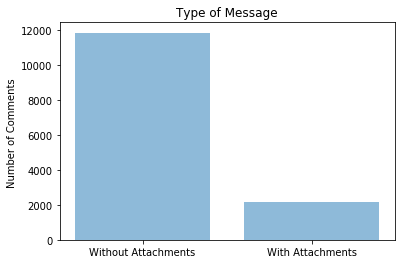

In [13]:
number_attachments=0
id_attachments=[]
for i in text_comment.keys():
    if text_comment[i].lower()=="see attached":
        number_attachments+=1
        id_attachments.append(i)

number_comments_attached={}
attached_comments_number=0
for i in id_attachments:
    number_comments_attached[i]=num_comments[i]
    attached_comments_number+=num_comments[i]

total_comments=0

for i in num_comments.keys():
    total_comments+=num_comments[i]

comments_labels=['Without Attachments', 'With Attachments']
no_comments=len(text_comment)-number_attachments
comments_vector=[no_comments, number_attachments]

y_pos = np.arange(len(comments_labels))

total_comments_without=total_comments-attached_comments_number
total_comment_vector=[total_comments_without, attached_comments_number]

plt.bar(y_pos, total_comment_vector, align='center', alpha=0.5)
plt.xticks(y_pos, comments_labels)
plt.ylabel('Number of Comments ')
plt.title('Type of Message')
 
plt.show()



# Total Counts by Submitter Type

While not all comments had data pertaining to submitter type, more than half of the all the comments are labeled as being from individual consumers with approximately 25% of the comments coming from the food industry.  Knowing how these comments are distributed among submitters adds insight into how the FDA should weight the public comments.  


In [14]:


#Get the number of counts by comment category
counts = data_array['SubmitterType'].value_counts()
print("Total Counts of by Comment Submitter Type")
print(' ')
print(counts)
counts_dict = dict(data_array['SubmitterType'].value_counts())

Total Counts of by Comment Submitter Type
 
Individual Consumer                     6845
Food Industry - C0027                   2716
Animal Feed Industry - C0007             558
Consumer Group - B0003                   431
Food Association - D0017                 352
Health Professional - A0007              185
Academia - E0007                         173
Private Industry - C0003                 152
Other Organizations - E0003              126
Federal Government - G0007                98
Association - D0003                       81
International Public Citizen - I0007      38
Government                                27
Media - C0032                             19
International Food Association            15
Other Government - G0022                  10
State Government - G0012                   9
International Consumer Group - I0012       9
International Organization - I0032         9
Health Care Association - D0022            9
Drug Industry - C0022                      8
Drug Associ

Text(0.5, 1.0, 'Distribution of Comments by Industry')

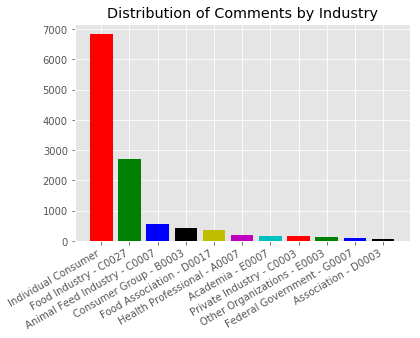

In [23]:

count_comment_category = list(counts_dict.keys())
count_comment_count = list(counts_dict.values())
my_colors = 'rgbkymc' 
plt.bar(count_comment_category[:11],count_comment_count[:11], color = my_colors )
plt.yticks(rotation=0)
plt.xticks(rotation=30, ha = "right") 
plt.title('Distribution of Comments by Industry')

Text(0.5, 1.0, 'Distribution of Comments by Industry')

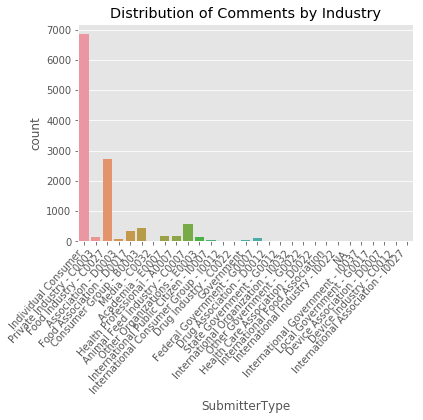

In [24]:
sns.countplot(data_array['SubmitterType'])
plt.yticks(rotation=0)
plt.xticks(rotation=48, ha = "right") 
plt.title('Distribution of Comments by Industry')

# Difference in Entities between different groups
At the core of this distribution lies a question fundamental to the regulatory process. That is to say, that in a democracy, whose opinion matters more-- those of individual consumers or of corporate interests. 

We're interested to see if different groups of submitters mention different entities in the comments.  This may provide policy decision makers with information about biases, perspectives, and interests about dairly labeling regulations. 

In [16]:


nlp = spacy.load('en', disable=['parser', 'tagger'])

# Filter the dataframe to reference comments from individual consumers and food industry

#Individual Consumers
filtered_indConsumer_df = data_array[(data_array['SubmitterType'] == 'Individual Consumer')]
filtered_indConsumer_df['Comment Text']

#
filtered_FoodInd_df = data_array[(data_array['SubmitterType'] == 'Food Industry - C0027')]
filtered_FoodInd_df['Comment Text']



22       Food labeling should refer to the final produc...
55       "I work in dairy, so I get the difference.  Wh...
57       I am not confused by the words, milk, cheese, ...
61       There is simply no confusion. It is clear to m...
63       Vegan here! I am entirely aware of the differe...
69       I think it's perfectly fine to use the word mi...
70       I find the suggestion that consumers are confu...
85       Please allow non-dairy products to use the sam...
88       There is no reason to remove the names of dair...
94       The current labels on plant based "milk/dairy"...
97       I like the idea of plant-based products being ...
102      I am requested no changes be made regarding th...
107      I don't think that there is any confusion betw...
111      The government should NOT intrude into the fre...
117      "I have never had an issue figuring out what i...
129      I have been consuming strictly plant based foo...
131      EVERYONE knows that if you buy products that a.

In [18]:
# Use spacy to tokenize and count the entities for individual consumers 

comments_nlp_indCon = []
comments_nlp_indCon = [nlp(re.sub('\s+',' ', i.strip())) for i in filtered_indConsumer_df['Comment Text']]


In [19]:
# Use spacy to tokenize and count the entities for Food Industry 

comments_nlp_FoodInd = []
comments_nlp_FoodInd = [nlp(re.sub('\s+',' ', i.strip())) for i in filtered_FoodInd_df['Comment Text']]

In [20]:
# Individual Consumers 
org_counts_individualConsumers = Counter()
for comment in comments_nlp_indCon:
    comment_org_indCon = set([ent.lemma_ for ent in comment.ents if ent.label_ == u'ORG'])
    org_counts_individualConsumers.update(comment_org_indCon)

org_comment_indCon = sorted(org_counts_individualConsumers.items(),reverse = True, key= itemgetter(1))
org_comment_indCon = org_comment_indCon[:11]

print("The ORG that occur in the most comments for Individual Consumers are:")
print(" ")
for token, count in org_comment_indCon:
    print(token,":",count)
    
print('')
print('')
print('')


The ORG that occur in the most comments for Individual Consumers are:
 
FDA : 2063
Dairy : 173
the Plant Based Foods Association : 87
Consumer Understanding of LabelsAmerican : 85
Label ChangesIf FDA : 85
Consumer Understanding of NutritionI : 83
Dairy Foods : 63
the Labeling of Plant - Based Products : 53
USDA : 40
Almond Milk : 38
the U.S. Food and Drug Administration have : 38





In [21]:
# Food Industry

org_counts_foodInd = Counter()
for comment in comments_nlp_FoodInd:
    comment_org_foodInd = set([ent.lemma_.upper() for ent in comment.ents if ent.label_ == u'ORG'])
    org_counts_foodInd.update(comment_org_foodInd)

org_comment_foodInd = sorted(org_counts_foodInd.items(),reverse = True, key= itemgetter(1))
org_comment_foodInd_2 = org_comment_foodInd[:11]

print("The ORG that occur in the most comments for the Food Industry are:")
print(" ")
for token, count in org_comment_foodInd_2:
    print(token,":",count)

The ORG that occur in the most comments for the Food Industry are:
 
FDA : 1339
THE INTERNATIONAL FOOD INFORMATION COUNCIL FOUNDATION : 576
BIG DAIRY : 574
DAIRY : 78
IPSOS : 33
THE U.S. FOOD AND DRUG ADMINISTRATION HAVE : 25
STANDARDS OF IDENTITY : 21
USDA : 14
DAIRY FOODS : 14
THE DAIRY INDUSTRY : 13
COWS : 13


Text(0.5, 1.0, 'Organizations Present in Comments from Individual Consumers')

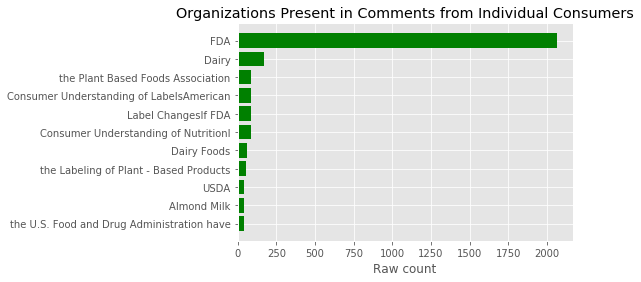

In [85]:
# Plot Individual Consumers 
plt.style.use('ggplot')

labels_indCon = [lemma for lemma, count in org_comment_indCon]
counts_indCon = [count for lemma, count in org_comment_indCon]

print()
fig, ax = plt.subplots()
ax.barh(labels_indCon[:11], counts_indCon[:11], align='center',
        color='green', ecolor='black')
plt.gca().invert_yaxis()
ax.set_yticks(labels_indCon)
ax.set_xlabel('Raw count')
plt.title("Organizations Present in Comments from Individual Consumers")

Text(0.5, 1.0, 'Organizations Present in Comments from the Food Industry')

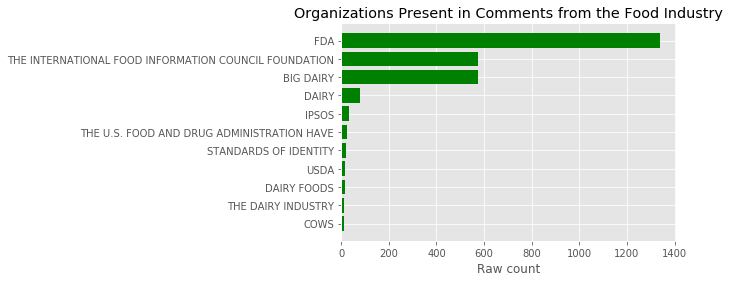

In [86]:
# Plot Food Industry
plt.style.use('ggplot')

labels_foodInd = [lemma for lemma, count in org_comment_foodInd_2]
counts_foodInd = [count for lemma, count in org_comment_foodInd_2]


print()
fig, ax = plt.subplots()
ax.barh(labels_foodInd[:11], counts_foodInd[:11], align='center',
        color='green', ecolor='black')
plt.gca().invert_yaxis()
ax.set_yticks(labels_foodInd)
ax.set_xlabel('Raw count')
plt.title("Organizations Present in Comments from the Food Industry")

### Food Industry Refers to Industry Specific Terms
Not surprising, the food industry uses more professional language for referring to organizations.  More importantly, 2 of the top 10 organizations that are mentioned (Ipsos, International Food Information Council) refer to survey/market research conducted by the industry on the labeling of plant-based milks.  The food industry is using their own research to help make their case when lobbying the Food and Drug Administration.

It's also interesting to see that "Big Dairy" is ranked so highly for the food industry.  We had hypothesized that the food industry would be uniform in their support of regulatory changes to change the identity standard of milk, but using a somewhat negative term for a corporate interest suggests that the food industry is not monolithic in its position.  

# Topic Modeling


We performed topic modeling for the two largest comment submitter groups which are Individual Consumers and also Food Industry. 

## Individual Consumer 

We used CountVectorizer to do tokenization in order to eliminate stop words and words that occur over 70% of the documents. Then we ran LDA multiple times with the number of topics ranging from 2 to 8 while testing different max_df. We ran clustering to try to decide on a K value. However, the results were not interpretable. Four topics gave the clearest results with distinct topics. We tested the results by reading the entire comments from regulation.gov that contained the top words for each topic. Below are our subjective interpretations of each topic.

Topic 1: Enforce the FDA milk identity standard because plant-based alternatives have different nutritional value. We need to change current labeling.

Topic 2: Cows are being abused. Keeping them constantly pregnant is cruel and they are suffering.

Topic 3: Current labeling is clear; change is unnecessary.

Topic 4: People use alternatives plant-based milks such as almond milk and soy milk; they are not confused.

In [27]:
# grabbing from data frame all the comments subimitted by individual consumer
individual_nl=(data_array[data_array['SubmitterType'] == 'Individual Consumer'])
individual_comments_nl=individual_nl['Comment Text'].values.tolist()

#Count vectorizer for the comments
vocab_size_nl = 1000

tf_vectorizer_nlc = CountVectorizer(max_df=0.70,
                                min_df=50,
                                max_features=vocab_size_nl,
                                stop_words='english')
tf_nlc= tf_vectorizer_nlc.fit_transform(individual_comments_nl)   

    
#LDA- finding the topics
num_topics_nl = 4


lda_nlc = LatentDirichletAllocation(n_components=num_topics_nl, learning_method='online', random_state=300)
lda_nlc.fit(tf_nlc)


topic_word_distributions_nlc = np.array([topic_word_pseudocounts_nlc / np.sum(topic_word_pseudocounts_nlc)
                                     for topic_word_pseudocounts_nlc in lda_nlc.components_])
num_top_words_nl = 35
print('Displaying the top %d words per topic and their probabilities within the topic...' % num_top_words_nl)
print()

for topic_idx_nl in range(num_topics_nl):
    print('[Topic ', topic_idx_nl+1, ']', sep='')
    sort_indices_nl = np.argsort(topic_word_distributions_nlc[topic_idx_nl])[::-1]
    for rank_nl in range(num_top_words_nl):
        word_idx_nl = sort_indices_nl[rank_nl]
        print(tf_vectorizer_nlc.get_feature_names()[word_idx_nl], ':', topic_word_distributions_nlc[topic_idx_nl, word_idx_nl])
    print()

topic1=0
topic2=0
topic3=0
topic4=0


#document with highest porportion of a specific topic is added to the topic 
topic_proportions_nlc = lda_nlc.transform(tf_nlc)
for docs_nl in topic_proportions_nlc:
    idx_nl = np.argsort(docs_nl)
    if idx_nl[0] == 0:
        topic1+= 1
    if idx_nl[0] == 1:
        topic2+= 1
    if idx_nl[0] == 2:
        topic3+= 1
    if idx_nl[0] == 3:
        topic4+= 1

        
Topics_distributions_nlc=[topic1,topic2,topic3,topic4]
print(Topics_distributions_nlc)

Displaying the top 35 words per topic and their probabilities within the topic...

[Topic 1]
based : 0.04153297311789119
products : 0.041059903088980845
industry : 0.01803519491977161
animal : 0.01673210872191329
use : 0.015644842980524813
almond : 0.015487431438441552
cheese : 0.015063371797135345
people : 0.014554206216071819
consumers : 0.01257963837305796
cow : 0.012450586473020072
product : 0.012444538839717755
milks : 0.012224087982222034
soy : 0.011784128223572641
know : 0.010247295512518025
like : 0.009792462827947572
non : 0.008866160504539027
butter : 0.00885113139046534
confused : 0.008444177868496558
yogurt : 0.0078047334215902734
used : 0.007627269776211466
food : 0.0074579941443777
word : 0.007423352770865211
just : 0.007302668443277109
think : 0.006752908553070361
alternatives : 0.0064139741429806345
coconut : 0.006210880033525927
confusion : 0.005958126989345047
health : 0.005957160577158817
words : 0.005786012999945176
vegan : 0.005779822181809709
don : 0.0057017048356

## Food Industry Topic Modeling

Similar to topic modeling for individual consumers, we used CountVectorizer to do tokenization to eliminate stop word and words that occur over 70% of the documents. However, we changed the min_df to 20 because there are fewer comments within the food industry group. Then we ran LDA multiple times with the number of topics ranging from 2 to 8 while testing different max_df. Four topics gave the clearest results with distinct topics. We tested the results by reading the entire comments from regulation.gov that contains the top words for each topic. Below are our subjective interpretations of each topic.  

Topic 1: People use almond milk and believe it has the same nutritional value as milk. 

Topic 2: Cows are being abused, and current labels are not misleading.

Topic 3: A conflicting topic: 'request enforcement of milk-identity standard' vs. 'change is unnecessary'.

Topic 4: It is unnatural for cows to keep getting pregnant to produce milk.

In [28]:
#grabbing from data frame all the comments subimitted by food industry
industry_nl=(data_array[data_array['SubmitterType'] == 'Food Industry - C0027'])
industry_comments_nl=industry_nl['Comment Text'].values.tolist()

#counter vectorizer of all comments 
vocab_size_nl = 1000

tf_vectorizer_nl = CountVectorizer(max_df=0.70,
                                min_df=20,
                                max_features=vocab_size_nl,
                                stop_words='english')
tf_nl = tf_vectorizer_nl.fit_transform(industry_comments_nl)   

    
#LDA- finding the topics
num_topics_nl = 4


lda_nl = LatentDirichletAllocation(n_components=num_topics_nl, learning_method='online', random_state=300)
lda_nl.fit(tf_nl)


topic_word_distributions_nl = np.array([topic_word_pseudocounts_nl / np.sum(topic_word_pseudocounts_nl)
                                     for topic_word_pseudocounts_nl in lda_nl.components_])
num_top_words_nl = 35
print('Displaying the top %d words per topic and their probabilities within the topic...' % num_top_words_nl)
print()

for topic_idx_nl in range(num_topics_nl):
    print('[Topic ', topic_idx_nl+1, ']', sep='')
    sort_indices_nl = np.argsort(topic_word_distributions_nl[topic_idx_nl])[::-1]
    for rank_nl in range(num_top_words_nl):
        word_idx_nl = sort_indices_nl[rank_nl]
        print(tf_vectorizer_nl.get_feature_names()[word_idx_nl], ':', topic_word_distributions_nl[topic_idx_nl, word_idx_nl])
    print()

topic1=0
topic2=0
topic3=0
topic4=0


#document with highest porportion of a specific topic is added to the topic 
topic_proportions_nl = lda_nl.transform(tf_nl)
for docs_nl in topic_proportions_nl:
    idx_nl = np.argsort(docs_nl)
    if idx_nl[0] == 0:
        topic1+= 1
    if idx_nl[0] == 1:
        topic2+= 1
    if idx_nl[0] == 2:
        topic3+= 1
    if idx_nl[0] == 3:
        topic4+= 1

        
Topics_distributions_nl=[topic1,topic2,topic3,topic4]
print(Topics_distributions_nl)



Displaying the top 35 words per topic and their probabilities within the topic...

[Topic 1]
animal : 0.06120415684400373
big : 0.02534021486859784
choose : 0.02496349366812968
consumer : 0.024446921982036064
environment : 0.02440710296811721
stores : 0.024174379136177364
restaurants : 0.02362150563945013
competition : 0.012639006266992069
american : 0.012493188669637006
losing : 0.012460896372029935
differences : 0.01245121690502969
confused : 0.01243727447918066
alternatives : 0.012414348065873257
know : 0.012382982246892089
items : 0.01236540021473295
cheese : 0.012363433640948003
cruelty : 0.012345663026299008
industry : 0.012328916963269697
soy : 0.012313671604196878
contain : 0.012296518841895148
people : 0.012280558416592514
information : 0.012276857655767807
cashew : 0.01227025455572149
profits : 0.012262220041120889
better : 0.012260956758552223
almond : 0.012240425208621081
agriculture : 0.01220448269243577
yogurt : 0.01220434657170147
health : 0.012189528909202801
production

## Topic Modeling: Consumer VS Food Industry

Both groups have a large percentage of comments regarding concerns for animal abuse. Within consumer comments, we see an emphasis on whether current labeling is clear and if the change is necessary. We see more discussion on consumer understanding of the nutritional value between dairy vs plant-based milk. This is coherent with the large percentage of comments on standards of identity, which refers to FDA statement on the definition of dairy. In comparison, the food indsutry comments has less emphasis on the dairy identity and more on the implications of profits for big stores.

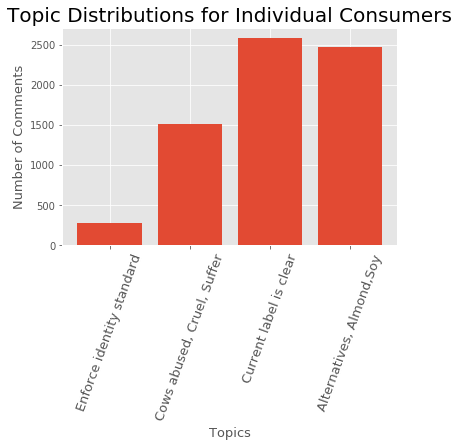

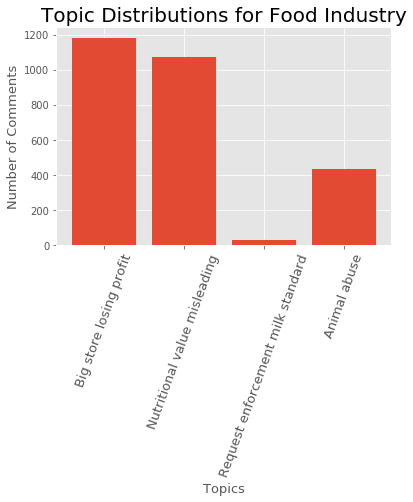

In [20]:
#Compare the results of the two groups


label_nlc = ['Enforce identity standard', 'Cows abused, Cruel, Suffer', 'Current label is clear', 'Alternatives, Almond,Soy']
no_doc_nl = [i for i in Topics_distributions_nlc]
index_nl = np.arange(len(Topics_distributions_nlc))
plt.bar(index_nl, no_doc_nl)
plt.xlabel('Topics', fontsize=13)
plt.ylabel('Number of Comments', fontsize=13)
plt.xticks(index_nl, label_nlc, fontsize=13, rotation=70)
plt.title('Topic Distributions for Individual Consumers',fontsize=20)
plt.show()

print('\n')



label_nl = ['Big store losing profit', 'Nutritional value misleading', 'Request enforcement milk standard', 'Animal abuse']
no_doc_nl = [i for i in Topics_distributions_nl]
index_nl = np.arange(len(Topics_distributions_nl))
plt.bar(index_nl, no_doc_nl)
plt.xlabel('Topics', fontsize=13)
plt.ylabel('Number of Comments', fontsize=13)
plt.xticks(index_nl, label_nl, fontsize=13, rotation=70)
plt.title('Topic Distributions for Food Industry',fontsize=20)
plt.show()


# Entity Labels Analysis:

We performed two different analyses to the entity labels: one to the title of the comments, and the other to the comment itself.

## Titles:

The "title" field provides a small window into who is posting comments. As an initial level of analysis, it made sense to look at entities present in the titles to see what sort of known entities show up. The code below shows an exploration of persons, GPE, and organizations in the titles.

In [29]:
titles_ah = list(title.values())
comments_ah = list(text_comment.values())


label_counter2_ah = Counter()
titles_nlp = []
titles_nlp = [nlp(re.sub('\s+',' ', i.strip())) for i in titles_ah]

for i in titles_nlp:
    for entity in i.ents:
        ents = entity.label_
        label_counter2_ah[ents] += 1 



ents_sort = sorted(label_counter2_ah.items(),reverse=True,key=itemgetter(1))
ents_sort[:3]
print("The entity type counts for the titles are as follows:",'\n')
for token, count in ents_sort:
    print(token,':',count)

The entity type counts for the titles are as follows: 

PERSON : 9563
ORG : 3764
GPE : 201
NORP : 22
DATE : 21
PRODUCT : 15
MONEY : 13
LOC : 13
FAC : 9
CARDINAL : 4
WORK_OF_ART : 3
TIME : 1


Text(0.5, 1.0, 'Distribution of Entity Labels in Comment Titles')

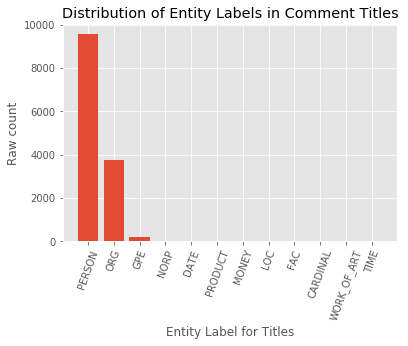

In [37]:

plt.style.use('ggplot')

labels_ents_titles = [lemma for lemma, count in ents_sort]
counts_ents_titles = [count for lemma, count in ents_sort]
plt.bar(labels_ents_titles,counts_ents_titles)
plt.xticks(labels_ents_titles, rotation=70)
plt.xlabel('Entity Label for Titles')
plt.ylabel('Raw count')
plt.title('Distribution of Entity Labels in Comment Titles')

In [38]:
freq_per = Counter() 
for i in titles_nlp:
    for entity in i.ents:
        c=entity.text
        if entity.label_ == 'PERSON':
            freq_per[c] += 1
    
per = sorted(freq_per.items(),reverse=True,key=itemgetter(1))

per20 = per[:20]
print("The top ten persons in the titles are:",'\n')
for token, count in per20:
    print(token,':',count)

The top ten persons in the titles are: 

Anonymous Anonymous : 330
Clay Detlefsen : 14
Jessica Freeman : 8
Christy Krejci : 6
Terri Pigford : 5
Christine Stewart : 5
Wendy Bowman : 5
Dave : 5
Rita Cross : 5
John Teevan : 5
John Pasqua : 5
Hannah Lemke : 5
Lisa Barrett : 5
Mary Tarallo : 5
DIANE KASTEL : 5
Michelle Setaro : 5
Ann Spencer : 5
Kate : 5
Lisa Howell : 4
Sandra Costa : 4


In [39]:
freq_orgs = Counter() 
for i in titles_nlp:
    for entity in i.ents:
        c=entity.text
        if entity.label_ == 'ORG'and entity.text != 'NA' and entity.text != 'N/A':
            freq_orgs[c] += 1
            
orgs_ten = sorted(freq_orgs.items(),reverse=True,key=itemgetter(1))
orgs_ten = orgs_ten[:8]

#just labels for histogram
orgs_eight = [token for token, count in orgs_ten]
titles_orgs8 = orgs_eight[:8]

#printed results
print("From the titles, the top ten ORG entities are:",'\n')
for token, count in orgs_ten:
    print(token,':',count)

From the titles, the top ten ORG entities are: 

Plant Based Foods Association : 84
Prairie Farms Dairy : 14
Compassion Over Killing : 8
Caroline : 6
COK : 6
FDA : 5
Dairy Farmers of America : 5
Ciara LaChaux : 4


Text(0.5, 1.0, 'Top Eight Organizations in Titles')

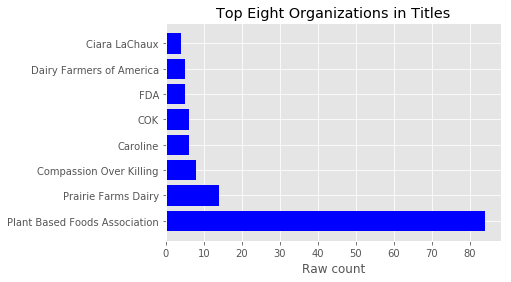

In [40]:
print()
labels_title = [lemma for lemma, count in orgs_ten]
counts_title = [count for lemma, count in orgs_ten]

plt.barh(labels_title, counts_title, align='center',
        color='blue', ecolor='black')
plt.yticks(orgs_eight)
#plt.yticklabels('Organizations Present in Titles')
#ax.yaxis()  # labels read top-to-bottom
plt.xlabel('Raw count')
plt.title('Top Eight Organizations in Titles')

*Summary for Titles Entity Analysis*

Most entities present in the titles were persons. Although there were some persons who repeated several times, we figured this amount was relatively low and not particularly informative. In taking a deeper look at organizations present in the titles, we found the most common organization present to be "Plant Based Foods Association," but this amount of 80 was quite low compared to our dataset size of 11,904.

## Entity Analysis for Comments

This section explores entity analysis for the comments. While the "titles" field was quite limited, the comments themselves provided greater potential for entity analysis. In this section, we explore persons, geopolitical entities, and organizations in the comments.

In [36]:
comments_nlp = []
comments_nlp = [nlp(re.sub('\s+',' ', i.strip())) for i in comments_ah]
label_counter4_ah = Counter()

for i in comments_nlp:
    for entity in i.ents:
        ents = entity.label_
        label_counter4_ah[ents] += 1 
        

comments_ent_sort = sorted(label_counter4_ah.items(),reverse=True,key=itemgetter(1))

print("The entity type counts for the comments are as follows:",'\n')
for token, count in comments_ent_sort:
    print(token,':',count)

The entity type counts for the comments are as follows: 

ORG : 12163
PERSON : 3294
DATE : 2517
CARDINAL : 2129
NORP : 2019
GPE : 1672
PERCENT : 1043
LAW : 920
WORK_OF_ART : 450
ORDINAL : 328
LOC : 151
LANGUAGE : 107
PRODUCT : 106
MONEY : 106
QUANTITY : 106
FAC : 95
TIME : 76
EVENT : 29


Text(0.5, 1.0, 'Distribution of Entity Labels in Comment Text')

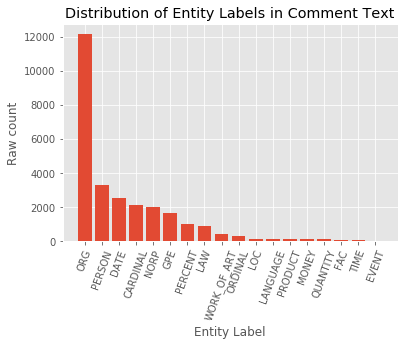

In [41]:

plt.style.use('ggplot')

labels3_ah = [lemma for lemma, count in comments_ent_sort]
counts3_ah = [count for lemma, count in comments_ent_sort]
plt.bar(labels3_ah,counts3_ah)
plt.xticks(labels3_ah, rotation=70)
plt.xlabel('Entity Label')
plt.ylabel('Raw count')
plt.title('Distribution of Entity Labels in Comment Text')

In [42]:
freq_gpe2 = Counter() 
for i in comments_nlp:
    for entity in i.ents:
        c=entity.text
        if entity.label_ == 'GPE':
            freq_gpe2[c] += 1
    
gpe2 = sorted(freq_gpe2.items(),reverse=True,key=itemgetter(1))

gpe20_comment = gpe2[:20]
print("The top twenty GPE in the comments are:")
for token, count in gpe20_comment:
    print(token,':',count)

The top twenty GPE in the comments are:
America : 172
MILK : 158
US : 143
U.S. : 133
Almond : 95
the United States : 51
Whom : 45
Magnesia : 45
Cashew : 43
Canada : 38
USA : 24
B12 : 20
Wisconsin : 18
MD : 15
ALMOND : 15
Almonds : 15
Vegan : 13
California : 12
Rockville : 12
Pennsylvania : 12


In [43]:
freq_org2 = Counter() 
for i in comments_nlp:
    for entity in i.ents:
        c=entity.text
        if entity.label_ == 'ORG':
            freq_org2[c] += 1
    
org2 = sorted(freq_org2.items(),reverse=True,key=itemgetter(1))

org25_comment = org2[:25]
print("The top twenty five ORGs in the comments are:")
for token, count in org25_comment:
    print(token,':',count)

The top twenty five ORGs in the comments are:
FDA : 5939
Big Dairy : 598
the International Food Information Council Foundation : 585
Dairy : 434
Dairy Foods : 102
the Plant Based Foods Association : 100
Consumer Understanding of Labels American : 99
the Labeling of Plant-Based Products : 98
the U.S. Food and Drug Administration's : 97
USDA : 96
Label Changes : 95
Consumer Understanding of Nutrition : 92
Standards of Identity : 77
Ipsos : 68
Almond Milk : 64
Cows : 60
the Dairy Industry : 45
DAIRY : 41
PLANT : 40
Soy Milk : 36
COWS : 30
STOP : 29
Coconut Milk : 27
the Food and Drug Administration : 27
DO : 26


In [44]:
freq_per2 = Counter() 
for i in comments_nlp:
    for entity in i.ents:
        c=entity.text
        if entity.label_ == 'PERSON':
            freq_per2[c] += 1
    
per2 = sorted(freq_per2.items(),reverse=True,key=itemgetter(1))

per20_comment = per2[:20]
print("The top twenty PERSONS in the comments are:")
for token, count in per20_comment:
    print(token,':',count)

The top twenty PERSONS in the comments are:
Scott Gottlieb : 595
Almond : 206
Soy : 188
Gottlieb : 96
Almond Milk : 76
Vegan : 73
Soy Milk : 50
Animal Dairy : 37
Butter : 36
Webster : 34
Dairy : 31
May Concern : 31
Cows : 26
Merriam-Webster : 24
Rice : 23
Rice Milk : 22
b(1 : 17
Milk : 15
Animal : 11
Dietary Guidelines : 10


*Summary of Entity Analysis for Comments*

Entity analysis of the comments showed mostly incomprehensible results for GPE, and mostly highlighted the use of the FDA Director's name (Scott Gottlieb) and dictionary references (Merriam-Webster). Organizational entities were a bit more revealing, since we were somewhat surprised to see International Food Information Council Foundation as one of the top organizations present. While the code above explored raw counts of entities within comments and titles, the code below looks at number of documents that contain specific organizational and geopolitical entities.

In [45]:
gpe_counts= Counter()
for comment in comments_nlp:
    comment_gpe = set([ent.lemma_ for ent in comment.ents if ent.label_ == u'GPE'])
    gpe_counts.update(comment_gpe)
gpe_comment3 = sorted(gpe_counts.items(),reverse=True,key=itemgetter(1))
gpe_comment3 = gpe_comment3[:20]

print("The GPE that occur in the most comments are:")
for token, count in gpe_comment3:
    print(token,":",count)

The GPE that occur in the most comments are:
America : 166
US : 125
MILK : 118
U.S. : 96
Almond : 90
the United States : 50
Whom : 45
Magnesia : 44
Cashew : 40
Canada : 34
USA : 19
Wisconsin : 17
B12 : 16
MD : 15
Almonds : 15
Pennsylvania : 14
Vegan : 13
ALMOND : 13
Rockville : 12
Dairy : 12


The ORG that occur in the most comments are:
Big Dairy : 588
the International Food Information Council Foundation : 585
Dairy : 327
the Plant Based Foods Association : 100
Consumer Understanding of Labels American : 99
Dairy Foods : 98
the U.S. Food and Drug Administration have : 97
the Labeling of Plant - Based Products : 97
Label Changes : 95
Consumer Understanding of Nutrition : 92
Standards of Identity : 75
USDA : 72
Ipsos : 68



Text(0.5, 1.0, 'Organizations Mentioned in Comments')

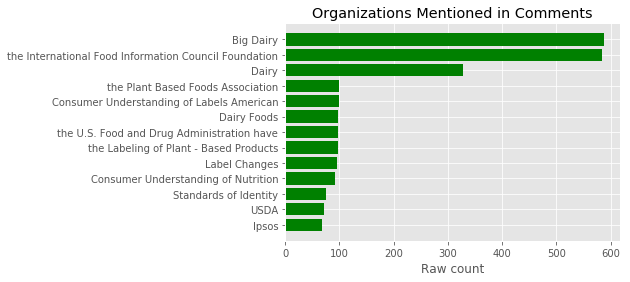

In [47]:
org_counts= Counter()
for comment in comments_nlp:
    comment_org = set([ent.lemma_ for ent in comment.ents if ent.label_ == u'ORG'])
    org_counts.update(comment_org)

org_comment3 = sorted(org_counts.items(),reverse=True,key=itemgetter(1))
org_comment3 = org_comment3[1:14]  # Truncating data to filter out 'FDA'

print("The ORG that occur in the most comments are:")
for token, count in org_comment3:
    print(token,":",count)
    
plt.style.use('ggplot')

labels = [lemma for lemma, count in org_comment3]
counts = [count for lemma, count in org_comment3]

print()
fig, ax = plt.subplots()
ax.barh(labels, counts, align='center',
        color='green', ecolor='black')
plt.gca().invert_yaxis()
ax.set_yticks(labels)
#ax.set_yticklabels('Organizations Present in Comments')
#ax.yaxis()  # labels read top-to-bottom
ax.set_xlabel('Raw count')
ax.set_title('Organizations Mentioned in Comments')

In terms of the organization mentioned in the comments, we can see that Big Dairy and the International Food Information Council Foundation are the two 2 top organizations mentioned in comments.

# Sentiment Analysis:

We ran a sentiment analysis on all of the comments, and then we differenciated among Individual Consumers and Food Industry representatives. 

## Overall Sentiment Analysis:

In [48]:
type(comment_2_read_in) 
type(comment_category_2_read_in)
commentlist =comment_2_read_in
submitter_type=comment_category_2_read_in

nlp = spacy.load('en', disable=['ner', 'parser', 'tagger'])
nlp.max_length = 70000000
vocab_size = 5000


# CountVectorizer does tokenization and can remove terms that occur too frequently, not frequently enough, or that are stop words

# document frequency (df) means number of documents a word appears in
vectorizer = CountVectorizer(max_df=0.50,
                                min_df=50,
                                max_features=vocab_size,
                                stop_words='english')
X = vectorizer.fit_transform(commentlist)

#To see the unique set of submitter type in case I need it for comment list
submitter_set = set(submitter_type) 
print(submitter_set)

{'Association - D0003', 'International Public Citizen - I0007', 'Health Professional - A0007', 'Government', 'International Food Association', 'Food Industry - C0027', 'Consumer Group - B0003', 'Animal Feed Industry - C0007', 'International Association - I0027', 'Individual Consumer', 'Local Government - G0017', 'Device Association - D0007', 'Drug Industry - C0022', 'Federal Government - G0007', 'Drug Association - D0012', 'International Government - I0037', 'International Industry - I0022', 'Other Organizations - E0003', 'Other Government - G0022', 'Food Association - D0017', 'Device Industry - C0012', 'International Consumer Group - I0012', 'Media - C0032', 'Academia - E0007', 'Health Care Association - D0022', 'Private Industry - C0003', 'State Government - G0012', 'NA', 'International Organization - I0032'}


In [49]:
#Extracting comments made by Consumers: 
comment_cons_df = data_array[(data_array['SubmitterType'] == 'Individual Consumer')]
commentlist_cons = list(comment_cons_df['Comment Text'])
print(commentlist_cons[:2])

['The use of names of "dairy" foods on plant-based products is *not* confusing.   Our family has no trouble distinguishing between dairy milk products from cows, and plant-based milk products.  Our household includes both and we haven\'t experienced any confusion as to which products contain dairy and which do not.  The use of "milk" or "cheese" and similar names on plant-based products is like the designation of "butter" to describe the consistency or use of something, rather than the source.  We have never confused peanut butter, apple butter, and cookie butter - or (non-food) body butter products - with dairy butter.  Thank you!', 'I have not ever been confused by the labeling of plant-based products as "milk". When I ended my use of cow\'s milk in my diet and moved to using almond milk, my four year old was also not confused. It\'s clear to me that plant-based products are using milk to describe their consistency, color, and what they can be used as in recipes and diets. I also am 

In [50]:
comment_foodind_df = data_array[(data_array['SubmitterType'] == 'Food Industry - C0027')]
commentlist_foodind = list(comment_foodind_df['Comment Text'])
print(commentlist_foodind[:2])

['Food labeling should refer to the final product, so "milk", "yogurt", "mayonnaise" should be on a label of that product, regardless of the origination of the product. I think that labeling what kind of milk (i.e. Almond, Soy etc.) is a good way of defining the origination. The differences between animal and plant based items are well known to consumers who buy plant plant based items, as we typically do more than average research when replacing animal products in our diet. The products are used as non-dairy replacements for dietary and health reasons, as well as environmental and animal cruelty issues. The uptick in all plant based foods over the past several years is not due to consumers being confused at the grocery store, but rather a determined choice to become healthier, save animals, and have an impact on the environment. ', '"I work in dairy, so I get the difference.  What I\'ve found when talking to people is that they understand that they are different products and that plan

In [51]:
vocab = vectorizer.vocabulary_
vocab_list =list(vocab)
print(vocab_list[:5])

['use', 'names', 'foods', 'confusing', 'family']


In [52]:

def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words ='english', min_df =50, max_df = 0.5).fit(corpus)
    words = vec.transform(corpus)
    sum_words = words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [53]:
#Getting the top words
get_top_n_words(commentlist, n =20)

[('consumers', 8373),
 ('cows', 8293),
 ('labeling', 7728),
 ('consumer', 6764),
 ('fda', 6382),
 ('animal', 6297),
 ('yogurt', 6287),
 ('industry', 6216),
 ('foods', 5425),
 ('cheese', 5042),
 ('almond', 4889),
 ('product', 4468),
 ('terms', 4398),
 ('confused', 4173),
 ('use', 4124),
 ('like', 3943),
 ('people', 3902),
 ('labels', 3823),
 ('food', 3805),
 ('milks', 3524)]

In [54]:
# you have to install textblob
commentlist_str=str(commentlist)

commentlist_blob = TextBlob(commentlist_str)
commentlist_pol=commentlist_blob.sentiment.polarity
commentlist_subj=commentlist_blob.sentiment.subjectivity
print(commentlist_pol, commentlist_subj)


lda = LatentDirichletAllocation(n_components = 5, learning_method='online', random_state=300)
lda.fit(X)


topic_word_distributions = np.array([topic_word_pseudocounts / np.sum(topic_word_pseudocounts)
                                     for topic_word_pseudocounts in lda.components_])

#OVERALL GROUP
num_top_words = 20
num_topics =5

print('Displaying the top %d words per topic and their probabilities within the topic...' % num_top_words)
print()

for topic_idx in range(num_topics):
    print('[Topic ', topic_idx, ']', sep='')
    sort_indices = np.argsort(topic_word_distributions[topic_idx])[::-1]
    for rank in range(num_top_words):
        word_idx = sort_indices[rank]
        print(vectorizer.get_feature_names()[word_idx], ':', topic_word_distributions[topic_idx, word_idx])
    print()

0.10469789234271704 0.502444458395555
Displaying the top 20 words per topic and their probabilities within the topic...

[Topic 0]
cows : 0.09274608992397466
abused : 0.038683812626117184
healthy : 0.03812811399829359
aren : 0.028151857123269716
want : 0.023688737365815993
cruel : 0.022975202463761623
buying : 0.020181265856746046
industry : 0.019254348848955338
produce : 0.018577269940420728
milking : 0.01779539066898168
kind : 0.0171156754173902
choosing : 0.016931198839461613
bodies : 0.016851402061857493
suffer : 0.016821367984785115
delicious : 0.0166705796344019
confused : 0.016436347009341747
public : 0.01630776319950475
stolen : 0.01573920230913748
nutrients : 0.015489715318695169
unnatural : 0.015121789297264978

[Topic 1]
labeling : 0.049274860774118995
yogurt : 0.035953247130441686
terms : 0.03577741102046787
consumers : 0.030411571610631145
consumer : 0.028760855966390785
foods : 0.026286712990409286
like : 0.02126474222382813
beverages : 0.017924083965800166
labels : 0.017

In [55]:
#Topic words by topic FOR OVERALL GROUP
alltopics_top_words_rev = []
top_words =np.zeros(len(lda.components_))
for topic_idx, word_dist in enumerate(lda.components_):
    sort_indices = np.argsort(topic_word_distributions[topic_idx])[::-1]
    top_words= [vectorizer.get_feature_names()[word_idx] for word_idx in sort_indices]
    alltopics_top_words_rev.append(top_words)
    print('Topic', topic_idx, ':', ', '.join(top_words))

Topic 0 : cows, abused, healthy, aren, want, cruel, buying, industry, produce, milking, kind, choosing, bodies, suffer, delicious, confused, public, stolen, nutrients, unnatural, osteoporosis, misleading, takes, rates, fda, manipulated, toll, produced, depleted, lameness, pregnant, secretions, term, labeling, cow, definition, incessant, requires, slaughter, constantly, kept, considered, nearly, label, point, exploited, profitable, exhausted, shipped, labels, nconsumers, reality, problemthe, claims, consumers, plants, drops, drug, restrict, purchase, significant, pushing, reason, sales, administration, derived, don, industrytheir, understand, food, people, nlabels, words, yogurt, use, milks, nthank, animal, problem, cheese, nplease, stop, treated, ni, tortured, humane, unhealthy, nwhat, nthe, taken, stand, today, humanely, voice, slaughtered, thank, comments, nwe, treat, make, practice, heard, calves, doesn, cruelty, support, concern, wants, nin, poor, intentionally, wrong, nsincerely, 


Topic 1 : labeling, yogurt, terms, consumers, consumer, foods, like, beverages, labels, making, request, fda, enforcement, change, respectfully, policy, cheese, confusion, refrain, new, unnecessary, food, cows, almond, cultured, clear, current, cashew, create, easily, regulations, using, submit, significant, make, restrict, information, confused, agency, nutritional, content, ask, regards, allows, seek, comment, instead, differentiate, quickly, inaccurate, profiles, abundantly, amendment, companies, ni, truthful, label, seeking, ingredients, alternative, changes, industry, limit, rights, believe, form, document, communicate, guidance, misleading, non, continue, american, milks, support, time, variety, including, names, labeled, farms, continued, innovation, derived, greater, dietary, include, reasonable, nthank, substitutes, indicate, soy, availability, truly, know, enjoy, exists, society, consumption, diverse, qualifying, ncurrent, rules, regulatory, terminology, concern, financial, 

Topic 2 : fda, product, foods, consumers, consumer, purchase, names, labeled, nutritional, identity, use, issue, regarding, standard, believe, beverages, standards, number, non, docket, established, opportunity, value, labels, enforce, clear, understanding, labeling, provide, 2018, manufacturers, healthy, important, appreciate, nthank, farmer, reasons, using, beverage, make, writing, nutritionally, increasingly, questions, yogurt, needs, comment, informed, counterparts, information, meet, include, 3522, example, nas, mislead, misleading, nutrients, choice, nutrition, help, attention, expect, choose, able, customers, existing, nconsumers, buying, marketed, listed, stores, reputation, thinking, remember, similarly, standardized, located, 4873, counterpart, deliver, permit, considers, verify, free, nthe, allergies, health, alternatives, taste, essential, calcium, require, protein, companies, aware, nconsumer, label, likely, way, shoppers, efforts, display, drinks, comments, addition, cour


Topic 3 : industry, people, use, almond, cheese, consumers, cow, animal, product, milks, cows, soy, like, know, food, butter, non, used, confused, just, labeling, animals, word, yogurt, think, don, need, vegan, words, make, want, coconut, confusion, labeled, label, alternatives, clearly, term, way, time, health, understand, called, buy, terms, plants, does, free, drink, confusing, years, buying, public, believe, labels, change, consumer, comes, real, stop, derived, market, nut, ni, ingredients, allow, come, long, alternative, companies, human, using, meat, farmers, names, difference, right, cream, fact, let, healthier, good, allowed, different, continue, humans, thank, dont, reason, liquid, trying, aware, government, money, sales, read, actually, ridiculous, simply, source, peanut, going, feel, consume, definition, juice, clear, goat, say, similar, protein, water, support, fake, really, things, almonds, nthank, family, ice, mammals, away, better, needs, nthe, purchasing, lactose, life

Topic 4 : animal, environment, choose, big, nthe, consumer, stores, restaurants, cruelty, health, industry, better, dear, people, production, food, public, ni, alternatives, agriculture, know, consumers, fda, commissioner, gottlieb, benefits, american, milks, confused, animals, profits, cheese, doing, growth, almond, best, yogurt, competition, produced, information, soy, items, contain, cashew, line, losing, intentionally, mind, recent, attempting, differences, percent, nas, protecting, thinking, reality, understanding, survey, council, international, foundation, waking, manipulate, suppress, scott, horrors, success, 90, biggest, concluded, communities, commonplace, homes, nsimply, havoc, wreaks, abuse, stop, babies, attached, farms, treated, farming, eat, treatment, factory, humane, inhumane, calves, humans, beings, poor, file, abusing, conditions, cows, sustainable, torture, pain, disgusting, god, treat, innocent, ethical, birth, science, horrible, causes, creatures, horrific, planet

C:\Users\norac\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3604: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')


Text(0.5, 1.0, 'Topic Polarity-Overall')

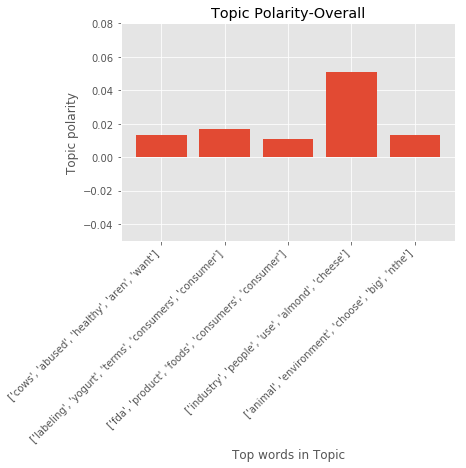

In [56]:
proportions = lda.transform(X)
x = proportions[:,0]*commentlist_pol #this is the calculation that we want happening
x[:10]
topic_polarity = [(proportions[:,topic]*commentlist_pol).sum()/proportions.shape[0] for topic in range(proportions.shape[1])]
topic_subjectivity = [(proportions[:,topic]*commentlist_subj).sum()/proportions.shape[0] for topic in range(proportions.shape[1])]

alltopics_wordscut = [list1[:5] for list1 in alltopics_top_words_rev]
x = range(len(lda.components_))
my_xticks = alltopics_wordscut
plt.xticks(x, my_xticks, rotation =45, ha='right')
plt.bar(x,topic_polarity)
plt.ylim(ymin = -0.05)
plt.ylim(top=0.08)
plt.xlabel("Top words in Topic")
plt.ylabel("Topic polarity")
plt.title("Topic Polarity-Overall")

Text(0, 0.5, 'Topic Subjectivity')

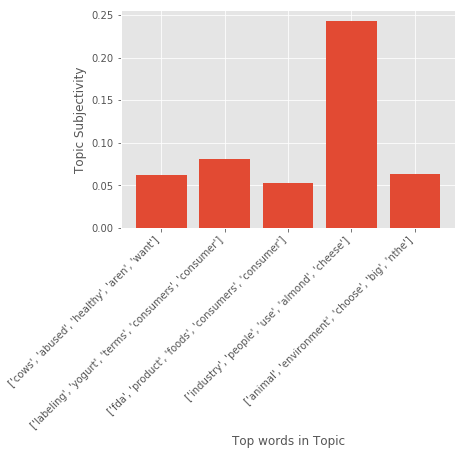

In [42]:
alltopics_wordscut = [list1[:5] for list1 in alltopics_top_words_rev]
x = range(len(lda.components_))
my_xticks = alltopics_wordscut
plt.xticks(x, my_xticks, rotation = 45, ha='right')
plt.bar(x,topic_subjectivity)
plt.xlabel("Top words in Topic")
plt.ylabel("Topic Subjectivity")

In [57]:
vocab_size = 5000
# document frequency (df) means number of documents a word appears in
vectorizer_cons = CountVectorizer(max_df=0.70, 
                                min_df=50, 
                                max_features=vocab_size, 
                                stop_words='english')
X_cons = vectorizer_cons.fit_transform(commentlist_cons)

#X_foodind = vectorizer_cons.fit_transform(commentlist_foodind)
commentlist_str_cons=str(commentlist_cons)
commentlist_str_foodind=str(commentlist_foodind)

commentlist_cons_blob = TextBlob(commentlist_str_cons)
commentlist_cons_pol=commentlist_cons_blob.sentiment.polarity
commentlist_cons_subj=commentlist_cons_blob.sentiment.subjectivity
print(commentlist_cons_pol, commentlist_cons_subj)
#Takes 40-45 seconds to run

lda_cons = LatentDirichletAllocation(n_components = 5, learning_method='online', random_state=300)
lda_cons.fit(X_cons)
topic_word_distributions_cons = np.array([topic_word_pseudocounts_cons / np.sum(topic_word_pseudocounts_cons)
                                     for topic_word_pseudocounts_cons in lda_cons.components_])
lda_cons.components_.shape

0.09665870754772307 0.5096597041883077


(5, 838)

**Conclusions of the Sentiment Analysis of all comments**

A lot of the top words are generic words such as consumers, cows, labeling, fda, animal, and yogurt. However, as you can see from the graphics above, several wods are repeated in several groups, which may hard to find a pattern in each group. Then, we conducted the appropiate analysis by differenciating between individual consumers and  the Food Industry.

## Consumer Group:

Now, we turn our focus to analysis on the sentiments of only individual consumers to find the differences between the sentiment analysis of the overall data and this particular group.

In [44]:
num_top_words_cons = 20
num_topics_cons =5

print('Displaying the top %d words per topic and their probabilities within the topic...' % num_top_words_cons)
print() 

for topic_idx_cons in range(num_topics_cons):  
    print('[Topic ', topic_idx_cons, ']', sep='')
    sort_indices_cons = np.argsort(topic_word_distributions_cons[topic_idx_cons])[::-1]
    for rank_cons in range(num_top_words_cons):
        word_idx_cons = sort_indices_cons[rank_cons]
        print(vectorizer_cons.get_feature_names()[word_idx_cons], ':', topic_word_distributions_cons[topic_idx_cons, word_idx_cons])
    print()

Displaying the top 20 words per topic and their probabilities within the topic...

[Topic 0]
based : 0.03715383974682968
products : 0.02964818795157577
animal : 0.02023825918901058
industry : 0.019956581462073426
people : 0.01765700476675499
use : 0.017573234595112362
almond : 0.017431365188069512
cheese : 0.015257786998560369
cow : 0.014881554811787177
milks : 0.013652264487053681
soy : 0.013044794264389056
product : 0.012019547370391149
know : 0.011342405728807858
consumers : 0.010649210493386272
butter : 0.01062243717264815
like : 0.010358332993052178
non : 0.009750973791354612
used : 0.009209607943971163
confused : 0.008971240774628011
just : 0.008934140575089042

[Topic 1]
products : 0.09129742556339647
labeling : 0.05382370390752088
based : 0.05112008308739246
yogurt : 0.04199225601904436
terms : 0.03967296566982599
consumer : 0.030135478275497986
consumers : 0.026924503804872196
like : 0.0238725541858585
cheese : 0.017138081292281095
foods : 0.015533443199892577
nutritional : 0.

In [59]:
alltopics_top_words_rev_cons = []
top_words_cons =np.zeros(len(lda_cons.components_))
for topic_idx_cons, word_dist_cons in enumerate(lda_cons.components_):
    sort_indices_cons = np.argsort(topic_word_distributions_cons[topic_idx_cons])[::-1]
    top_words_cons= [vectorizer_cons.get_feature_names()[word_idx_cons] for word_idx_cons in sort_indices_cons]
    alltopics_top_words_rev_cons.append(top_words_cons)
    print('Topic', topic_idx_cons, ':', ', '.join(top_words_cons))

Topic 0 : based, products, animal, industry, people, use, almond, cheese, cow, milks, soy, product, know, consumers, butter, like, non, used, confused, just, word, food, think, alternatives, coconut, health, words, vegan, don, confusion, term, way, need, understand, clearly, label, labeled, make, animals, called, confusing, buy, free, does, time, want, yogurt, years, alternative, comes, market, nut, allow, difference, meat, change, cream, fact, believe, come, plants, companies, better, drink, public, allowed, buying, liquid, ingredients, real, long, derived, aware, right, peanut, ridiculous, good, read, goat, similar, let, government, trying, human, actually, reason, say, dont, nutrition, source, going, diet, farmers, simply, purchasing, different, contain, using, lactose, almonds, stop, items, really, confuse, protein, terms, attempt, cashew, consume, sales, things, family, cheeses, big, feel, labels, white, competition, definition, ice, choose, problem, planet, look, rice, calling, t

Topic 2 : cows, based, products, healthy, abused, industry, want, aren, animals, cruel, buying, produce, cow, choosing, consumers, public, confused, nutrients, fda, labeling, misleading, kind, milking, produced, suffer, term, secretions, bodies, labels, delicious, unnatural, stolen, point, label, definition, pregnant, osteoporosis, rates, takes, slaughter, manipulated, cruelty, toll, constantly, lameness, kept, incessant, stop, depleted, considered, requires, nearly, exploited, reality, healthier, profitable, abuse, exhausted, shipped, humans, problemthe, money, people, calves, baby, treated, drink, thank, longer, babies, stupid, farms, plants, mother, don, consumption, claims, human, truth, purchase, mothers, animal, humane, factory, treatment, sales, inhumane, continue, taken, profit, unhealthy, end, farming, species, suffering, reason, practices, pushing, calf, antibiotics, better, drops, need, way, administration, farm, eat, away, care, coming, mammals, food, derived, treat, live, 

Topic 4 : products, based, product, fda, consumer, names, consumers, labeled, purchase, issue, identity, standard, regarding, number, docket, established, nutritional, believe, foods, example, include, thank, important, value, use, labeling, standards, provide, 2018, beverages, beverage, informed, non, labels, farmer, make, using, choose, healthy, enforce, choice, help, clear, writing, yogurt, thinking, customers, information, counterparts, needs, stores, able, reasons, nutritionally, manufacturers, expect, mislead, understanding, buying, 3522, meet, comment, opportunity, attention, appreciate, similarly, listed, increasingly, existing, remember, marketed, reputation, questions, located, standardized, 4873, counterpart, deliver, permit, considers, verify, juice, sources, substitute, continued, mammals, types, diverse, drinks, nutrient, makes, lactating, easier, different, added, opinion, generic, work, case, regular, claim, quality, regulation, mistake, reasonable, sold, coming, relate

In [60]:
proportions_cons = lda_cons.transform(X_cons)
x_cons = proportions_cons[:,0]*commentlist_cons_pol #this is the calculation that we want happening

topic_polarity_cons = [(proportions_cons[:,topic]*commentlist_cons_pol).sum()/proportions_cons.shape[0] for topic in range(proportions_cons.shape[1])]
topic_subjectivity_cons = [(proportions_cons[:,topic]*commentlist_cons_subj).sum()/proportions_cons.shape[0] for topic in range(proportions_cons.shape[1])]

C:\Users\norac\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3604: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')


Text(0.5, 1.0, 'Topic Polarity: Consumers')

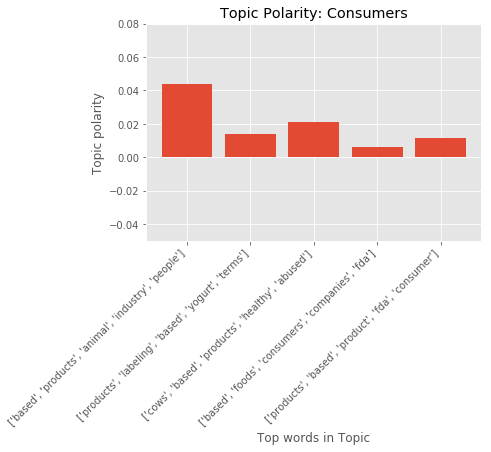

In [63]:
alltopics_wordscut_cons = [list1[:5] for list1 in alltopics_top_words_rev_cons]
x_cons = range(len(lda_cons.components_))
my_xticks_cons = alltopics_wordscut_cons
plt.xticks(x, my_xticks_cons, rotation =45, ha='right')
plt.bar(x_cons,topic_polarity_cons)
plt.ylim(ymin = -0.05)
plt.ylim(top=0.08)
plt.xlabel("Top words in Topic")
plt.ylabel("Topic polarity")
plt.title("Topic Polarity: Consumers")

Text(0.5, 1.0, 'Topic Subjectivity: Consumers')

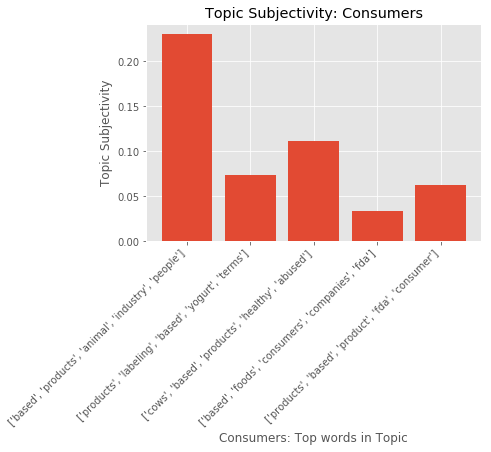

In [64]:
alltopics_wordscut_cons = [list1[:5] for list1 in alltopics_top_words_rev_cons]
x_cons = range(len(lda_cons.components_))
my_xticks_cons = alltopics_wordscut_cons
plt.xticks(x_cons, my_xticks_cons, rotation = 45, ha='right')
plt.bar(x_cons,topic_subjectivity_cons)
plt.xlabel("Consumers: Top words in Topic")
plt.ylabel("Topic Subjectivity")
plt.title("Topic Subjectivity: Consumers")

**Conclusions about the consumer sentiment analysis:

It is evident that there is a change in the top words in each topic in comparison to the overall comments sentiment analysis. Most of the words are "products", "labeling", "consumers", "healthy", among others, which may be concerns that consumers may have regarding this issue. 

## Industry Group Sentiment Analysis:

In [65]:
vocab_size = 5000
# CountVectorizer does tokenization and can remove terms that occur too frequently, not frequently enough, or that are stop words

# document frequency (df) means number of documents a word appears in
vectorizer_fi = CountVectorizer(max_df=0.70,
                                min_df=20,
                                max_features=vocab_size,
                                stop_words='english')
X_fi = vectorizer_fi.fit_transform(commentlist_foodind)


lda_fi = LatentDirichletAllocation(n_components = 5, learning_method='online', random_state=300)
lda_fi.fit(X_fi)
commentlist_str_fi=str(commentlist_foodind)

commentlist_fi_blob = TextBlob(commentlist_str_fi)
commentlist_fi_pol=commentlist_fi_blob.sentiment.polarity
commentlist_fi_subj=commentlist_fi_blob.sentiment.subjectivity
print(commentlist_fi_pol, commentlist_fi_subj)
topic_word_distributions_fi = np.array([topic_word_pseudocounts_fi / np.sum(topic_word_pseudocounts_fi)
                                     for topic_word_pseudocounts_fi in lda_fi.components_])

num_top_words_fi = 20
num_topics_fi =5

print('Displaying the top %d words per topic and their probabilities within the topic...' % num_top_words_fi)
print() 

for topic_idx_fi in range(num_topics_fi):  
    print('[Topic ', topic_idx_fi, ']', sep='')
    sort_indices_fi = np.argsort(topic_word_distributions_fi[topic_idx_fi])[::-1]
    for rank_fi in range(num_top_words_fi):
        word_idx_fi = sort_indices_fi[rank_fi]
        print(vectorizer_fi.get_feature_names()[word_idx_fi], ':', topic_word_distributions_fi[topic_idx_fi, word_idx_fi])
    print()

0.12431266110503061 0.46826557806680863
Displaying the top 20 words per topic and their probabilities within the topic...

[Topic 0]
animal : 0.06106838191522685
big : 0.025450539771981917
choose : 0.02475992328915296
consumer : 0.024590597187801305
environment : 0.024326756507355815
stores : 0.024279640033133505
restaurants : 0.023724223387300084
competition : 0.012697739503682068
losing : 0.012514742792366041
american : 0.012440996014437955
confused : 0.012421131182968044
alternatives : 0.012420401442453237
know : 0.012382327468720178
items : 0.012379344479492477
contain : 0.01234522952910671
differences : 0.012339341557306037
produced : 0.012325737282340547
cruelty : 0.012315798379169962
profits : 0.01231517292991735
soy : 0.012308570369456678

[Topic 1]
cows : 0.07386760934393785
abused : 0.03738243678889681
products : 0.03445000581395763
healthy : 0.032366467698767144
aren : 0.028405908396560098
want : 0.024517914698753567
buying : 0.023030813937541958
cruel : 0.020350306619627095

In [66]:
alltopics_top_words_rev_fi = []
top_words_fi =np.zeros(len(lda_fi.components_))
for topic_idx_fi, word_dist_fi in enumerate(lda_fi.components_):
    sort_indices_fi = np.argsort(topic_word_distributions_fi[topic_idx_fi])[::-1]
    top_words_fi = [vectorizer_fi.get_feature_names()[word_idx_fi] for word_idx_fi in sort_indices_fi]
    alltopics_top_words_rev_fi.append(top_words_fi)
    print('Topic', topic_idx_fi, ':', ', '.join(top_words_fi))

Topic 0 : animal, big, choose, consumer, environment, stores, restaurants, competition, losing, american, confused, alternatives, know, items, contain, differences, produced, cruelty, profits, soy, industry, cheese, information, cashew, commissioner, agriculture, people, almond, better, gottlieb, scott, understanding, health, dear, recent, attempting, intentionally, best, protecting, simply, benefits, survey, consumers, food, line, public, production, council, yogurt, mind, milks, growth, reality, fda, doing, thinking, foundation, suppress, percent, international, success, 90, biggest, manipulate, concluded, commonplace, homes, waking, communities, horrors, wreaks, havoc, sincerely, highly, animals, aware, obvious, wrong, factory, exists, farms, reason, stupid, vegan, stop, words, prefer, does, buy, fully, products, family, regarding, thanks, humans, fact, don, like, increasingly, realize, abuse, butter, time, ethical, term, farming, want, buying, cow, planet, use, meat, used, labeling

Topic 2 : products, consumers, industry, almond, people, product, use, food, milks, labeled, health, animals, cows, nutritional, cow, cheese, animal, labeling, believe, called, soy, non, real, know, used, butter, need, make, standards, names, just, term, confusion, plants, time, market, thank, alternatives, children, public, clearly, protein, word, don, fda, drinks, like, think, buy, false, fake, yogurt, way, vegan, nutrition, purchase, coconut, allow, want, similar, value, words, issue, long, stop, label, percent, beverage, farmers, water, confused, dont, understand, derived, federal, nut, needs, cream, manufacturers, confusing, free, enforce, farm, labels, terms, content, comes, clear, does, ingredients, let, away, healthy, drink, nutrients, misleading, buying, place, using, humans, sure, important, come, halo, imitators, believed, diets, years, packaging, better, change, human, consumer, dear, ice, decades, difference, right, cruelty, care, essential, feel, fact, liquid, trying, mea

Topic 4 : foods, fda, consumers, beverages, misleading, enforcement, request, respectfully, label, companies, non, labels, alternative, form, making, amendment, truthful, seeking, policy, rights, limit, change, refrain, communicate, document, guidance, thank, comments, opportunity, commissioner, purchase, equal, display, imitators, gottlieb, efforts, survey, changes, appreciate, dietary, rules, nutrients, measure, identity, consumer, industry, current, attached, proud, file, including, meeting, submit, nutritional, supporter, recommended, enforce, require, intake, american, free, regarding, clear, nutrition, addition, allergies, essential, emulsifiers, use, ipsos, traits, conducted, ingredients, data, examining, key, shoppers, standards, 2018, suggesting, impressions, value, suggests, believe, firm, names, unnecessary, new, showed, differences, terminology, encourage, 70, legal, fdas, marketplace, standpoint, drug, provide, aware, halo, understanding, concern, highly, origin, percent, 

C:\Users\norac\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3604: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')


Text(0.5, 1.0, 'Topic Polarity: Food Industry')

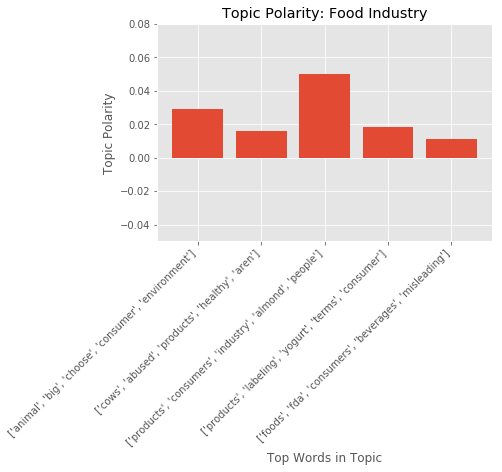

In [69]:
proportions_fi = lda_fi.transform(X_fi)
x_fi = proportions_fi[:,0]*commentlist_fi_pol #this is the calculation that we want happening

topic_polarity_fi = [(proportions_fi[:,topic]*commentlist_fi_pol).sum()/proportions_fi.shape[0] for topic in range(proportions_fi.shape[1])]
topic_subjectivity_fi = [(proportions_fi[:,topic]*commentlist_fi_subj).sum()/proportions_fi.shape[0] for topic in range(proportions_fi.shape[1])]

alltopics_wordscut_fi = [list1[:5] for list1 in alltopics_top_words_rev_fi]
x_fi = range(len(lda_fi.components_))
my_xticks_fi = alltopics_wordscut_fi
plt.xticks(x_fi, my_xticks_fi, rotation =45, ha='right')
plt.bar(x_fi,topic_polarity_fi)
plt.ylim(ymin = -0.05)
plt.ylim(top=0.08)
plt.xlabel("Top Words in Topic")
plt.ylabel("Topic Polarity")
plt.title("Topic Polarity: Food Industry")

Text(0.5, 1.0, 'Topic Subjectivity: Food Industry')

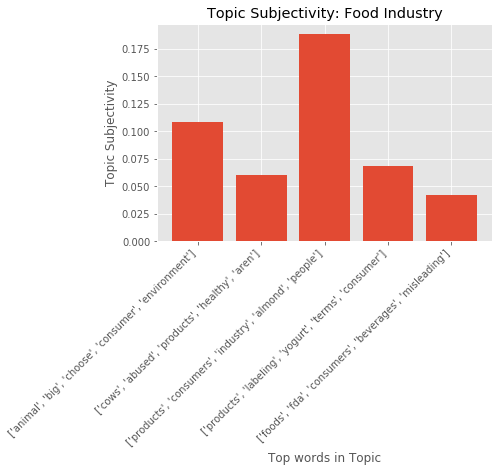

In [71]:
alltopics_wordscut_fi = [list1[:5] for list1 in alltopics_top_words_rev_fi]
x_fi = range(len(lda_fi.components_))
my_xticks_fi = alltopics_wordscut_fi
plt.xticks(x_fi, my_xticks_fi, rotation = 45, ha='right')
plt.bar(x_fi,topic_subjectivity_fi)
plt.xlabel("Top words in Topic")
plt.ylabel("Topic Subjectivity")
plt.title("Topic Subjectivity: Food Industry")

 When we perfomed sentiment analysis for the food industry, we observed a change in the top words in each topic. Most of those words are related words such as: "animal", "abuse", "consumer", "healthy". This provides insight into the different perspective and positions that the different sectors of the food industry may have. 

**Conclusion about the Sentiment Analysis:

When we perfomed sentiment analysis for the overall comments, the pattern for the top words in eah topic was not clear. This led us to conduct further analysis discriminating between individual consumers and the food industry. In both analyses, we found some words that appeared repeatedly in each analysis, which maycorrespond with the concerns, agenda and interests of each group.

# Predictive modeling:

To get a more accurate sense of the distribution of viewpoints in the dataset, we manually labeled 300 comments to train the dataset via a cross-validation method. Comment labeling was broken down along several different frontiers, since some comments talk about the labeling legislation, some rail against animal abuse, and some talk only about dietary preferences. Additionally, we wanted to label attachment comments as neutral since we were unable to analyze that text. A brief description of our labeling categories is as follows:

**Against**: against the labeling changes (or "let plant-based milks continue to be milk")
**Support**: supporting the labeling distinctions (or "plant milk should be juice")
**Anti-Dairy**: comments that are primarily about hating the dairy industry ("I want my milk from plants, not abused cows")
**Attached**: only attachments included, so no text to analyze
**Anti-Diet**: comments that primarily refer to non-dairy dietary habits (such as "I drink soy milk because I'm allergic")
**Pro-Diet**: comments that only talk about the benefits of dairy in the diet

Note: the code below was written to convert the dictionaries from above into a data frame. Although the initial predictive modeling analysis was derived from this data frame, it became apparent that would not be feasible once data had been manually labeled. Because our data was pulled from urls, the initial order of the comments was dependent oh how regulations.gov sorted comments on their website. We've realized that, while the number of comments has remained the same, the order of the comments changes periodically. To prevent the label analysis from becoming obsolete, the code below is reading in a downloaded version of the data frame created.

In [72]:
data_array_predict = pd.DataFrame.from_csv("trying my best 2.csv")
label3 = ["Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Support",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Attached",
"Against",
"Anti-Dairy",
"Anti-Diet",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Pro-Dairy",
"Anti-Dairy",
"Anti-Diet",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Support",
"Pro-Diet",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Support",
"Against",
"Against",
"Against",
"Against",
"Against",
"Support",
"Against",
"Support",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Against",
"Support",
"Support",
"Support",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Support",
"Against",
"Against",
"Against",
"Support",
"Support",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Attached",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Pro-Diet",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Pro-Diet",
"Anti-Dairy",
"Pro-Diet",
"Anti-Dairy",
"Against",
"Against",
"Support",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Anti-Diet",
"Anti-Diet",
"Against",
"Against",
"Against",
"Against",
"Against",
"Attached",
"Against",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Pro-Diet",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Diet",
"Against",
"Anti-Dairy",
"Against",
"Support",
"Support",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Dairy",
"Support",
"Against",
"Against",
"Against",
"Support",
"Support",
"Against",
"Support",
"Anti-Dairy",
"Support",
"Attached",
"Against",
"Against",
"Support",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Against",
"Support",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Support",
"Support",
"Anti-Diet",
"Anti-Diet",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Against",
"Support",
"Anti-Dairy",
"Anti-Dairy",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Anti-Dairy",
"Support",
"Anti-Dairy",
"Against",
"Against",
"Anti-Dairy",
"Against",
"Anti-Dairy",
"Against",
"Support",
"Against",
"Anti-Dairy",
"Against",
"Against",
"Against",
"Support",
"Against",
"Against",
"Against",
"Against",
"Against"
]

training_labels = label3+list(['None']*(len(data_array_predict)-(len(label3))))
data_array_predict['labels'] = pd.Series(training_labels, index=data_array_predict.index)
data_array_predict.sort_values(['# Comments Attached', '# Comments Received'], inplace = False)
comment_text4 = data_array_predict['CommentTest'][:299]
comment_main = data_array_predict['CommentTest'][299:]

label_text5 = data_array_predict['labels'][:299]
label_main = data_array_predict['labels'][299:]

from sklearn.feature_extraction.text import CountVectorizer

count = CountVectorizer(min_df=5, stop_words="english", max_df=0.8)
X = count.fit(comment_text4)
vocab = X.vocabulary_
print('Number of unique words is',len(vocab))
X = count.fit_transform(comment_text4)
indices = range(len(comment_text4))
flattened_train = X.reshape(len(comment_text4), -1) 
num_train = len(comment_text4)
shuffled_indices = np.random.permutation(indices)

train_frac = 0.5
train_indices = shuffled_indices[:int(train_frac*num_train)]
validation_indices = shuffled_indices[int(train_frac*num_train):]
train_labels = np.array(label_text5)

C:\Users\norac\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: from_csv is deprecated. Please use read_csv(...) instead. Note that some of the default arguments are different, so please refer to the documentation for from_csv when changing your function calls
  """Entry point for launching an IPython kernel.


Number of unique words is 454


## Predictive Modeling Processes: KNeighbors, Random Forest, SVM
    
   Kneighbors: Although a program was used to choose the best number of neighbors, we found that any "k" other than 1 narrowed down the number of labels to only two or three--usually "Against" and "Anti-Dairy." 
   Using code for best hyperparameters, we also tested Random Forest and SVM cross-validation models to see if there was any improvement in predicted results. With these methods, the best predictive modeling we could get had four categories ("Support", "Attached", "Anti-Dairy", and "Against." Given the distinct differences between the seven categories listed above, K-Neighbors seemed to be the best predictive modeling method. 
   
   ### Kneighbors:

In [73]:
#commenting code out since best hyperparameter didn't help effectively choose best_k
num_folds = 5
k_fold = KFold(num_folds, True)
bestkn_cross_val_score = -np.inf
for k in [1, 2, 3,4, 5, 6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]:
    knfold_scores = []
    for train, validation in k_fold.split(indices):
        knclassifier = KNeighborsClassifier(n_neighbors=k)
        knclassifier.fit(flattened_train[train], 
                       train_labels[train]) 
        knpredicted_val_labels = knclassifier.predict(flattened_train[validation])
        knfold_score = f1_score(knpredicted_val_labels, train_labels[validation], average = 'weighted')
        knfold_scores.append(knfold_score)
    
        
        kncross_val_score = np.mean(knfold_scores)
    
    if kncross_val_score > bestkn_cross_val_score:  # assumes that a higher score is better
        bestkn_cross_val_score = kncross_val_score
        best_k = k
    print(k, knfold_score)

print('Best hyperparameter setting:', best_k)

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: Und

1 0.5537392209336902


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: Und

2 0.7171751412429378


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricW

3 0.6416245900991664


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricW

4 0.7390662637410765


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: Und

5 0.500898818695429


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricW

6 0.6301216470707997


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricW

7 0.6131746604159153


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: Und

8 0.7165128511818195


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

9 0.7713696747595054


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

10 0.7785086299542929


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

11 0.778281203356662


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

12 0.8109127399843411


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

13 0.738828967642527


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

14 0.713647885173309


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

15 0.6951842884046273


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

16 0.7102959777384266


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

17 0.7265834076717216


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


18 0.7736598815992214


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

19 0.5878730486359589


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

20 0.6329906071984185
Best hyperparameter setting: 11


In [74]:
final_knn_classifier = KNeighborsClassifier(n_neighbors=1)
final_knn_classifier.fit(flattened_train, train_labels)
knn_predicted_test_labels = final_knn_classifier.predict(flattened_train[validation_indices])
knn_test_set_error = np.mean(knn_predicted_test_labels != train_labels[validation_indices])
print(knn_test_set_error)

0.02666666666666667


['Against' 'Support' 'Anti-Dairy' ... 'Anti-Dairy' 'Against' 'Attached']

My barely qualified prediction of label breakdowns is:
Against : 4969
Anti-Dairy : 3535
Attached : 1883
Support : 1036
Pro-Dairy : 82
Anti-Diet : 63
Pro-Diet : 37



Text(0.5, 1.0, 'Predicted Breakdown of Comments')

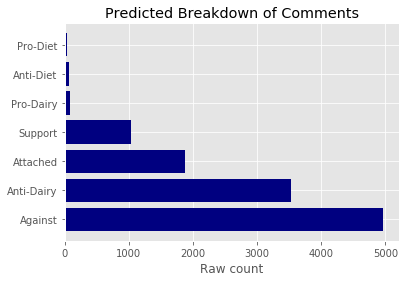

In [76]:
count2 = CountVectorizer(min_df = 50, stop_words = 'english', max_df = 0.8, vocabulary = vocab)
X2 = count2.fit(comment_main.values.astype('U'))
X2 = count2.fit_transform(comment_main.values.astype('U'))
flattened_test = X2.reshape(len(comment_main),-1)
knn_predicted_test_labels = final_knn_classifier.predict(flattened_test)
print(knn_predicted_test_labels)

wild_theories = Counter()

for i in knn_predicted_test_labels:
    wild_theories[i]+=1

print()
crazy_stuff = sorted(wild_theories.items(),reverse=True,key=itemgetter(1))

print("My barely qualified prediction of label breakdowns is:")
for token, count in crazy_stuff:
    print(token,':',count)
    
plt.style.use('ggplot')

labelslabels = [lemma for lemma, count in crazy_stuff]
countscounts = [count for lemma, count in crazy_stuff]

print()

plt.barh(labelslabels, countscounts, align='center',
        color='navy', ecolor='black')
plt.yticks(labelslabels)
#ax.set_yticklabels('Organizations Present in Comments')
#ax.yaxis()  # labels read top-to-bottom
plt.xlabel('Raw count')
plt.title('Predicted Breakdown of Comments')

### Summary of KNN Predictive Model

The predictive breakdown above shows what we found to be the best model through our cross-validation processes. This model is by no means perfect. The assignment of the "Attached" label is fairly random, and comparing the "speculation" column in the dataframe below to the comments reveals a few misses. That being said, we are fairly confident through labeling the training data manually, as well as looking at overall "speculation" trends, that this model provides a reasonable breakdown of opinions for FDA public comments. Even accounting for potential error, the results are clear: many of the comments posted are Anti-Dairy or "Against" the proposed FDA legislation to alter the labeling of plant-based milk products.

Below is the code for the Random Forest Classification and Support Vector Machine models.

In [79]:
speculation = list(train_labels)+list(knn_predicted_test_labels)
data_array_predict['speculation'] = pd.Series(speculation, index=data_array_predict.index)
data_array_predict

,CommentTest,# Comments Attached,# Comments Received,labels,speculation
CommentTitle,,,,,
"Comment from Melissa Anonymous, NA","As a consumer of plant-based milk products, I ...",0,1,Against,Against
"Comment from Carrie Cadieux, NA","As a consumer of plant-based milk products, I ...",0,1,Against,Against
Comment from Mark Aziz,"As an American consumer, I support the continu...",0,1,Against,Against
Comment from Shrenik Sanghvi,Products that have been made with dairy in the...,0,1,Against,Against
Comment from Rachel Breeding,"I, Rachel Breeding, respectfully request that ...",1,1,Against,Against
Comment from C Francis-C,"Soy milk, almond milk, rice milk and other pla...",0,1,Against,Against
"Comment from Michelle Schwegmann, The Herbivore Clothing Co LLC","As a consumer of plant-based milk products, I ...",0,1,Against,Against
Comment from Amanda Carpiniello,We respectfully request that the FDA refrain f...,0,1,Against,Against
"Comment from Nekesha Marshall, NA","As a consumer of plant-based milk products, I ...",0,1,Against,Against


### Random Forest:

In [80]:


hyperparameter_settings = [(num_trees, max_depth)
                           for num_trees in [5, 10, 15, 20, 50, 100, 150, 200, 250, 300]
                           for max_depth in [2, 3, 4, 5, 6, None]] 

num_folds = 5
k_fold = KFold(num_folds, True)
best_hyperparam_setting = None
bestrfc_cross_val_score = -np.inf  # assumes that a higher score is better
for hyperparam_setting in hyperparameter_settings:
    num_trees, max_depth = hyperparam_setting
    fold_scores = []
    for train, validation in k_fold.split(indices):
        classifier = RandomForestClassifier(n_estimators=num_trees,
                                            max_depth=max_depth,
                                            random_state=0)
        classifier.fit(flattened_train[train], 
                       train_labels[train]) 
        rfcpredicted_val_labels = classifier.predict(flattened_train[validation])
        fold_score = f1_score(rfcpredicted_val_labels, train_labels[validation], average = 'weighted')
        fold_scores.append(fold_score)
    
    
        rfccross_val_score = np.mean(fold_scores)
    if rfccross_val_score > bestrfc_cross_val_score:  # assumes that a higher score is better
        bestrfc_cross_val_score = rfccross_val_score
        best_alpha = hyperparam_setting

print('Best hyperparameter setting:', best_alpha)

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricW

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

Best hyperparameter setting: (300, None)


In [81]:
final_rf_classifier = RandomForestClassifier(n_estimators=best_alpha[0],
                                             max_depth=best_alpha[1],
                                             random_state=0)
final_rf_classifier.fit(flattened_train, train_labels)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=300, n_jobs=None,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

['Against' 'Against' 'Anti-Dairy' ... 'Anti-Dairy' 'Against' 'Anti-Dairy']

My barely qualified prediction of label breakdowns is:
Against : 7157
Anti-Dairy : 3317
Support : 601
Attached : 530



Text(0.5, 1.0, 'Predicted Breakdown of Comments for RFC')

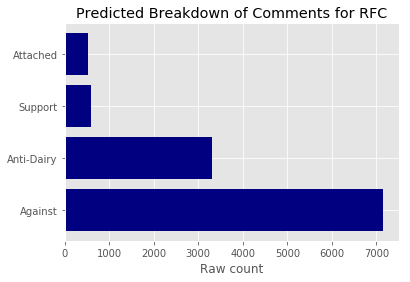

In [82]:

final_rf_classifier.fit(flattened_train, train_labels)
rf_predicted_test_labels = final_rf_classifier.predict(flattened_test)
print(rf_predicted_test_labels)

no_way = Counter()
for i in rf_predicted_test_labels:
    no_way[i]+=1

print()
crazier_stuff = sorted(no_way.items(),reverse=True,key=itemgetter(1))

print("My barely qualified prediction of label breakdowns is:")
for token, count in crazier_stuff:
    print(token,':',count)
    
plt.style.use('ggplot')

labelslabels2 = [lemma for lemma, count in crazier_stuff]
countscounts2 = [count for lemma, count in crazier_stuff]

print()

plt.barh(labelslabels2, countscounts2, align='center',
        color='navy', ecolor='black')
plt.yticks(labelslabels2)
#ax.set_yticklabels('Organizations Present in Comments')
#ax.yaxis()  # labels read top-to-bottom
plt.xlabel('Raw count')
plt.title('Predicted Breakdown of Comments for RFC')

### SVM

In [83]:
Cs = np.logspace(-4, 1, 2, 4, 10)
svm_hyperparameter_settings = [[C] for C in Cs]  # fill this with hyperparameter settings that you want to try
X = flattened_train
Y= train_labels

best_hyperparam_setting = None
bestsvm_cross_val_score = -np.inf  # assumes that a higher score is better
for hyperparam_setting in svm_hyperparameter_settings:
    cfold_scores = []
    C = hyperparam_setting[0]
    for k, (train, validation) in enumerate(k_fold.split(X, Y)):
        clf = svm.SVC(kernel='rbf', gamma='auto',C=C)
        clf.fit(X[train], Y[train])
        
        ypred = clf.predict(X[validation])
        yval = Y[validation]
        cfold_score = f1_score(ypred,yval, average = 'weighted')
        cfold_scores.append(cfold_score)
        
        svmcross_val_score = np.mean(cfold_scores)
    print(svmcross_val_score,hyperparam_setting)
    if svmcross_val_score > bestsvm_cross_val_score:  # assumes that a higher score is better
        bestsvm_cross_val_score = svmcross_val_score
        best_c = hyperparam_setting[0]

print('Best hyperparameter setting:', best_c)

C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

0.7212776468433558 [0.0001]


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\norac\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-sco

0.8021294562927821 [10.0]
Best hyperparameter setting: 10.0


C:\Users\norac\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


['Against' 'Against' 'Anti-Dairy' ... 'Anti-Dairy' 'Against' 'Anti-Dairy']

My barely qualified prediction of label breakdowns for SVM is:
Against : 7157
Anti-Dairy : 3317
Support : 601
Attached : 530



Text(0.5, 1.0, 'Predicted Breakdown of Comments for SVM')

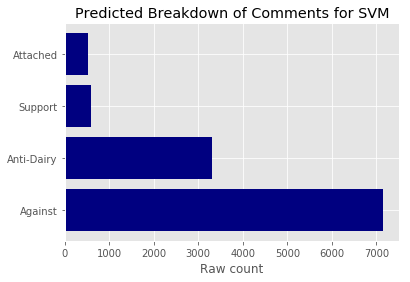

In [84]:
clf2 = svm.SVC(kernel='rbf', C=best_c)
clf2.fit(flattened_train, train_labels)
svm_predicted_test_labels = clf2.predict(flattened_test)
print(svm_predicted_test_labels)

why_not = Counter()
for i in svm_predicted_test_labels:
    why_not[i]+=1

print()
the_craziest = sorted(no_way.items(),reverse=True,key=itemgetter(1))

print("My barely qualified prediction of label breakdowns for SVM is:")
for token, count in the_craziest:
    print(token,':',count)
    
plt.style.use('ggplot')

labelslabels3 = [lemma for lemma, count in the_craziest]
countscounts3 = [count for lemma, count in the_craziest]

print()

plt.barh(labelslabels3, countscounts3, align='center',
        color='navy', ecolor='black')
plt.yticks(labelslabels3)
#ax.set_yticklabels('Organizations Present in Comments')
#ax.yaxis()  # labels read top-to-bottom
plt.xlabel('Raw count')
plt.title('Predicted Breakdown of Comments for SVM')

# Project Conclusion:

While we are confident this analysis provides solid insight into the regulations.gov comments, we do recognize that we have only looked at a portion of the data. It's worth noting there were over 2,000 attachment-based comments that we were unable to process with these methods, as well as possible mail-in comments that were not uploaded to regulations.gov. The intention is for this work to be informative rather than decisive. Our analysis provides more insight into some of the interested parties and how they use and understand plant-based products, but it will ultimately be up to the Food and Drug Administration to determine which voices to listen to in this conversation.

# Code Resources
To help get our initial batch download from regulations.gov, we based our code off this: 
https://github.com/upenndigitalscholarship/regulations-gov-comment-scraper